In [1]:
#%autoreload
import pickle
import numpy as np
import pandas as pd
import plotly.graph_objs as go
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path
import matplotlib.colors as mcolors

from scipy import stats

#import seaborn as sns
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
import time
import os,os.path
import time
from datetime import datetime, timezone
import pytz
from itertools import cycle
from scipy import stats, ndimage
from skimage.transform import hough_line, hough_line_peaks
from skimage.filters import threshold_yen
from functions.HXRSS_tool_plotter_limit import Bragg_plotter_limit # Crystal model 
import scipy.optimize as opt
from scipy.optimize import curve_fit
from scipy.optimize import leastsq
from bayes_opt import BayesianOptimization, UtilityFunction
from functions.HXRSS_Bragg_fun_lstsq import HXRSSopt, HXRSSopt_roll
from functions.HXRSS_tool_plotter import Bragg_plotter, Bragg_plotter_roll
from functions.HXRSS_Bragg_fun import HXRSS_singleLine#
import json

import re

In [2]:
%load_ext autoreload

In [86]:
#%
%autoreload
from functions import Mechanics
from functions.HXRSS_Bragg_fun import HXRSS_singleLine#


## Crystal model setup

In [4]:
def getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle,ph_vals,pitches):
    phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle)
    phenH, pitches_H, Hs = [],[], []    
    for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
        ph_axis, pa_axis = [], []
        for ph_value, pa_value in zip(phen, pangle):
            # Only keep photon energies within a close range of the spectrometer image range
            if ph_value > ph_vals[0]-170 and ph_value < ph_vals[-1]+170 and pa_value >= min(pitches)-1.2 and pa_value <= max(pitches)+1.2:
                ph_axis.append(ph_value)
                pa_axis.append(pa_value)
        if len(ph_axis)>0:
            phenH.append(ph_axis)
            pitches_H.append(pa_axis)
            Hs.append(gid)
    return phenH, pitches_H, Hs

def getlocal_Hplanes_roll(hmax, kmax, lmax, dthp, dthy, dthr, alpha, pitch_angle,ph_vals,rolls):
    phen_list, r_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_roll(hmax, kmax, lmax, dthp, dthy, dthr, alpha, pitch_angle)
    phenH, rolls_H, Hs = [],[], []    
    for phen, rangle, gid in zip(phen_list, r_angle_list, gid_list):
        ph_axis, ra_axis = [], []
        for ph_value, ra_value in zip(phen, rangle):
            # Only keep photon energies within a close range of the spectrometer image range
            if ph_value > ph_vals[0]-170 and ph_value < ph_vals[-1]+170 and ra_value >= min(rolls)-1.2 and ra_value <= max(rolls)+1.2:
                ph_axis.append(ph_value)
                ra_axis.append(ra_value)
        if len(ph_axis)>0:
            phenH.append(ph_axis)
            rolls_H.append(ra_axis)
            Hs.append(gid)
    return phenH, rolls_H, Hs


In [5]:
colors=['r','w','b','m','c','r','g']

# Model parameters, these should remain unchanged unless the photon energy is above 15 keV where hmax = 6, kmax = 6, lmax = 7.
hmax = 6
kmax = 6
lmax = 7
dthp = 1.14473852e+00
dthy = 1.10991002e+00
dthr = -1.01729259e+00
alpha =  1.07575895e-02#0.00815
en = 0#63#0#-16.85196215
Ecorr = 0#-1.68970353e+01

#dispersion
dEdP = 0.7*0.15
Ecentral = 12407

# [ 1.14473852e+00  1.10991002e+00 -1.01729259e+00  1.07575895e-02
#  -1.68970353e+01]
#[  1.15581834   1.78199812   0.66586982  -0.03075924 -16.85196215]

In [6]:
def roll_in_database(filepath):
    roll_angle = None
    tt = np.load(filepath, allow_pickle=True)
    doocs_label = tt['doocs_channel']
    if "XFEL.FEL/UNDULATOR.SASE2/MONOPA.2252.SA2/ANGLE" in doocs_label:#
        mono_no_pitch = 1
        try:
            filedata = np.loadtxt(
                filepath+'_status.txt', dtype='str', delimiter=',', skiprows=1)
            ra_pos = np.where(
                filedata == 'XFEL.FEL/UNDULATOR.SASE2/MONORA.2252.SA2/ANGLE')
            ra_row = ra_pos[0][0]
            roll_angle = float(filedata[ra_row][1])
            print('Monochromator 1 image found; \nMachine status file found: roll angle=' + str(np.round(roll_angle, 4)) + ' deg \n')
        except:
            try:
                berlin = pytz.timezone('Europe/Berlin')
                df_db['date_full'] = pd.to_datetime(df_db['date_full'], utc=True)
                df_db['date_full'] = df_db['date_full'].dt.tz_convert("Europe/Paris")
                dt = date_time_obj
                dt = dt.replace(tzinfo=berlin)
                roll = df_db['roll_angle'].loc[(df_db['date_full'] == nearest(df_db['date_full'], dt)) ]
                roll_angle = float(roll.iloc[0])
                print('Monochromator 1 image found; from database: roll angle=' + str(np.round(roll_angle, 4)) + ' deg \n')
            except:
                roll_angle = 1
                print('Monochromator 1 image found; Default roll angle set (1 deg).')
    elif "XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE" in doocs_label:
        mono_no_pitch = 2
        try:
            filedata = np.loadtxt(
                filepath+'_status.txt', dtype='str', delimiter=',', skiprows=1)
            ra_pos = np.where(
                filedata == 'XFEL.FEL/UNDULATOR.SASE2/MONORA.2307.SA2/ANGLE')
            ra_row = ra_pos[0][0]
            roll_angle = float(filedata[ra_row][1])
            print('Monochromator 2 image found; \nMachine status file found: roll angle=' + str(np.round(roll_angle, 4)) + ' deg \n')
        except:
            try:
                berlin = pytz.timezone('Europe/Berlin')
                df_db['date_full'] = pd.to_datetime(df_db['date_full'], utc=True)
                df_db['date_full'] = df_db['date_full'].dt.tz_convert("Europe/Paris")
                dt = date_time_obj
                dt = dt.replace(tzinfo=berlin)
                roll = df_db['roll_angle'].loc[(df_db['date_full'] == nearest(df_db['date_full'], dt)) ]
                roll_angle = float(roll.iloc[0])
                print('Monochromator 2 image found; from database: roll angle=' + str(np.round(roll_angle, 4)) + ' deg \n')
            except:
                roll_angle = 1
                print('Monochromator 2 image found; Default roll angle set (1 deg).')
    else: 
        mono_no_pitch = 0
        print('No roll angle')
    return roll_angle

## Iterate scans and plot model on top

In [7]:
directory = r'oct2024.nosync/' 
pitch_tot = []
pitch_dict = {}
seeding_energy_tot = []
seeding_energy_dict = {}
roll_tot = []
roll_dict = {}
Hquery_dict = {}
m=0
datafiles = []
thresfact = 1/10
do_analysis = False
for file in sorted(os.listdir(directory)):  
    # if m>1:
        # break
    filename = os.fsdecode(file)
    if filename.endswith('cor2d.npz'):# and (filename.find("20240831")>=0 or filename.find("20240901")>=0):
        xfromnpphen = False
        filepath=os.path.join(directory, file)
        #datafiles.append(filepath)
        tt = np.load(filepath, allow_pickle=True)
        corr2d = tt['corr2d']
        orig_image = tt['corr2d'].T
        spec_hist = tt['spec_hist']
        doocs_scale = tt['doocs_scale']
        np_phen = tt['phen_scale']#+en
        doocs_vals_hist = tt['doocs_vals_hist']
        doocs_label = tt['doocs_channel']
        date_raw=filename[ 0 : 17 ]
        date_time_obj = datetime.strptime(date_raw, '%Y%m%d-%H_%M_%S')
        # check if the image corresponds to a crystal pitch angle scan. MONOPA 
        print(doocs_label)
        if "XFEL.FEL/UNDULATOR.SASE2/MONOPA.2252.SA2/ANGLE" in doocs_label or "XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE" in doocs_label:
            datafiles.append(filepath)
            date_raw=filename[ 0 : 17 ]
            date_time_obj = datetime.strptime(date_raw, '%Y%m%d-%H_%M_%S') #strip date from image filename
            m=m+1
            print(m)
            if do_analysis:
                # Search for corresponding roll angle from the status file or the database pickle file.
                roll_angle = roll_in_database(filepath)
                

                xfromnpphen = True

                if len(doocs_scale) != len(orig_image):
                    np_doocs=doocs_scale[:-1]
                else:
                    np_doocs=doocs_scale
                # if np_phen.min()>9100:
                #     np_phen -= 220.205399303666535
                pcentral = np.argmin(np.abs(tt['phen_scale']-Ecentral))
            
                x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
                np_phen = x
                np_phen += en
                # Original image plot
                fig, ax = plt.subplots(1, 1, figsize=(12, 6))
                fig.suptitle(date_raw+' Roll angle: '+str(np.round(roll_angle,3))+' deg', fontsize=14)
                
                plot = ax.pcolormesh(np_doocs, np_phen, orig_image, cmap='viridis', shading='auto')
                # phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle)
                
                # for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
                #     ph_axis, pa_axis = [], []
                #     for ph_value, pa_value in zip(phen, pangle):
                #         # Only keep photon energies within a close range of the spectrometer image range
                #         if ph_value > np_phen[0]-170 and ph_value < np_phen[-1]+170 and pa_value >= min(doocs_scale)-1.2 and pa_value <= max(doocs_scale)+1.2:
                #             ph_axis.append(ph_value)
                #             pa_axis.append(pa_value)
                #     if ph_axis == []:
                #         pass
                #     else:
                #         plt.plot(pa_axis, ph_axis, '--', label=gid, linewidth=3)
                #         pass

                Eph_H, pitches_H, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle,np_phen,np_doocs)
                Hquery_dict[str(m)] = Hquery
                for Hidx, (ph_axis,pa_axis,gid) in enumerate(zip(Eph_H,pitches_H,Hquery)):
                    EBragg = [ph + Ecorr for ph in ph_axis]
                    plt.plot(pa_axis, EBragg, '-.', label=gid)
                ax.set_xlabel('Pitch Angle (deg)')
                ax.set_ylabel(r'$E_{ph}$ [eV]')
                ax.set_ylim(np_phen[0], np_phen[-1])
                ax.set_xlim(doocs_scale[0], doocs_scale[-1])
                ax.legend(loc=8, bbox_to_anchor=(0.35,-0.05))


                #extract pitch, roll and energy
                


                filter_arr = []
                seeding_energy = []
                thres = spec_hist.max()*thresfact



                pcentral = np.argmin(np.abs(tt['phen_scale']-Ecentral))
            
                x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
                # en = 72
                #x = np_phen
                # if xfromnpphen:
                #     x = np_phen.copy()
                    
                # else:
                #     E0=9010
                #     px1=1000
                #     ev_px = 0.35
                    
                #     start = E0 - px1*ev_px
                #     stop = E0 + (1280 - px1) * ev_px
                #     x = np.linspace(start, stop, num=1280)
                for spectrum in spec_hist:

                    if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
                        filter_arr.append(True)
                        seeding_energy.append(x[np.argmax(spectrum)])
                    else:
                        filter_arr.append(False)
                
                #seems to be somewhat incorrect --> use different
                # for idx,spectrum in enumerate(corr2d):
                #     x = np_phen
                #     if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
                #         filter_arr.append(True)
                #         seeding_energy.append(x[np.argmax(spectrum)])
                #     else:
                #         filter_arr.append(False)

                pitch = tt['doocs_vals_hist'][filter_arr]
            # pitch = np_doocs[filter_arr]
                roll = np.ones(pitch.size)*roll_angle
                pitch_tot += pitch.tolist()
                roll_tot += roll.tolist()
                seeding_energy_tot += seeding_energy
                pitch_dict[str(m)] = pitch
                roll_dict[str(m)] = roll_angle
                seeding_energy_dict[str(m)] = seeding_energy
                
                ax.scatter(pitch,seeding_energy,color='r',marker='x')

                plt.show()
        elif "XFEL.FEL/UNDULATOR.SASE2/MONORA.2252.SA2/ANGLE" in doocs_label or "XFEL.FEL/UNDULATOR.SASE2/MONORA.2307.SA2/ANGLE" in doocs_label:
            datafiles.append(filepath)
            date_raw=filename[ 0 : 17 ]
            date_time_obj = datetime.strptime(date_raw, '%Y%m%d-%H_%M_%S') #strip date from image filename
            m=m+1
            print(m)
            if do_analysis:
                # Search for corresponding roll angle from the status file or the database pickle file.
                if "XFEL.FEL/UNDULATOR.SASE2/MONORA.2252.SA2/ANGLE" in doocs_label:#
                    mono_no_pitch = 1
                    try:
                        filedata = np.loadtxt(
                            filepath+'_status.txt', dtype='str', delimiter=',', skiprows=1)
                        pa_pos = np.where(
                            filedata == 'XFEL.FEL/UNDULATOR.SASE2/MONOPA.2252.SA2/ANGLE')
                        pa_row = pa_pos[0][0]
                        pitch_angle = float(filedata[pa_row][1])
                        print('Monochromator 1 image found; \nMachine status file found: pitch angle=' + str(np.round(pitch_angle, 4)) + ' deg \n')
                    except:
                        try:
                            berlin = pytz.timezone('Europe/Berlin')
                            df_db['date_full'] = pd.to_datetime(df_db['date_full'], utc=True)
                            df_db['date_full'] = df_db['date_full'].dt.tz_convert("Europe/Paris")
                            dt = date_time_obj
                            dt = dt.replace(tzinfo=berlin)
                            pitch = df_db['pitch_angle'].loc[(df_db['date_full'] == nearest(df_db['date_full'], dt)) ]
                            pitch_angle = float(pitch.iloc[0])
                            print('Monochromator 1 image found; from database: pitch angle=' + str(np.round(pitch_angle, 4)) + ' deg \n')
                        except:
                            pitch_angle = 90
                            print('Monochromator 1 image found; Default pitch angle set (90 deg).')
                elif "XFEL.FEL/UNDULATOR.SASE2/MONORA.2307.SA2/ANGLE" in doocs_label:
                    mono_no_pitch = 2
                    try:
                        filedata = np.loadtxt(
                            filepath+'_status.txt', dtype='str', delimiter=',', skiprows=1)
                        pa_pos = np.where(
                            filedata == 'XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE')
                        pa_row = pa_pos[0][0]
                        pitch_angle = float(filedata[pa_row][1])
                        print('Monochromator 2 image found; \nMachine status file found: pitch angle=' + str(np.round(pitch_angle, 4)) + ' deg \n')
                    except:
                        try:
                            berlin = pytz.timezone('Europe/Berlin')
                            df_db['date_full'] = pd.to_datetime(df_db['date_full'], utc=True)
                            df_db['date_full'] = df_db['date_full'].dt.tz_convert("Europe/Paris")
                            dt = date_time_obj
                            dt = dt.replace(tzinfo=berlin)
                            pitch = df_db['pitch_angle'].loc[(df_db['date_full'] == nearest(df_db['date_full'], dt)) ]
                            pitch_angle = float(pitch.iloc[0])
                            print('Monochromator 2 image found; from database: pitch angle=' + str(np.round(pitch_angle, 4)) + ' deg \n')
                        except:
                            pitch_angle = 1
                            print('Monochromator 2 image found; Default pitch angle set (1 deg).')
                else: 
                    mono_no_roll = 0
                    print('No pitch angle')
                

                if len(doocs_scale) != len(orig_image):
                    np_doocs=doocs_scale[:-1]
                else:
                    np_doocs=doocs_scale

                pcentral = np.argmin(np.abs(tt['phen_scale']-Ecentral_orig))
            
                x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
                np_phen = x
                # if np_phen.min()>9100:
                #     np_phen -= 220.205399303666535
                #     xfromnpphen = True
                    
                # Original image plot
                fig, ax = plt.subplots(1, 1, figsize=(12, 6))
                fig.suptitle(date_raw+' pitch angle: '+str(np.round(pitch_angle,3))+' deg', fontsize=14)
                
                plot = ax.pcolormesh(np_doocs, np_phen, orig_image, cmap='viridis', shading='auto')
                # phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll_angle)
                
                # for phen, pangle, gid in zip(phen_list, p_angle_list, gid_list):
                #     ph_axis, pa_axis = [], []
                #     for ph_value, pa_value in zip(phen, pangle):
                #         # Only keep photon energies within a close range of the spectrometer image range
                #         if ph_value > np_phen[0]-170 and ph_value < np_phen[-1]+170 and pa_value >= min(doocs_scale)-1.2 and pa_value <= max(doocs_scale)+1.2:
                #             ph_axis.append(ph_value)
                #             pa_axis.append(pa_value)
                #     if ph_axis == []:
                #         pass
                #     else:
                #         plt.plot(pa_axis, ph_axis, '--', label=gid, linewidth=3)
                #         pass
                Eph_H, rolls_H, Hquery = getlocal_Hplanes_roll(hmax, kmax, lmax, dthp, dthy, dthr, alpha, pitch_angle,np_phen,np_doocs)
                Hquery_dict[str(m)] = Hquery
                for Hidx, (ph_axis,ra_axis,gid) in enumerate(zip(Eph_H,rolls_H,Hquery)):
                    EBragg = [ph + Ecorr for ph in ph_axis]
                    plt.plot(ra_axis, EBragg, '-.', label=gid)
                ax.set_xlabel('Roll Angle (deg)')
                ax.set_ylabel(r'$E_{ph}$ [eV]')
                ax.set_ylim(np_phen[0], np_phen[-1])
                ax.set_xlim(doocs_scale[0], doocs_scale[-1])
                ax.legend(loc=8, bbox_to_anchor=(0.35,-0.05))


                #extract pitch, roll and energy
                


                filter_arr = []
                seeding_energy = []
                thres = spec_hist.max()*thresfact


                
                # en = 72
                #x = np_phen
                # if xfromnpphen:
                #     x = np_phen.copy()
                #     # for spectrum in spec_hist:
                #     #     if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
                #     #         filter_arr.append(True)
                #     #         seeding_energy.append(x[np.argmax(spectrum)]+en)
                #     #     else:
                #     #         filter_arr.append(False)
                #     # pitch = np_doocs[filter_arr]
                    
                # else:
                #     E0=9010
                #     px1=1000
                #     ev_px = 0.35
                    
                #     start = E0 - px1*ev_px
                #     stop = E0 + (1280 - px1) * ev_px
                #     x = np.linspace(start, stop, num=1280)
                for spectrum in spec_hist:

                    if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
                        filter_arr.append(True)
                        seeding_energy.append(x[np.argmax(spectrum)])
                    else:
                        filter_arr.append(False)
                
                #seems to be somewhat incorrect --> use different
                # for idx,spectrum in enumerate(corr2d):
                #     x = np_phen
                #     if np.max(spectrum) > thres: ## Adjust this number to adjust threshold 
                #         filter_arr.append(True)
                #         seeding_energy.append(x[np.argmax(spectrum)])
                #     else:
                #         filter_arr.append(False)

                roll = tt['doocs_vals_hist'][filter_arr]
            # pitch = np_doocs[filter_arr]
                pitch = np.ones(roll.size)*roll_angle
                pitch_tot += pitch.tolist()
                roll_tot += roll.tolist()
                seeding_energy_tot += seeding_energy
                pitch_dict[str(m)] = pitch_angle
                roll_dict[str(m)] = roll
                seeding_energy_dict[str(m)] = seeding_energy
                
                ax.scatter(roll,seeding_energy,color='r',marker='x')

                plt.show()
                
                #if m ==13:
                #    break
                



XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
1
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
2
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
3
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
4
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
5
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
6
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
7
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
8
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
9
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
10
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
11
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
12
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
13
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
14
XFEL.FEL/UNDULATOR.SASE2/MONORA.2307.SA2/ANGLE
15
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
16
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
17
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
18
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
19
XFEL.FEL/UNDULATOR.SASE2/MONOPA.2307.SA2/ANGLE
20
XFEL.FEL/

In [5]:
# for file in sorted(os.listdir(directory)):  
#     filename = os.fsdecode(file)
#     if filename.endswith('cor2d.npz') and (filename.find("20240831")>=0 or filename.find("20240901")>=0):
#         filepath=os.path.join(directory, file)
#         tt = np.load(filepath, allow_pickle=True)
#         print(tt['spec_hist'].shape)
#         print(tt['phen_scale'].shape)

In [6]:
# m=0
# for file in sorted(os.listdir(directory)):  
#     filename = os.fsdecode(file)
#     if filename.endswith('cor2d.npz'):
#         filepath=os.path.join(directory, file)
#         datafiles.append(filepath)
#         tt = np.load(filepath, allow_pickle=True)
#         corr2d = tt['corr2d']
#         orig_image = tt['corr2d'].T
#         spec_hist = tt['spec_hist']
#         doocs_scale = tt['doocs_scale']
#         np_phen = tt['phen_scale']+en
#         doocs_vals_hist = tt['doocs_vals_hist']
#         doocs_label = tt['doocs_channel']
#         m+=1
#         print(m)
#         print(spec_hist.shape)
#         print(doocs_scale.shape)
#         print(doocs_vals_hist.shape)
#         print("\n")
#         # if m>5:
#         #     break


# analyze individual scans

## scan #10 to retrieve Hirex dispersion

In [14]:
dEdP = 0.15

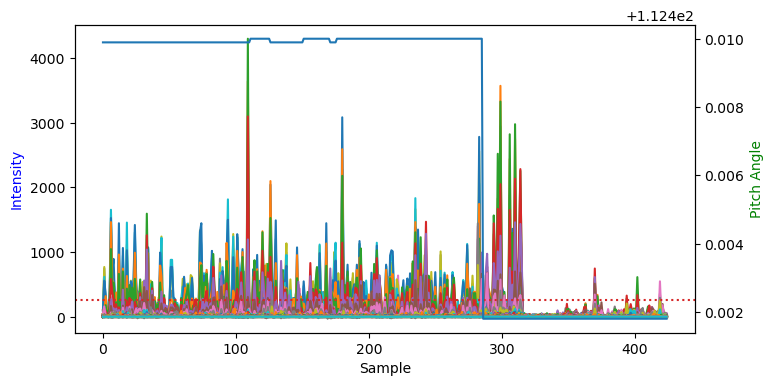

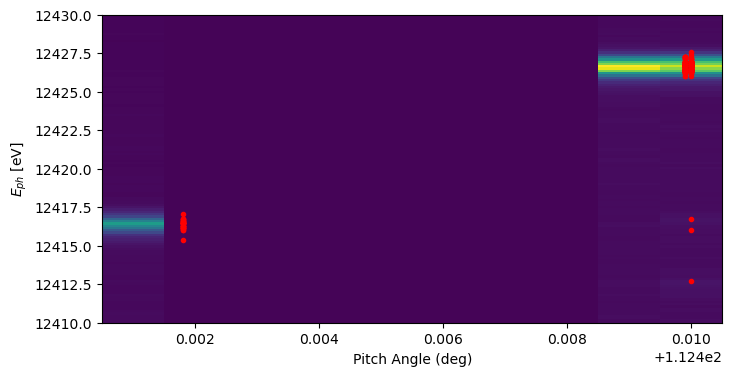

In [15]:
fidx = 10
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/17

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0
pcentral = np.argmin(np.abs(tt['phen_scale']-Ecentral))
        
x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
np_phen = x

for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.ylim(12410,12430)
plt.show()


686.6728409945085 603.3699580313388
0.12048192771084337 0.105


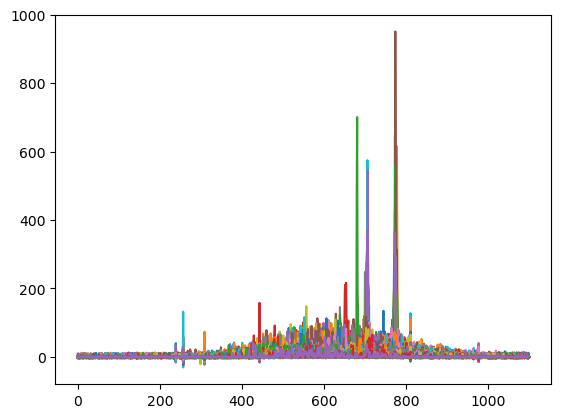

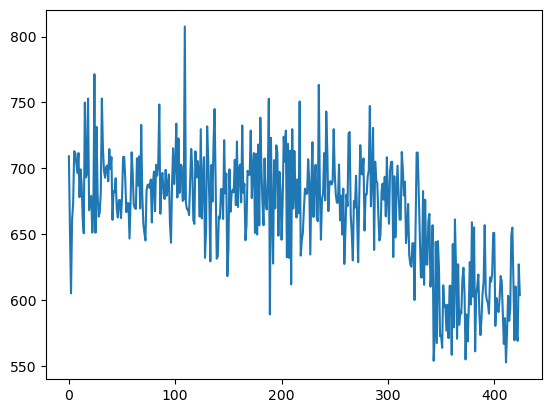

In [16]:
#plt.plot(np_phen,tt['spec_hist'].T[:,[100,200,300,420]])
com = []
thresh_SASE = 0.6
for spec in tt['spec_hist']:
    mask = np.ones(spec.shape[0],dtype=bool)
    maxidx = np.argmax(spec)
    mask[maxidx-5:maxidx+5] = False

    #z_scores = np.abs(stats.zscore(spec))
    #mask = z_scores < thresh_SASE
    com.append(np.sum(np.arange(spec.shape[0])[mask]*spec[mask])/np.sum(spec[mask]))
    plt.plot(spec[mask])
    #if spec.max()<=100:
    #    
#
com = np.array(com)
plt.figure()
plt.plot(com)
print(np.mean(com[:200]),np.mean(com[380:]))
print(10/(686-603),0.7*0.15)

In [17]:
def gauss(x,x0,amp,stddev):
    return amp*np.exp(-(x-x0)**2/2/stddev**2)
def double_gauss(x,x01,amp1,stddev1,x02,amp2,stddev2):
    return gauss(x,x01,amp1,stddev1)+gauss(x,x02,amp2,stddev2)

NameError: name 'double_gauss' is not defined

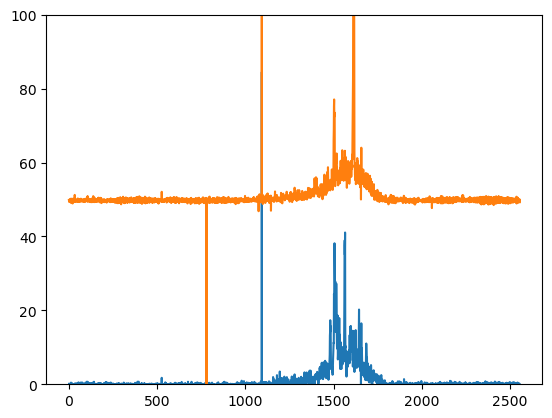

In [219]:
bad_pixel = [257,819,820,821]
mask = np.ones(tt['spec_hist'].shape[1],dtype=bool)
mask[bad_pixel] = False
spec_mean_1 = np.mean(tt['spec_hist'][0:20,:],axis=0)
spec_mean_2 = np.mean(tt['spec_hist'][-20:,:],axis=0)
plt.plot(spec_mean_1[mask])
plt.plot(spec_mean_2[mask]+50)
plt.ylim(0,100)

xdata = np.arange(spec_mean_1.shape[0])[mask]
p0 = [np.argmax(spec_mean_1),np.max(spec_mean_1),5,spec_mean_1.shape[0]/2,np.max(spec_mean_1)/10,200]
popt_m1,_ = opt.curve_fit(double_gauss,xdata,spec_mean_1[mask],p0=p0,bounds=([0,50,1,0,5,100],[np.inf,np.inf,10,np.inf,np.inf,np.inf]))
p0 = [np.argmax(spec_mean_2),np.max(spec_mean_2),5,spec_mean_2.shape[0]/2,np.max(spec_mean_2)/10,200]
popt_m2,_ = opt.curve_fit(double_gauss,xdata,spec_mean_2[mask],p0=p0,bounds=([0,50,1,0,5,100],[np.inf,np.inf,10,np.inf,np.inf,np.inf]))

plt.plot(double_gauss(xdata,*popt_m1))
plt.plot(double_gauss(xdata,*popt_m2)+50)
print(popt_m1[3],popt_m2[3])
print(10/(680-595))

In [220]:
print(10/(680-595))

0.11764705882352941


(0.0, 100.0)

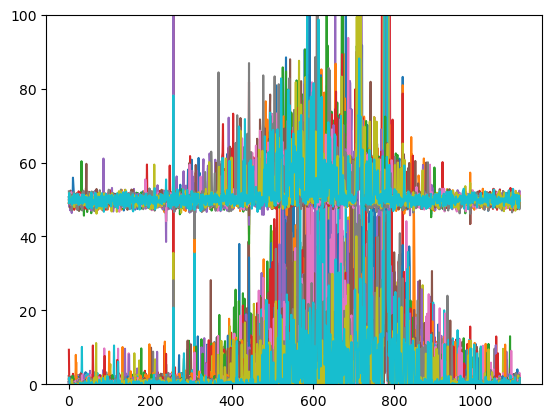

In [71]:
plt.plot(tt['spec_hist'][:40,:].T)
plt.plot(tt['spec_hist'][-10:,:].T+50)
plt.ylim(0,100)


In [ ]:
plt.plot(tt['spec_hist'][:]

[793, 33.034141540527344, 5, 555.0, 3.303414154052734, 200]
[419, 35.76066207885742, 5, 555.0, 3.5760662078857424, 200]
[634, 38.70579147338867, 5, 555.0, 3.870579147338867, 200]
[257, 35.57038116455078, 5, 555.0, 3.557038116455078, 200]
[541, 40.02188491821289, 5, 555.0, 4.002188491821289, 200]
[624, 29.251867294311523, 5, 555.0, 2.9251867294311524, 200]
[670, 33.30377960205078, 5, 555.0, 3.330377960205078, 200]
[670, 33.30377960205078, 5, 555.0, 3.330377960205078, 200]
[558, 41.55083084106445, 5, 555.0, 4.155083084106446, 200]
[679, 34.62334060668945, 5, 555.0, 3.4623340606689452, 200]
[627, 31.08251190185547, 5, 555.0, 3.108251190185547, 200]
[627, 31.08251190185547, 5, 555.0, 3.108251190185547, 200]
[652, 43.725120544433594, 5, 555.0, 4.3725120544433596, 200]
[556, 33.212623596191406, 5, 555.0, 3.3212623596191406, 200]
[556, 33.212623596191406, 5, 555.0, 3.3212623596191406, 200]
[735, 37.33226776123047, 5, 555.0, 3.733226776123047, 200]
[630, 34.59513854980469, 5, 555.0, 3.45951385

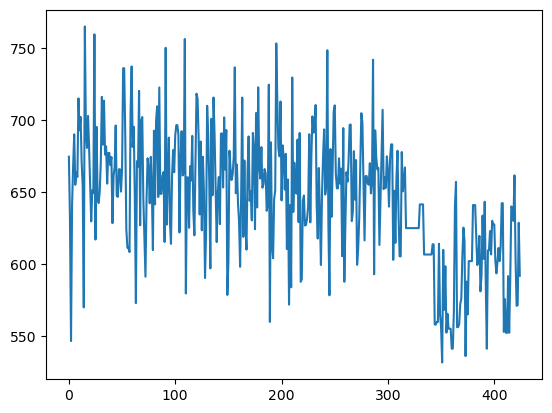

In [64]:
#plt.plot(np_phen,tt['spec_hist'].T[:,[100,200,300,420]])
comGauss = []
#thresh_SASE = 0.6
for spec in tt['spec_hist'][:]:#
    xdata = np.arange(spec.shape[0])
    p0 = [np.argmax(spec),np.max(spec),5,spec.shape[0]/2,np.max(spec)/10,200]
    try:
        popt,_ = opt.curve_fit(double_gauss,xdata,spec,p0=p0,bounds=([0,50,1,0,5,100],[np.inf,np.inf,10,np.inf,np.inf,np.inf]))
    except:
        print(p0)
    #print(popt)
    #mask = np.ones(spec.shape[0],dtype=bool)
    #maxidx = np.argmax(spec)
    #mask[maxidx-2:maxidx+2] = False
    #plt.plot(spec)

    #plt.plot(gauss(xdata,popt[3],popt[4],popt[5]))
    #plt.ylim(0,150)
    comGauss.append(popt[3])
    #z_scores = np.abs(stats.zscore(spec))
    #mask = z_scores < thresh_SASE
#     com.append(np.sum(np.arange(spec.shape[0])[mask]*spec[mask])/np.sum(spec[mask]))
#     plt.plot(spec[mask])
#     #if spec.max()<=100:
#     #    
# #
comGauss = np.array(comGauss)
plt.figure()
plt.plot(comGauss)
print(np.mean(comGauss[:200]),np.mean(comGauss[380:]))
# print(10/(704-612),0.7*0.15)

0.125


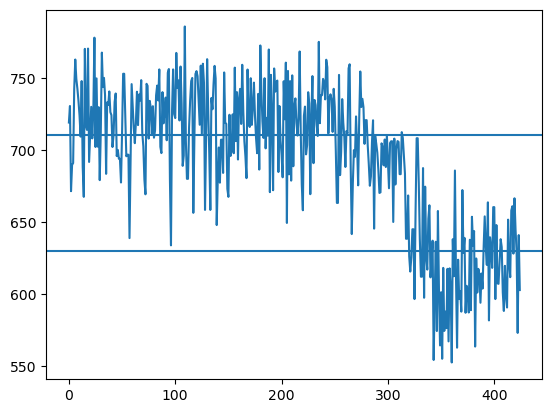

In [28]:
#
com = np.array([np.sum(np.arange(spec.shape[0])*spec)/np.sum(spec) for spec in tt['spec_hist']])


plt.plot(com)
plt.axhline(710)
plt.axhline(630)
print(10/(710-630))


## do the the same for scan #9

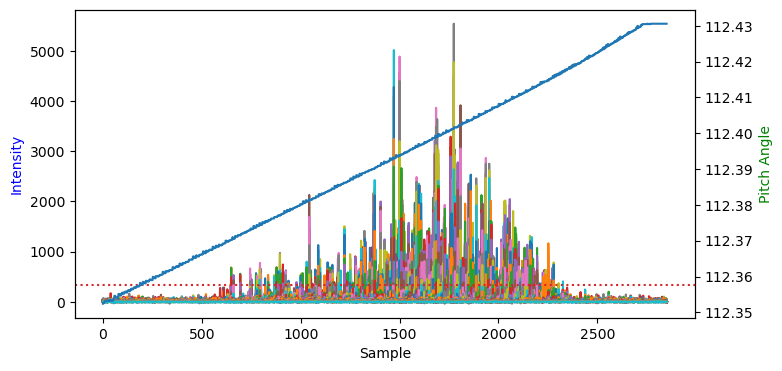

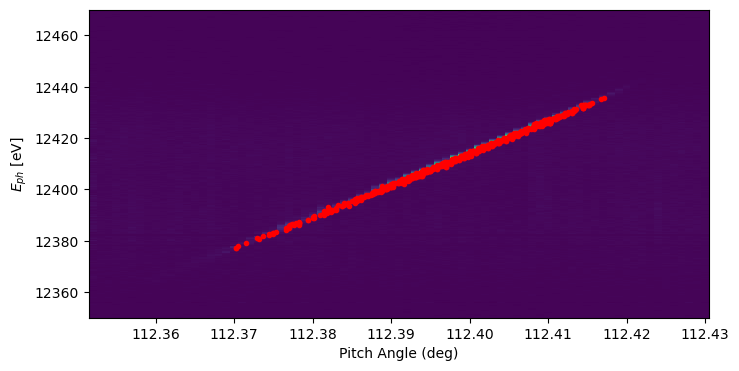

In [19]:
fidx = 9
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/17

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0
pcentral = np.argmin(np.abs(tt['phen_scale']-Ecentral))
        
x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
np_phen = x

for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.ylim(12350,12470)
plt.show()


/tmp/ipykernel_1144537/2281872994.py:18: OptimizeWarning:

Covariance of the parameters could not be estimated



39


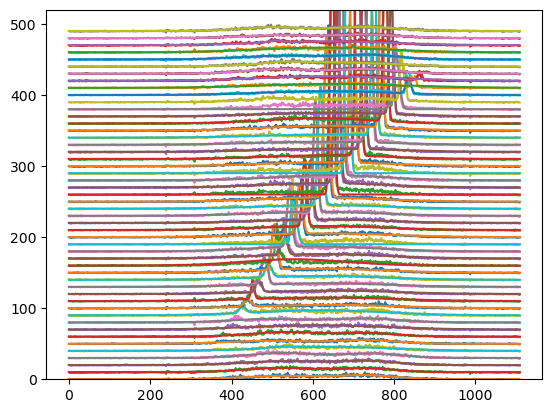

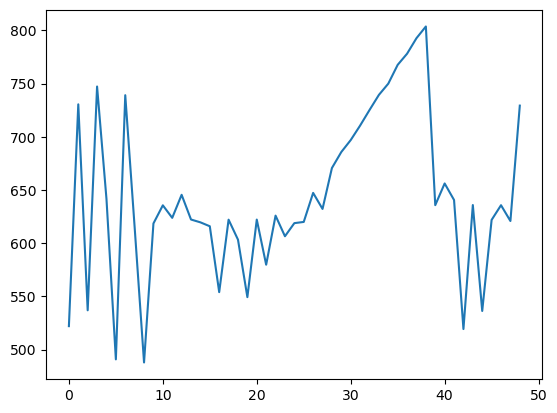

In [70]:
bad_pixel = [257,443,457,461,481,482,483,484,485,486,487,488,489,819,820,821]
mask = np.ones(tt['spec_hist'].shape[1],dtype=bool)
mask[bad_pixel] = False
nSpecs = tt['spec_hist'].shape[0]
nSteps = 50
numM = int(nSpecs/nSteps)
xdata = np.arange(tt['spec_hist'].shape[1])
specMeans = np.zeros((nSteps,tt['spec_hist'].shape[1]))
x0s = np.zeros((nSteps,1))
maskx0 = np.ones((nSteps,1),dtype=bool)
nMin = 0
nMax = 2000
for i in range(nMin,min([nSteps,nMax])):
    specMeans[i,:] = np.mean(tt['spec_hist'][i*numM:(i+1)*numM,:],axis=+0)
    plt.plot(xdata[mask],specMeans[i,mask]+i*10)
    p0 = [np.argmax(specMeans[i,mask]),np.max(specMeans[i,mask]),5,specMeans[i,:].shape[0]/2,np.max(specMeans[i,:])/10,200]
    try:
        popts,_ = opt.curve_fit(double_gauss,xdata[mask],specMeans[i,mask],p0=p0)#,bounds=([0,50,1,0,5,100],[np.inf,np.inf,20,np.inf,np.inf,np.inf]))
        plt.plot(xdata,double_gauss(xdata,*popts)+i*10)
        x0s[i] = popts[3]
    except:
        print(i)
        maskx0[i] = False
plt.ylim(nMin*10,min([nMax,nSteps])*10+20)
plt.figure()
plt.plot(x0s[maskx0])


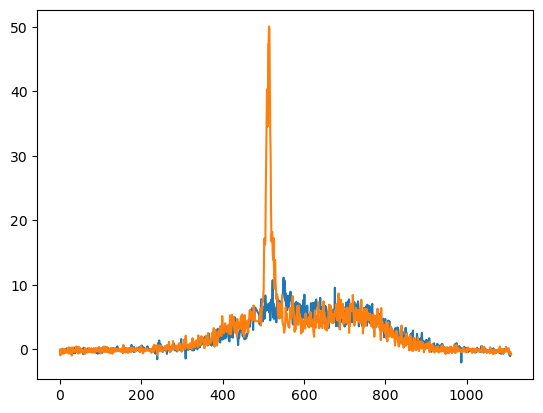

In [84]:
plt.plot(xdata[mask],specMeans[44,mask])
plt.plot(xdata[mask],specMeans[16,mask])


#
#plt.xlim(440,450)
#
# plt.ylim(0,10)

In [21]:
nSpecs

2851

## scan #2 (dominant 11-1 line)


### extract lines and assign Hplanes

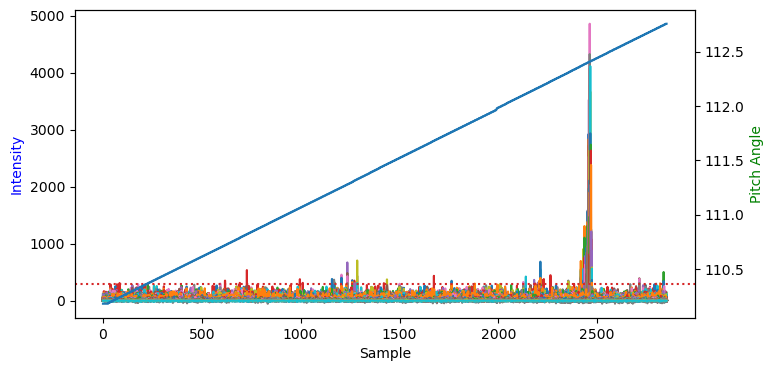

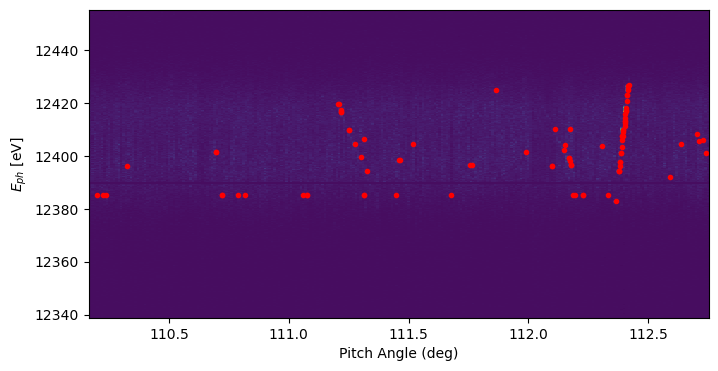

In [93]:
fidx = 2
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/17

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0
pcentral = np.argmin(np.abs(tt['phen_scale']-Ecentral))
        
x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
np_phen = x

for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


In [94]:
#fidx = 12
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(1)]
#bmir.cryst.yaw = np.deg2rad(dY)
#Pitch = np.deg2rad(pitches)
Hquery = Hquery_dict[str(fidx)]
#Hquery_acc += Hquery
print(Hquery)

['[1, -3, -1]', '[1, 1, -1]', '[1, 1, 7]', '[2, 4, 2]', '[3, 3, 5]', '[4, 2, 2]']


In [95]:
%matplotlib widget

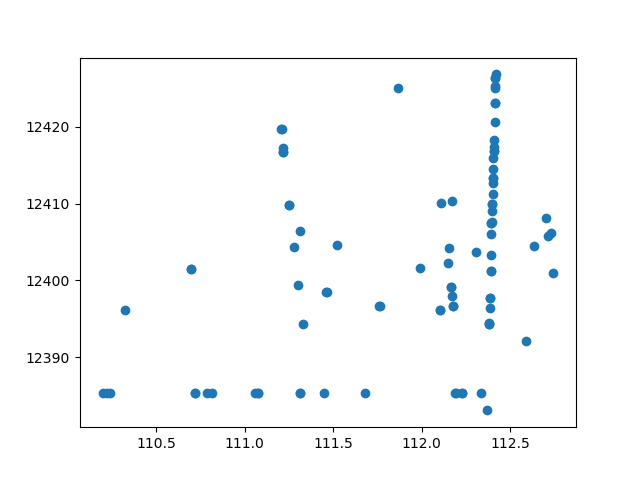

Selected points for Group 1: [53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76
 77 78 79 80 81 82 83 84 85 86]
Switched to Group 2
Selected points for Group 2: []
Selected points for Group 2: []
Selected points for Group 2: []
Selected points for Group 2: []
Selected points for Group 2: []
Selected points for Group 2: []
Switched to Group 3
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []


In [96]:
fig, ax = plt.subplots()
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [97]:
for key, points in selected_points_by_group.items():
    print(f"{key}: {points}")

Group 1: [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
Group 2: [25, 21, 20, 18, 19, 15, 16, 17, 13, 14]
Group 3: [37, 38, 40, 41, 43, 44, 45]
Group 4: []
Group 5: []
Group 6: []
Group 7: []


In [98]:
%matplotlib inline

<Figure size 640x480 with 0 Axes>

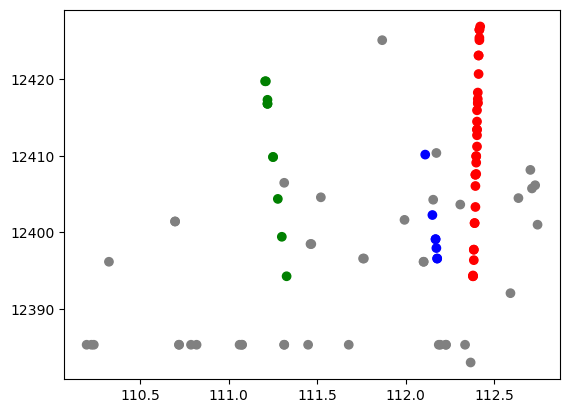

<Figure size 640x480 with 0 Axes>

In [99]:
plt.figure()

0 : [13, 14, 15, 16, 17, 18, 19, 20, 21, 25]
1 : [44, 45, 43, 40, 41, 38, 37]
2 : [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]
3 : []
4 : []
5 : []
6 : []


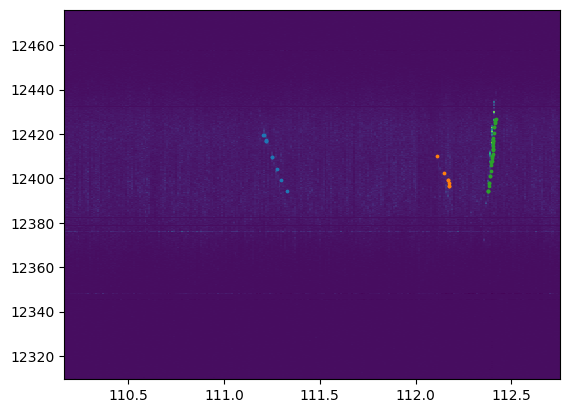

In [100]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

selected_points_by_group['Group 1'] = [13, 14, 15, 16, 17, 18, 19, 20, 21, 25]
selected_points_by_group['Group 2'] = [44, 45, 43, 40, 41, 38, 37]
selected_points_by_group['Group 3'] = [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]


pitches_H = []
E_H = []
plt.figure()
plt.pcolormesh(np_doocs,tt['phen_scale'] ,tt['corr2d'].T,shading='auto')

for lidx, points in enumerate(selected_points_by_group.values()):
    
    pitches_H.append(pitches[points].squeeze())
    E_H.append(Eph_seed[points].squeeze())
    print(lidx,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx],s=3)
plt.show()

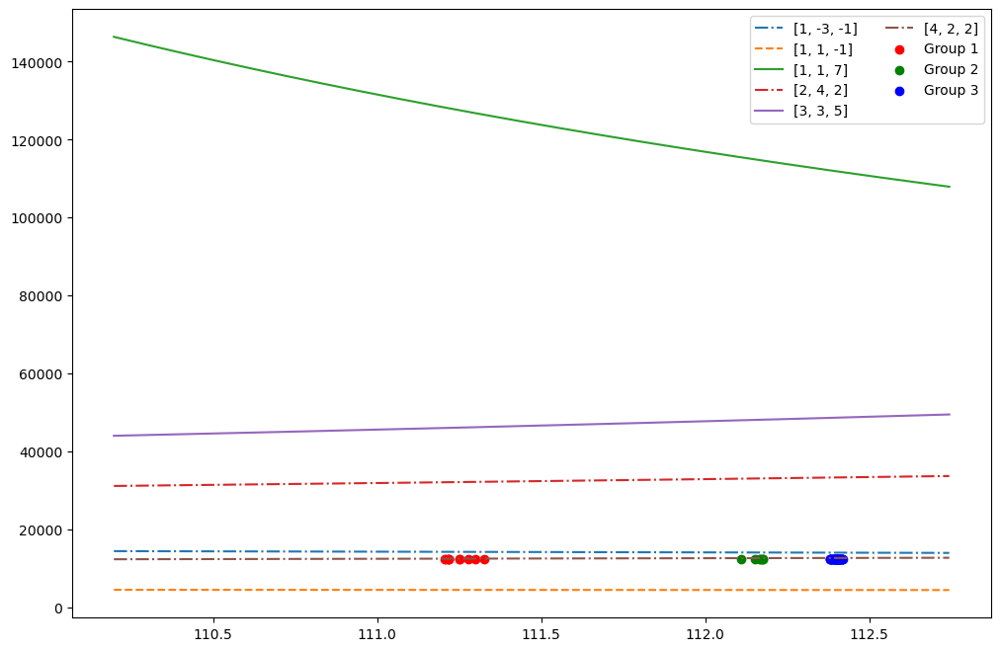

In [24]:
# compare with simulated lines and assign
dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [ 1.14473852e+00,  1.10991002e+00, -1.01729259e+00,  1.07575895e-02, 0]
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPguess,dRguess,dYguess,dRPguess)
    EBragg = np.array(EBragg) + Ecorrguess
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)


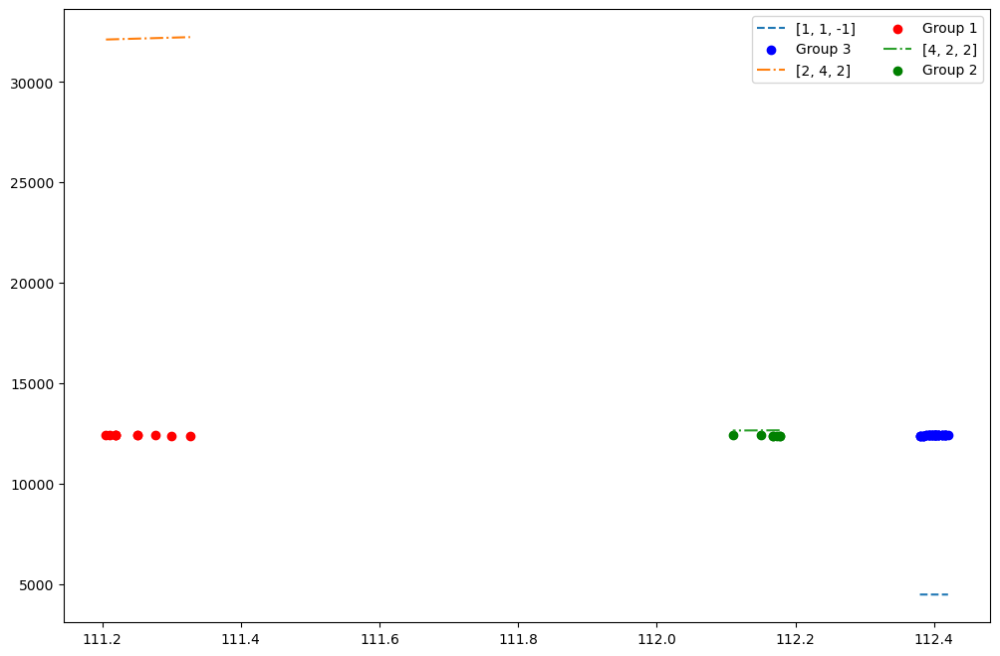

In [25]:
HtoMeas = [None,2,None,0,None,1]
#HtoMeas = [None,2,None,None,None,None]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

### try to fit

In [ ]:

#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = np.array(pitches_H[lidx])
            #if peval.size>0 :
            EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
            EBraggs = np.array(EBraggs) +Ecorr
            cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        #plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitches_H[lidx]
                # if peval.size>0:
                EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBragg = np.array(EBragg) +Ecorr

                #print(peval_sub.min(),peval_sub.max())
                plt.scatter(peval,E_H[lidx],marker='x')
                plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dPguess, dRguess, dYguess, dRPguess, Ecorrguess])
# x0 = np.array([0, -2, 0, 0, Ecorrguess])
bounds = ([-2,2],[-3,3],[-3,3],[-2,2],[-10,10])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

### instead try with dynamic diffraction module

In [69]:
from dynamic_diffraction_module import *

bm = bmirror
from dynamic_diffraction_module import material_data as md
from dynamic_diffraction_module.utils import *

In [70]:
cr = crystal()
#cr.set_crystal_planes("111")
cr.set_crystal_planes("100")
cr.Tbase = 293#300
cr.thickness = 100E-6

cr.pitch = np.deg2rad(90)#np.pi/2
cr.roll = 0
#setting the Bragg angle to a specific degree
#Theta_B = deg2rad(45.)
#cr.roll = np.arccos(np.sin(Theta_B)/#np.sin(cr.pitch))
cr.calc_RLab2Cryst()
#H0 = np.array([3, 3, 3])
H0 = np.array([4, 0, 0])
bmir = bm(H0, cryst=cr)

initializing Bragg mirror from predefined crystal


In [85]:
#set offsets
bmir.cryst.delta_pitch = np.deg2rad(-dPguess)
bmir.cryst.delta_roll = np.deg2rad(-dRguess)
bmir.cryst.delta_yaw = np.deg2rad(-dYguess)

# PreSampling = bmir.BraggCurvesEvsAngles_inRange((Eph_seed.min(),Eph_seed.max()),PitchRange=[np.deg2rad(pitches.min()),np.deg2rad(pitches.max())],RollRange=np.deg2rad(roll),numPreSampling=100)
Hquery = PreSampling[1]
print(Hquery)

[array([-1,  1, -1]) array([-1, -3, -1]) array([-2, -4,  2])
 array([-2, -2,  4])]


In [93]:
def getBragg(PQuery,RQuery,YQuery,H):
    bmir.cryst.roll = RQuery 
    bmir.cryst.yaw = YQuery 
    EBraggs = np.zeros(PQuery.size)
    for Pidx,P in enumerate(PQuery):
        bmir.cryst.pitch = P
        bmir.cryst.calc_RLab2Cryst()
        EBraggs[Pidx] = bmir.bragg_wavelength(H=H,exact=True)[1]
    return EBraggs
def getBraggwCorr(PQuery,RQuery,deltaP,deltaR,deltaY,alpha,H):
    bmir.cryst.delta_pitch = deltaP
    bmir.cryst.delta_yaw = deltaY
    bmir.cryst.roll = RQuery 

    EBraggs = np.zeros(PQuery.size)
    for Pidx,P in enumerate(PQuery):
        bmir.cryst.pitch = P
        bmir.cryst.delta_roll = deltaR + alpha*P
        bmir.cryst.calc_RLab2Cryst()
        EBraggs[Pidx] = bmir.bragg_wavelength(H=H,exact=True)[1]
    return EBraggs

/tmp/ipykernel_95180/2796164657.py:8: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



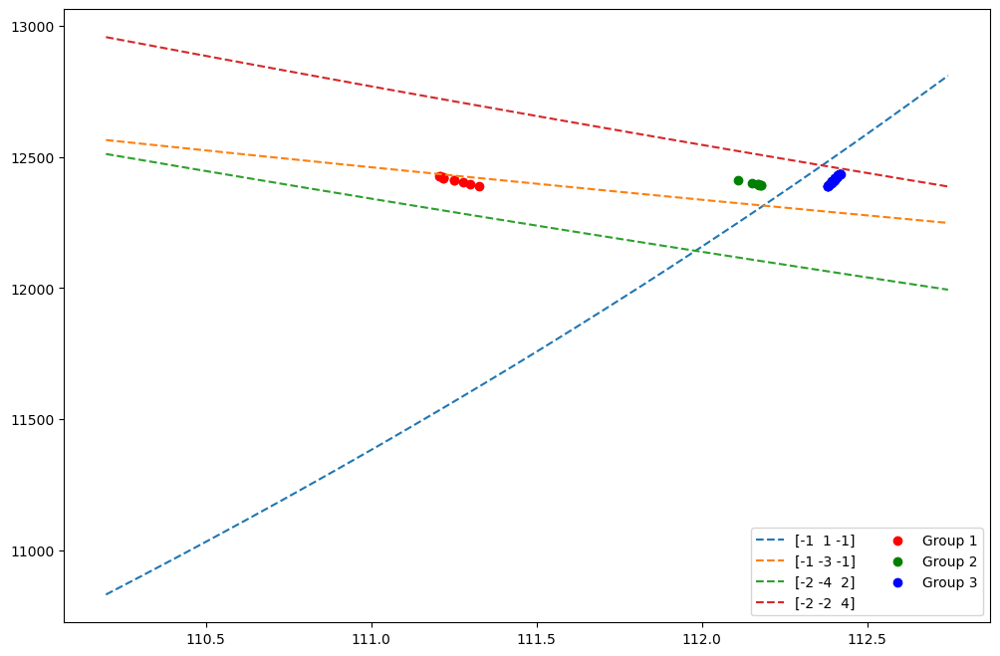

In [81]:
# compare with simulated lines and assign
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    EBragg = getBragg(np.deg2rad(pitch_list),np.deg2rad(roll),0,H)
    EBragg += Ecorrguess
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)


/tmp/ipykernel_95180/2687494270.py:8: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



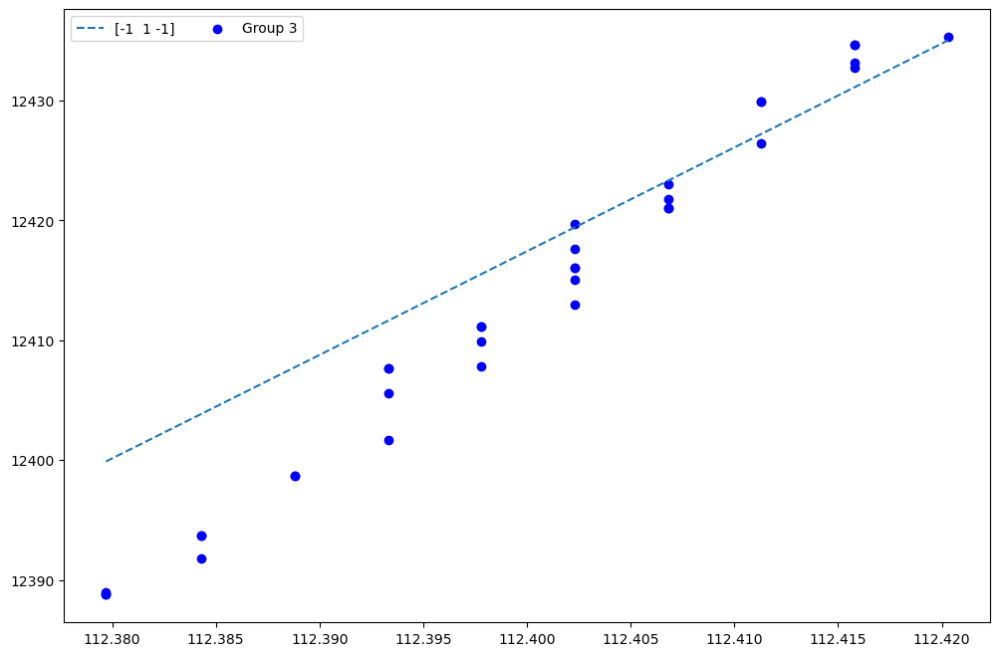

In [97]:
#HtoMeas = [2,None,0,1]
HtoMeas = [2,None,None,None]
#HtoMeas = [None,2,None,0,None,1]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg = getBragg(np.deg2rad(pitchi),np.deg2rad(roll),0,H)
        EBragg += Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

#### reselect points

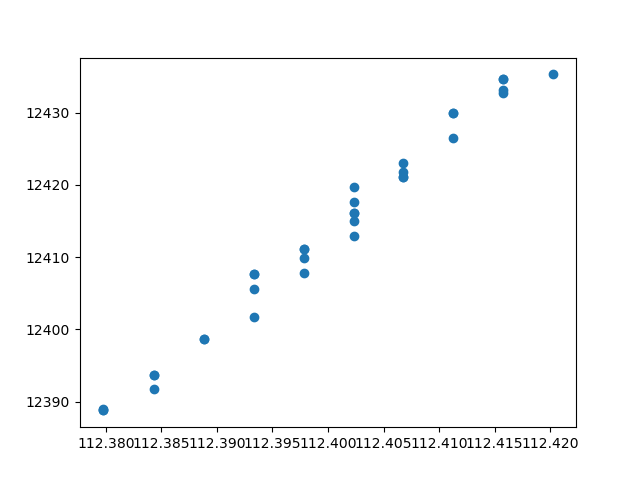

Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []
Selected points for Group 3: []


In [102]:
%matplotlib widget
fig, ax = plt.subplots()

lidx = 2
pitchi = pitches_H[2]
scatter = ax.scatter(pitchi, E_H[lidx],picker=True)

selected_points_by_group[f'Group {lidx+1}'] = []
# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
# group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
# group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = lidx
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [111]:
%matplotlib inline

In [107]:
selected_points_by_group['Group 3']

[0, 1, 2, 4, 5, 6, 7, 9, 13, 18, 19, 22, 23, 24, 26, 29, 30, 33]

In [110]:
pitches_H[2] = pitchi[selected_points_by_group['Group 3']]
E_H[2] = E_H[2][selected_points_by_group['Group 3']]

In [ ]:
def optFuncp(dP,dR,dY,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0
    bmir.cryst.delta_pitch = np.deg2rad(-dP)
    bmir.cryst.delta_roll = np.deg2rad(-dR)
    bmir.cryst.delta_yaw = np.deg2rad(-dY)
    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = pitches_H[lidx]
            EBraggs = getBragg(np.deg2rad(peval),np.deg2rad(roll),0,H)+Ecorr
            cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2

    return 1/cost
def optFuncp_wCorr(dP,dR,dY,alpha,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0
    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = pitches_H[lidx]
            EBraggs = getBraggwCorr(np.deg2rad(peval),np.deg2rad(roll),-np.deg2rad(dP),-np.deg2rad(dR),-np.deg2rad(dY),-alpha,H)+Ecorr
            cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2

    return 1/cost

def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    #return 1/optFuncp(x[0],x[1],x[2],x[3])
    return 1/optFuncp_wCorr(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%100 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        #plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        # dP,dR,dY,Ecorr = intermediate_result.x
        # bmir.cryst.delta_pitch = np.deg2rad(-dP)
        # bmir.cryst.delta_roll = np.deg2rad(-dR)
        # bmir.cryst.delta_yaw = np.deg2rad(-dY)
        #dP,dR,dY = intermediate_result.x
        dP,dR,dY,alpha,Ecorr = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            if lidx is not None:
            #print(lidx)
            #P0 = P0s[lidx]
                peval = pitches_H[lidx]
                EBragg = getBraggwCorr(np.deg2rad(peval),np.deg2rad(roll),-np.deg2rad(dP),-np.deg2rad(dR),-np.deg2rad(dY),-alpha,H)+Ecorr

                #print(peval_sub.min(),peval_sub.max())
                plt.plot(peval,EBragg)
                plt.scatter(peval,E_H[lidx],marker='x')
                #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dPguess, dRguess, dYguess,-dRPguess, Ecorrguess])
x0 = np.array([0, -2, 30, 0, Ecorrguess])
bounds = ([-2,2],[-10,10],[-30,30],[-0.4,0.4],[-10,10])
#x0 = np.array([-1, 0.4, 4.5, 10])
#bounds = ([-3,3],[-5,5],[-10,10],[-50,50])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':10000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)

## scan #9 (only 11-1 over wide range)

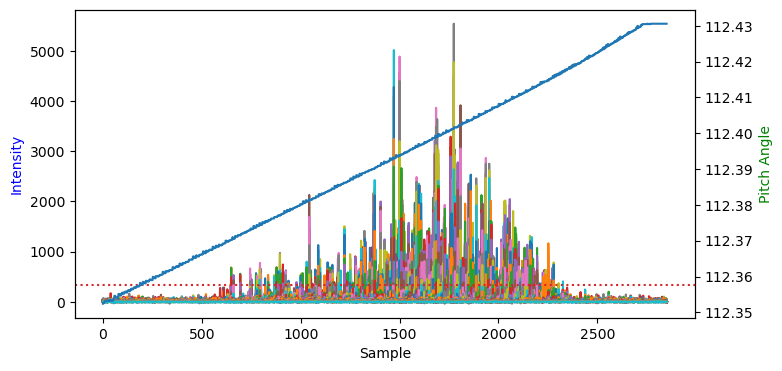

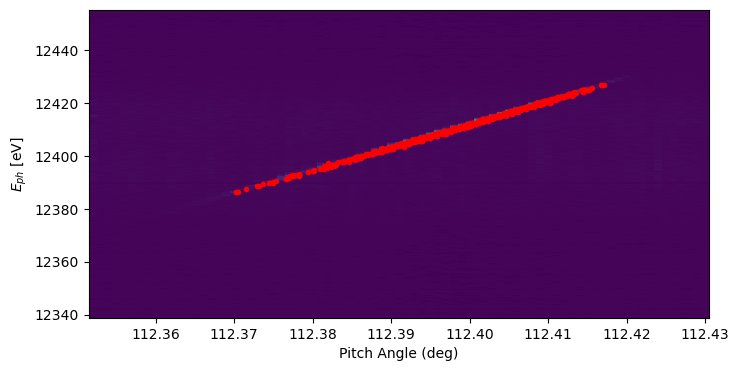

In [108]:
fidx = 9
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/17

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral))

x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


In [109]:
#fidx = 12
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
roll = roll_dict[str(1)]
#bmir.cryst.yaw = np.deg2rad(dY)
#Pitch = np.deg2rad(pitches)
Hquery = Hquery_dict[str(fidx)]
#Hquery_acc += Hquery
print(Hquery)

['[1, 1, -1]', '[1, 1, 7]', '[2, 4, 2]', '[4, 2, 2]']


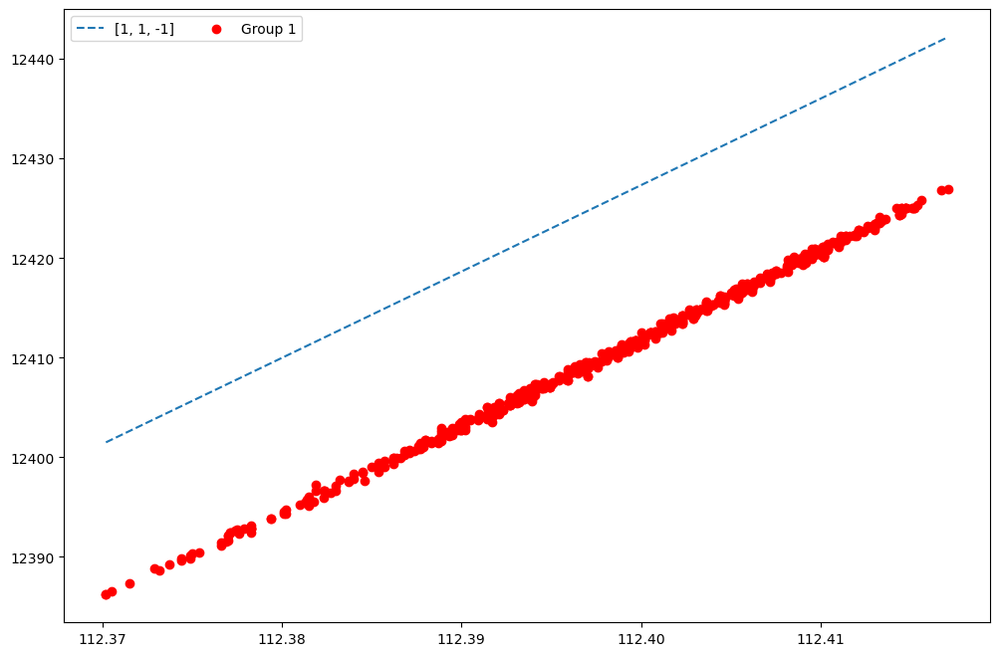

In [110]:
pitches_H = [pitches]#pitch#
Eoffset_pre = 0#20
E_H = [Eph_seed]#np.array
HtoMeas = [0,None,None,None]
#HtoMeas = [None,2,None,0,None,1]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

1
[ 1.19026141e+00  2.99684640e+00  8.95719542e-01  9.81597302e-04
 -5.83095293e+00] 0.0002315965156003716


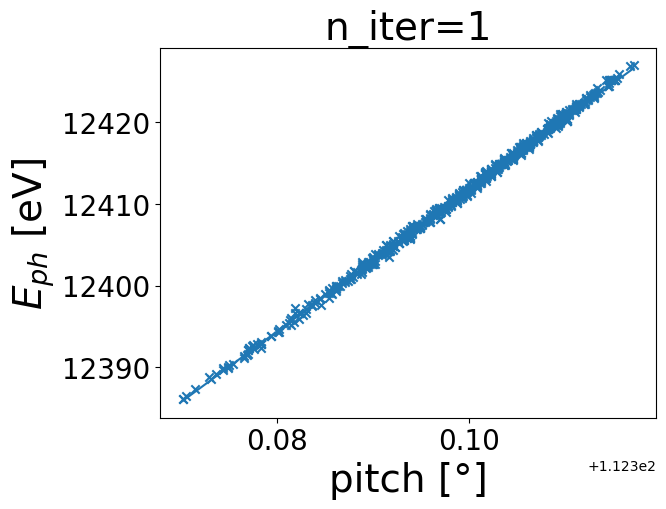

51
[ 1.19039861e+00  3.00680379e+00  9.10870198e-01  9.54729794e-04
 -5.88530716e+00] 0.00018331101149102137


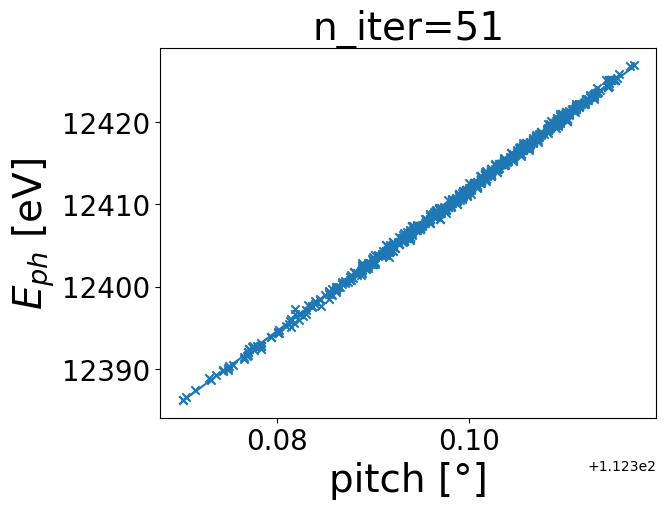

101
[ 1.19013062e+00  3.00868585e+00  9.04834321e-01  9.54907100e-04
 -6.08595337e+00] 0.00018321818938002712


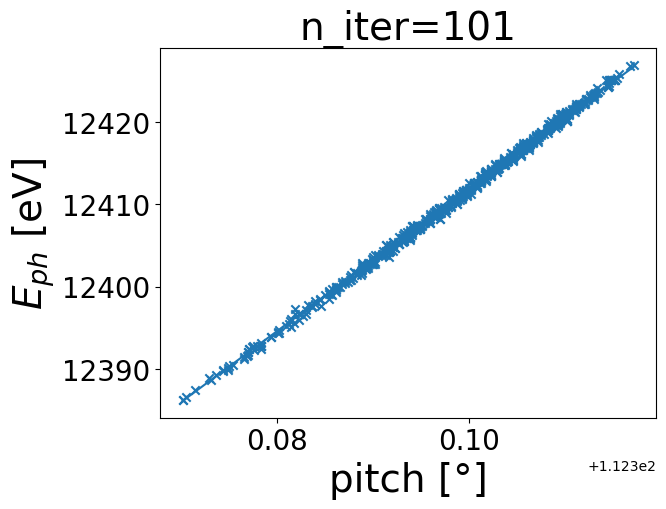

151
[ 1.18516790e+00  3.04760454e+00  7.98521826e-01  9.49301676e-04
 -9.85139011e+00] 0.00018165251375486428


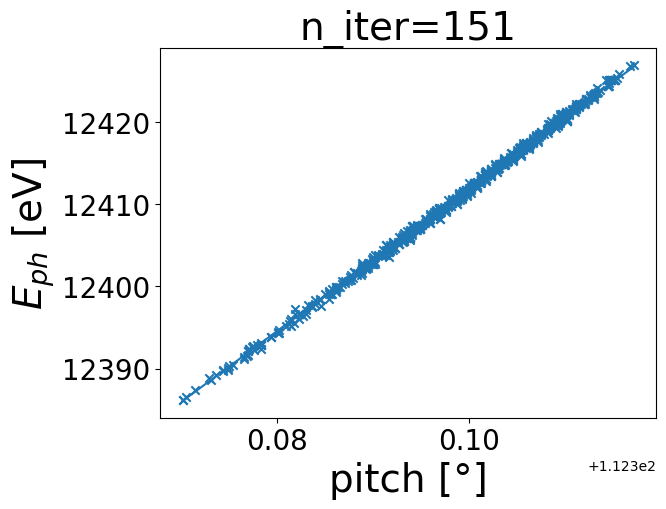

201
[ 1.18495674e+00  3.04927570e+00  7.93940521e-01  9.49308660e-04
 -1.00000000e+01] 0.00018147117437540197


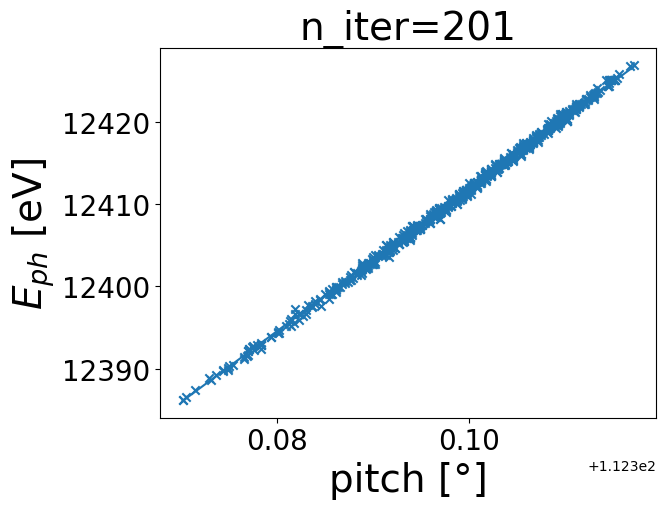

251
[ 1.18442724e+00  3.03305146e+00  7.81933636e-01  9.71658319e-04
 -1.00000000e+01] 0.0001814507194807262


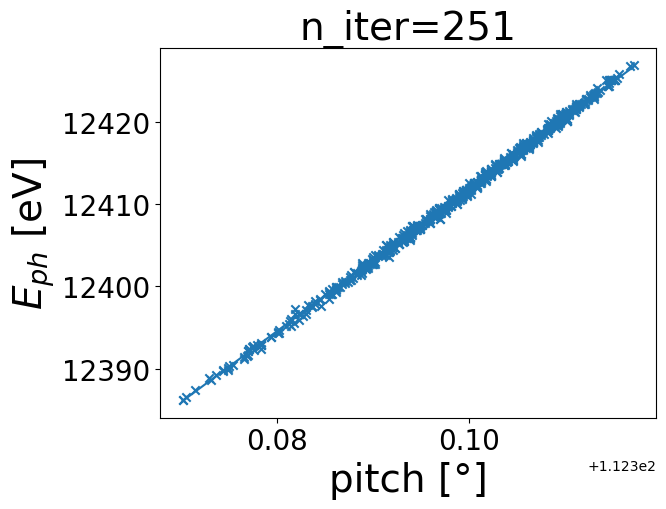

301
[ 1.18263203e+00  2.97963106e+00  7.33435240e-01  1.06008179e-03
 -1.00000000e+01] 0.0001813739341770177


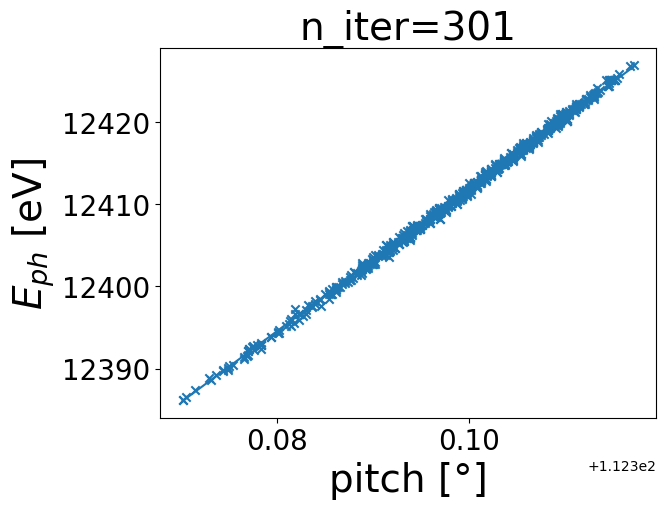

351
[ 1.18015850e+00  2.90992875e+00  6.49709334e-01  1.20879504e-03
 -1.00000000e+01] 0.00018126217744401072


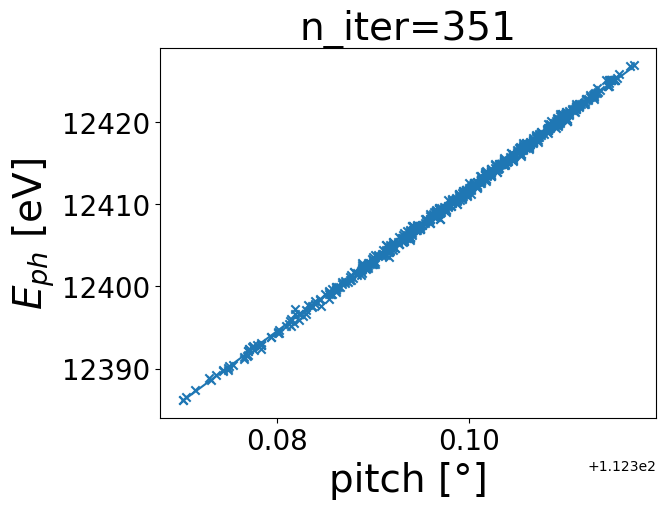

401
[ 1.17667488e+00  2.81657909e+00  5.06078976e-01  1.46031900e-03
 -1.00000000e+01] 0.0001811058220468137


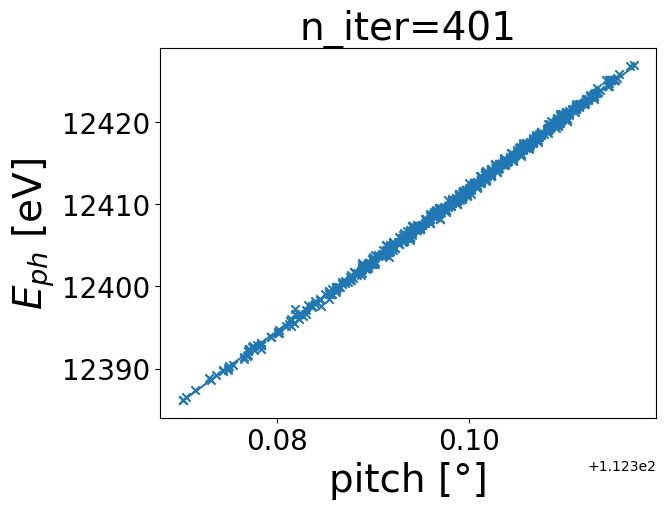

451
[ 1.17372045e+00  2.73933610e+00  3.68571215e-01  1.70046522e-03
 -1.00000000e+01] 0.00018098595656734477


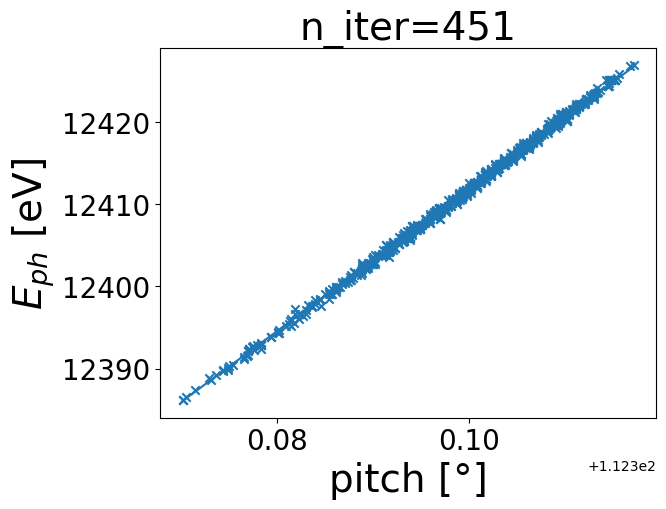

501
[ 1.17031025e+00  2.65172275e+00  1.97019087e-01  1.99962642e-03
 -1.00000000e+01] 0.0001808637758886046


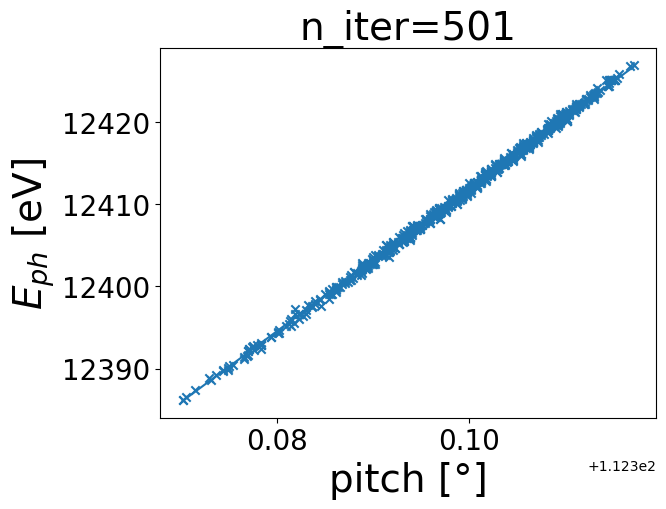

551
[ 1.16613951e+00  2.54630051e+00 -2.72433437e-02  2.39025789e-03
 -1.00000000e+01] 0.00018074715905494623


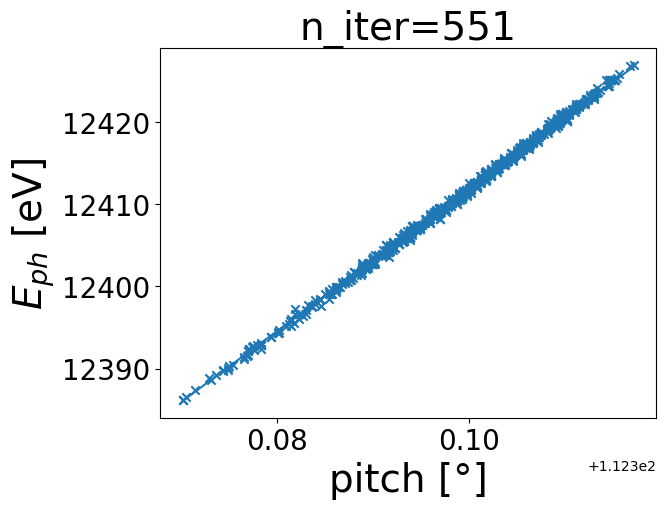

601
[ 1.16248972e+00  2.45550863e+00 -2.32731855e-01  2.74750668e-03
 -1.00000000e+01] 0.00018067555969891643


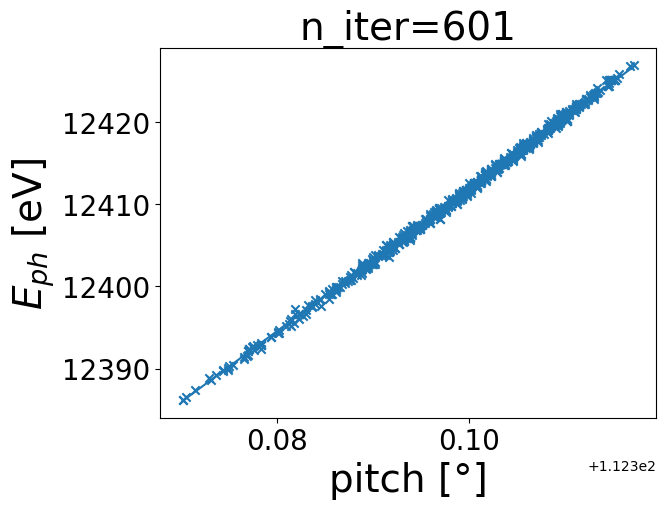

651
[ 1.15872016e+00  2.36258905e+00 -4.50733463e-01  3.12617748e-03
 -1.00000000e+01] 0.00018064418822811312


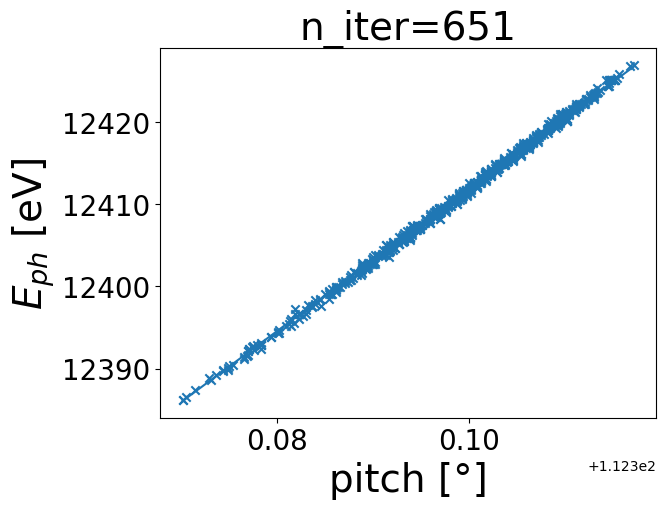

701
[ 1.15756569e+00  2.33426113e+00 -5.18493098e-01  3.24384076e-03
 -1.00000000e+01] 0.000180641537545305


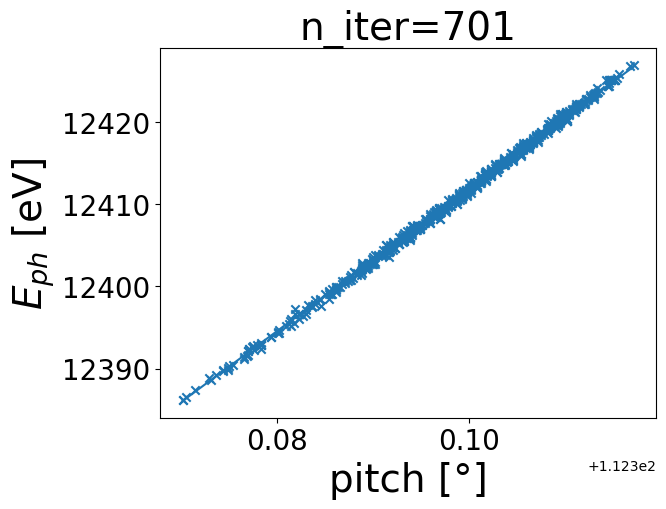

751
[ 1.15756664e+00  2.33428445e+00 -5.18438503e-01  3.24374593e-03
 -1.00000000e+01] 0.0001806415372309212


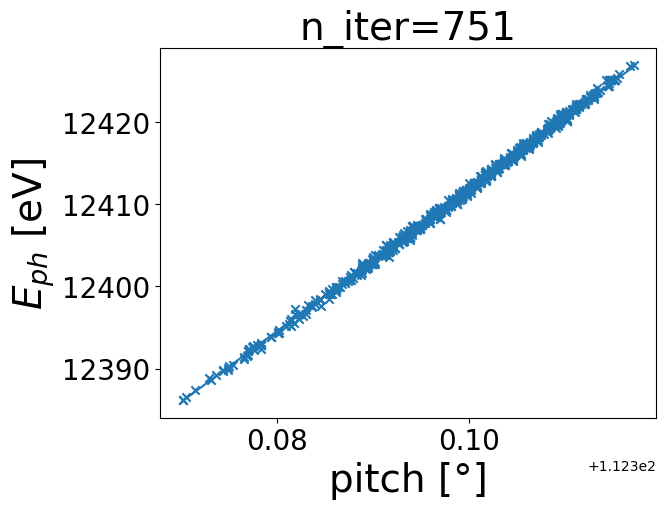

801
[ 1.15756663e+00  2.33428426e+00 -5.18438958e-01  3.24374672e-03
 -1.00000000e+01] 0.00018064153723068834


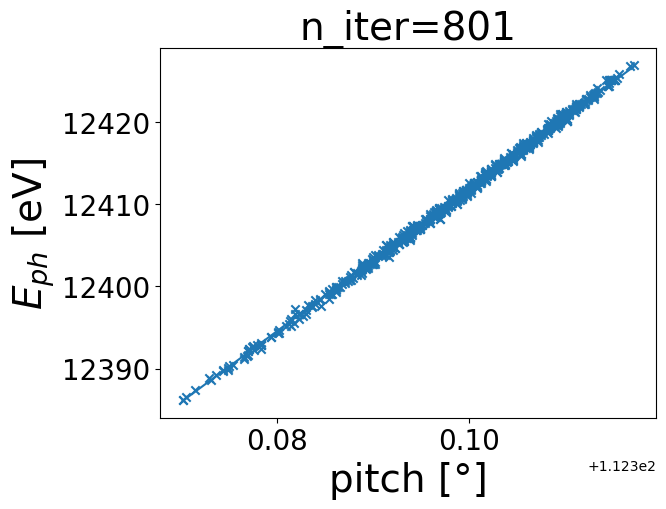

851
[ 1.15756663e+00  2.33428426e+00 -5.18438958e-01  3.24374672e-03
 -1.00000000e+01] 0.00018064153723062855


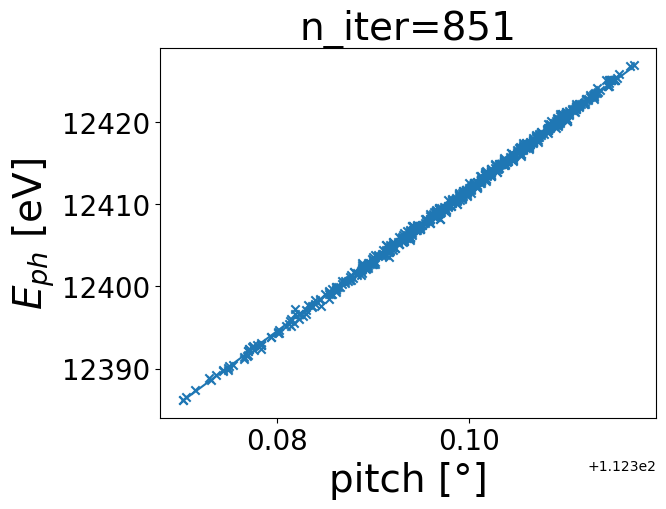

Optimization terminated successfully.
         Current function value: 0.000181
         Iterations: 853
         Function evaluations: 1526
854
[ 1.15756663e+00  2.33428426e+00 -5.18438958e-01  3.24374672e-03
 -1.00000000e+01] 0.00018064153723062855


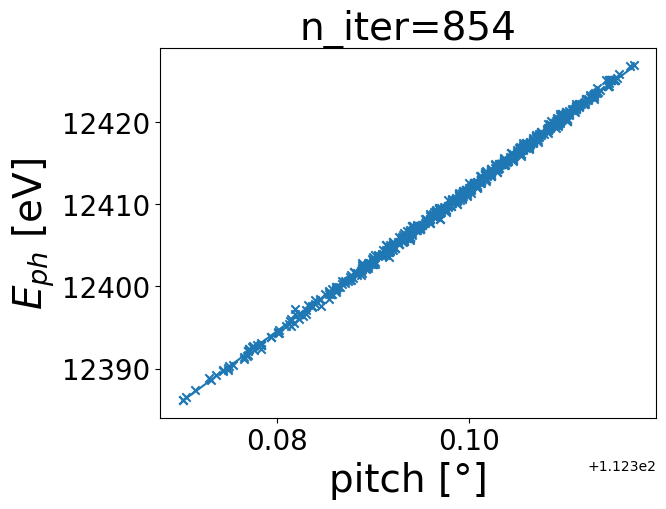

In [112]:

#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = np.array(pitches_H[lidx])
            #if peval.size>0 :
            EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
            EBraggs = np.array(EBraggs) +Ecorr
            cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        #plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitches_H[lidx]
                # if peval.size>0:
                EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBragg = np.array(EBragg) +Ecorr

                #print(peval_sub.min(),peval_sub.max())
                plt.scatter(peval,E_H[lidx],marker='x')
                plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([1.19026141e+00,  2.99684640e+00,  8.95719542e-01,  9.34854573e-04, -5.83095293e+00])
#x0 = np.array([dPguess, dRguess, dYguess, 0., Ecorrguess])
#x0 = np.array([0, -2, 0, 0, Ecorrguess])
bounds = ([-2,2],[-10,10],[-90,90],[-2,2],[-10,10])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':10000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

## scan #14 (lots of crossings) at roll=1.7

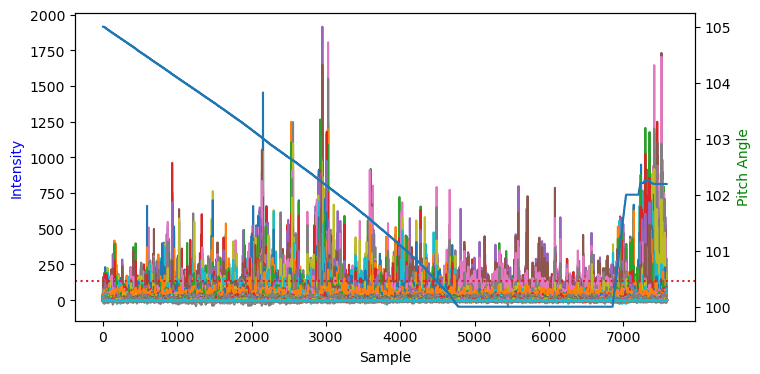

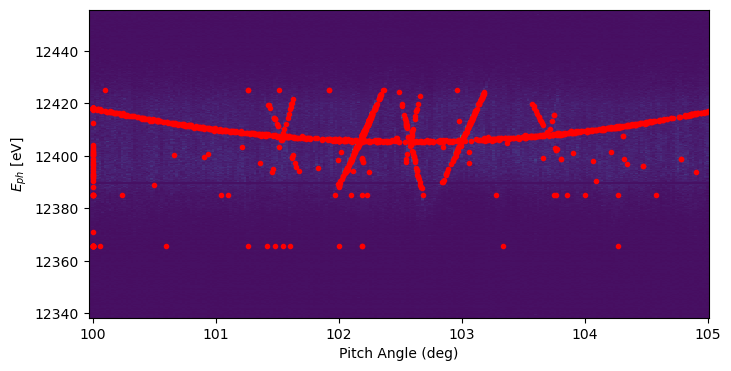

In [112]:
fidx = 14
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/14

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral))

x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


In [113]:
#fidx = 12
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
try:
    roll = roll_dict[str(fidx)]
    Hquery = Hquery_dict[str(fidx)]
except:
    roll = roll_in_database(datafiles[fidx-1])
    _, _, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll,np_phen,np_doocs)
#bmir.cryst.yaw = np.deg2rad(dY)
#Pitch = np.deg2rad(pitches)
#Hquery_acc += Hquery
print(Hquery)

Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 

['[0, 2, -6]', '[0, 4, 4]', '[1, -3, 3]', '[1, 1, 7]', '[1, 3, 1]', '[2, 0, -6]', '[2, 2, -4]', '[3, -1, -3]', '[3, 1, 1]', '[3, 3, 3]', '[4, 0, 4]']


In [9]:
%matplotlib widget

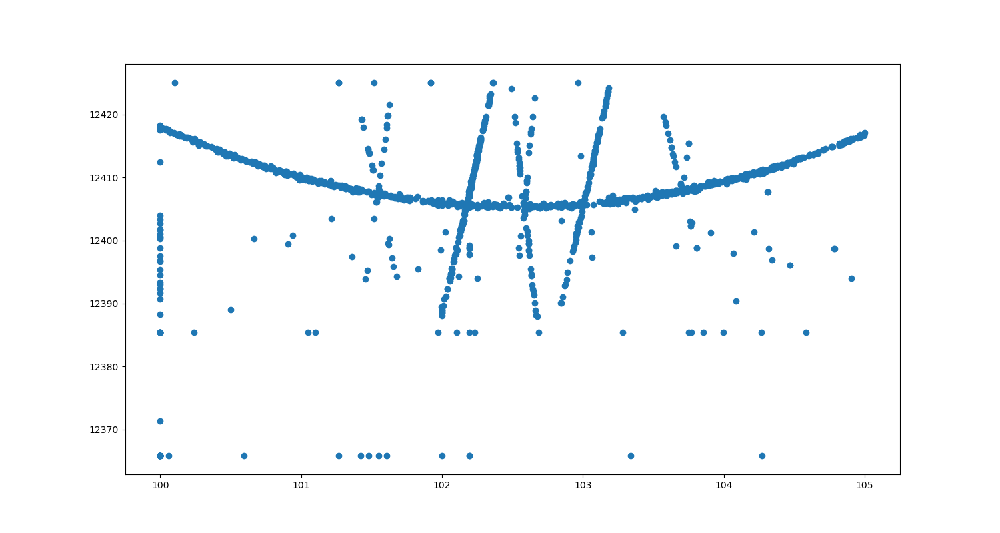

Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected points for Group 1: []
Selected

In [18]:
fig, ax = plt.subplots(figsize=(15,8))
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'black', 'blue', 'magenta','orange','cyan','yellow','violet','purple','gold','beige','aquamarine','wheat']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7','Group 8','Group 9','Group 10','Group 11','Group 12','Group 13','Group 14']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [ ]:
for key, points in selected_points_by_group.items():
    print(f"{key}: {points}")

Group 1: [939, 940, 941, 942, 943, 944, 945, 946, 947, 948, 952, 953, 954, 955, 956, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 974, 975, 976, 977, 978, 979, 980, 981, 982, 984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1049, 1050, 1052, 1053, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1062, 1063, 1064, 1065, 1066, 1067, 1068, 1069, 1070, 1071, 1072, 1074, 1075, 1076, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1124, 1

In [ ]:
%matplotlib inline

In [ ]:
plt.figure()

0 : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 115, 116, 117, 118, 122, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 180, 181, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 235, 236, 237, 238, 239,

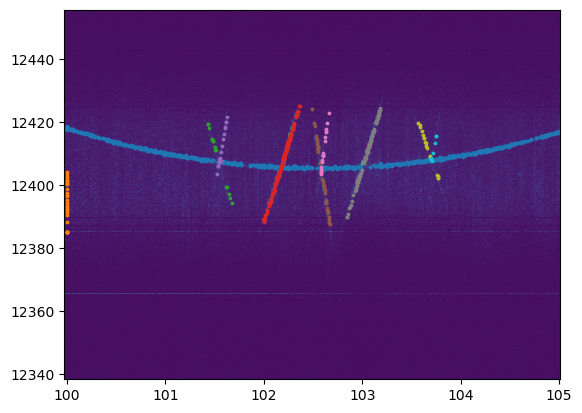

In [114]:
group_colors = ['red', 'green', 'black', 'blue', 'magenta','orange','cyan','yellow','violet','purple','gold','beige','aquamarine','wheat']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7','Group 8','Group 9','Group 10','Group 11','Group 12','Group 13','Group 14']
selected_points_by_group = {label: [] for label in group_labels}
selected_points_by_group["Group 1"] = np.unique([ [939, 940, 941, 942, 943, 944, 945, 946, 947, 948, 952, 953, 954, 955, 956, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 974, 975, 976, 977, 978, 979, 980, 981, 982, 984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1049, 1050, 1052, 1053, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1062, 1063, 1064, 1065, 1066, 1067, 1068, 1069, 1070, 1071, 1072, 1074, 1075, 1076, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1124, 1125, 1126, 1127, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1136, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1146, 1148, 1149, 1150, 1151, 1152, 1153, 1154, 1155, 1157, 1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1170, 1172, 1173, 1174, 1176, 1177, 1178, 1180, 1182, 1183, 1184, 1185, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1204, 1205, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1227, 1228, 1229, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1290, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1301, 1303, 1304, 1305, 1307, 1308, 1309, 1310, 1311, 1312, 1313, 1315, 1316, 1318, 1319, 1320, 1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1340, 1341, 1342, 1343, 1347, 1349, 1351, 1352, 1354, 1355, 1356, 1357, 1358, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1374, 1375, 1376, 1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1389, 1390, 1391, 1393, 1395, 1397, 1398, 1399, 1400, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424, 1425, 1426, 1427, 1429, 1430, 1431, 1432, 1433, 1434, 1435, 1436, 1437, 1438, 1439, 1440, 1441, 1442, 1443, 1444, 1445, 1446, 1447, 1448, 1449, 1450, 1451, 1452, 1453, 1454, 1455, 1456, 1457, 1458, 1459, 1460, 1461, 1462, 1463, 1464, 1465, 1466, 1467, 1468, 1470, 1471, 1472, 1473, 1474, 1475, 1476, 1477, 1478, 1059, 1060, 1062, 1460, 1461, 925, 927, 928, 929, 930, 931, 932, 934, 935, 936, 937, 1479, 1480, 1481, 915, 916, 921, 923, 924, 925, 926, 927, 928, 929, 1481, 1482, 911, 915, 916, 921, 923, 1482, 1483, 855, 856, 858, 860, 861, 862, 865, 866, 874, 875, 877, 878, 879, 1488, 851, 852, 854, 855, 856, 858, 860, 861, 862, 865, 866, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 1489, 839, 840, 841, 842, 843, 844, 845, 846, 834, 835, 1490, 819, 822, 823, 824, 825, 826, 827, 828, 831, 832, 833, 796, 797, 801, 802, 805, 806, 811, 812, 814, 816, 817, 1491, 1492, 1494, 1495, 1496, 1498, 1500, 1501, 1502, 1503, 1505, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1515, 1516, 1517, 1518, 1520, 1522, 784, 788, 792, 796, 797, 801, 802, 805, 806, 1522, 792, 796, 797, 801, 802, 805, 806, 811, 812, 814, 816, 1491, 1492, 1494, 1495, 1496, 1498, 1500, 1501, 1502, 1503, 1505, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1515, 1516, 1517, 1518, 1520, 1522, 802, 805, 806, 811, 812, 814, 816, 817, 818, 820, 1491, 1492, 1494, 1495, 1496, 1498, 1500, 1501, 1502, 1503, 1505, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1515, 1516, 1517, 1518, 1520, 772, 776, 777, 779, 784, 788, 792, 1522, 1527, 649, 651, 653, 654, 656, 657, 658, 661, 663, 665, 666, 673, 693, 1573, 1584, 1598, 1607, 673, 693, 701, 707, 708, 723, 1573, 1584, 1598, 1607, 693, 701, 707, 708, 723, 1547, 1551, 1555, 1573, 1584, 1598, 1607, 1611, 639, 649, 651, 652, 653, 654, 656, 657, 658, 661, 663, 665, 673, 627, 628, 629, 630, 631, 632, 633, 634, 637, 639, 633, 634, 637, 639, 649, 650, 651, 652, 653, 654, 656, 657, 620, 623, 624, 625, 626, 627, 628, 629, 613, 618, 619, 620, 531, 532, 533, 534, 536, 538, 539, 543, 548, 532, 533, 534, 536, 538, 539, 543, 548, 559, 560, 562, 563, 538, 539, 543, 548, 559, 560, 562, 563, 568, 572, 573, 575, 578, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 505, 507, 511, 512, 513, 514, 515, 516, 517, 518, 519, 493, 494, 495, 496, 501, 502, 504, 505, 507, 508, 511, 484, 485, 489, 490, 491, 493, 494, 495, 496, 462, 465, 466, 467, 468, 470, 473, 484, 485, 489, 490, 491, 493, 398, 420, 377, 381, 385, 389, 390, 396, 398, 363, 364, 365, 366, 367, 369, 370, 371, 372, 377, 381, 351, 354, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 348, 349, 350, 351, 352, 353, 354, 356, 357, 358, 359, 360, 361, 362, 334, 335, 336, 337, 338, 339, 340, 341, 342, 335, 336, 337, 338, 339, 340, 341, 342, 344, 345, 346, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 317, 318, 319, 320, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 297, 298, 299, 300, 302, 304, 305, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 273, 274, 275, 276, 279, 280, 282, 283, 286, 287, 288, 291, 293, 294, 295, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 252, 256, 257, 258, 259, 260, 214, 217, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 229, 230, 231, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 236, 196, 197, 198, 199, 200, 201, 202, 203, 205, 196, 197, 198, 199, 200, 201, 202, 203, 205, 206, 207, 208, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 211, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 211, 212, 213, 189, 190, 191, 192, 193, 194, 196, 197, 198, 176, 177, 178, 180, 181, 182, 183, 185, 186, 187, 188, 189, 155, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 173, 174, 149, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 173, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 115, 116, 117, 118, 122, 123, 124, 125, 126, 127, 129, 133, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 38, 39, 40, 41, 42, 43, 47, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 115, 116, 117, 50, 51, 52, 37, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 4, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17]]).tolist()
selected_points_by_group["Group 2"] = np.unique([1147, 1158, 1168, 1169, 1175, 1179, 1181, 1203, 1206, 1226, 1230, 1289, 1291, 1317, 1329, 1353, 1359, 1360, 1371, 1377, 1394, 1396, 1145, 1306, 1346, 1372, 1388, 1428]).tolist()
selected_points_by_group["Group 3"] = np.unique([918, 919, 920, 908, 909, 910, 912, 913, 903, 905, 906, 857, 859, 853, 867, 868]).tolist()
selected_points_by_group["Group 4"] = np.unique([635, 636, 638, 640, 641, 642, 643, 655, 659, 660, 664, 667, 668, 669, 670, 671, 672, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 694, 695, 696, 697, 698, 699, 700, 702, 703, 704, 705, 706, 709, 710, 711, 712, 713, 714, 716, 717, 718, 719, 720, 721, 722, 724, 725, 726, 727, 729, 730, 731, 733, 736, 739, 740, 741, 742, 743, 744, 745, 746, 749, 750, 751, 752, 753, 754, 756, 757, 758, 759, 760, 761, 762, 764, 765, 766, 767, 768, 769, 770, 771, 773, 775, 780, 781, 782, 783, 785, 786, 787, 789, 790, 791, 793, 794, 795, 798, 799, 800, 803, 804, 807, 809, 810, 813, 1497, 1499, 1504, 1514, 1519, 1521, 1523, 1524, 1525, 1526, 1528, 1529, 1530, 1531, 1534, 1535, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1543, 1544, 1545, 1546, 1548, 1549, 1550, 1552, 1553, 1554, 1556, 1557, 1558, 1559, 1560, 1561, 1562, 1563, 1564, 1565, 1566, 1567, 1568, 1569, 1570, 1571, 1572, 1574, 1575, 1576, 1577, 1578, 1579, 1580, 1581, 1582, 1583, 1585, 1586, 1587, 1588, 1589, 1590, 1591, 1593, 1594, 1595, 1596, 1597, 1599, 1600, 1601, 1602, 1603, 1604, 1605, 1606, 1608, 1609, 1610, 1612, 1614, 1615, 1616, 1617, 1618, 1619, 1620, 1621, 1622, 1623, 1624, 1625, 1626, 1627, 1629, 1635, 1637, 1638, 1651, 1657, 1659, 1669, 1672, 1684, 1695, 1699, 1706, 1707, 1709, 1712, 1722, 642, 643, 644, 645, 646, 647, 648, 728, 730, 731, 732, 733, 736, 737, 739, 1532, 1623, 1624, 1625, 1626, 1627, 1628, 1629, 1630, 1631, 1632, 1633, 1635, 1636, 1637, 1638, 1639, 1640, 1641, 1642, 1644, 1645, 1646, 1647, 1648, 1649, 1650, 1651, 1652, 1653, 1654, 1655, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1666, 1667, 1668, 1669, 1670, 1671, 1672, 1673, 1675, 1676, 1678, 1679, 1680, 1682, 1683, 1684, 1685, 1686, 1687, 1688, 1689, 1691, 1692, 1695, 1696, 1697, 1698, 1699, 1700, 1701, 1702, 1703, 1704, 1705, 1706, 1707, 1709, 1710, 1712, 1713, 1714, 1715, 1716, 1717, 1718, 1719, 1720, 1721, 1722, 1723, 1724]).tolist()
selected_points_by_group["Group 5"] = np.unique([869, 870, 871, 872, 876, 880, 887, 1487, 863, 891, 901, 893, 896, 897, 885, 889, 891, 895, 1485, 863]).tolist()
selected_points_by_group["Group 6"] = np.unique([617, 615, 616, 612, 614, 609, 610, 611, 601, 602, 603, 604, 605, 606, 600, 601, 602, 603, 604, 605, 537, 540, 541, 542, 542, 544, 544, 546, 547, 549, 551, 552, 553, 555, 553, 558, 564, 567, 566, 567, 569, 570, 571, 574, 582, 571, 574, 576, 597, 598]).tolist()
selected_points_by_group["Group 7"] = np.unique([545, 550, 554, 556, 556, 557, 557, 561, 561, 565, 577, 579, 580, 581, 583, 584, 585, 588, 589, 590, 596, 588, 589, 590, 591, 592, 593]).tolist()
selected_points_by_group["Group 8"] = np.unique([373, 374, 375, 376, 378, 379, 380, 382, 383, 384, 386, 387, 388, 391, 392, 393, 394, 395, 397, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 421, 422, 423, 424, 425, 426, 427, 428, 429, 431, 432, 434, 435, 436, 437, 438, 439, 440, 441, 442, 461, 463, 469, 472, 475, 476, 478, 479, 480, 481, 482, 483, 486, 487, 488, 492, 497, 498, 499, 500, 503, 509, 510, 463, 469, 471, 472, 477, 460, 461, 463, 441, 442, 443, 444, 446, 447, 448, 443, 444, 446, 447, 448, 449]).tolist()
selected_points_by_group["Group 9"] = np.unique([301, 303, 306, 296, 289, 290, 292, 281, 284, 285, 277, 281, 270, 271, 272, 247, 249, 250, 251]).tolist()
selected_points_by_group["Group 10"] = np.unique([253, 254, 261, 262, 264, 265, 266, 267, 268, 269]).tolist()

pitches_H = []
E_H = []
plt.figure()
plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')

for lidx, points in enumerate(selected_points_by_group.values()):
    
    pitches_H.append(pitches[points].squeeze())
    E_H.append(Eph_seed[points].squeeze())
    print(lidx,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx],s=3)
plt.show()

(12200.0, 12500.0)

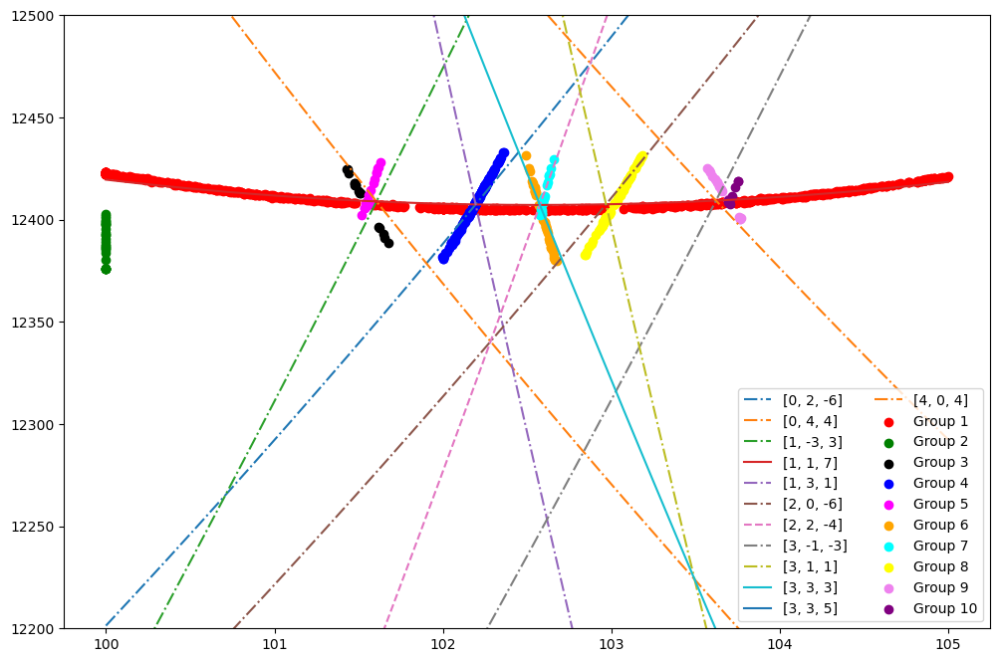

In [239]:
# compare with simulated lines and assign
#dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [ 1.19026141e+00,  2.99684640e+00,  8.95719542e-01,  9.34854573e-04, -5.83095293e+00]
dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [ 1.14473852e+00,  1.10991002e+00, -1.01729259e+00,  1.07575895e-02, -5.83095293e+00]
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPguess,dRguess,dYguess,dRPguess)
    EBragg = np.array(EBragg) + Ecorrguess
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)
plt.ylim(12200,12500)


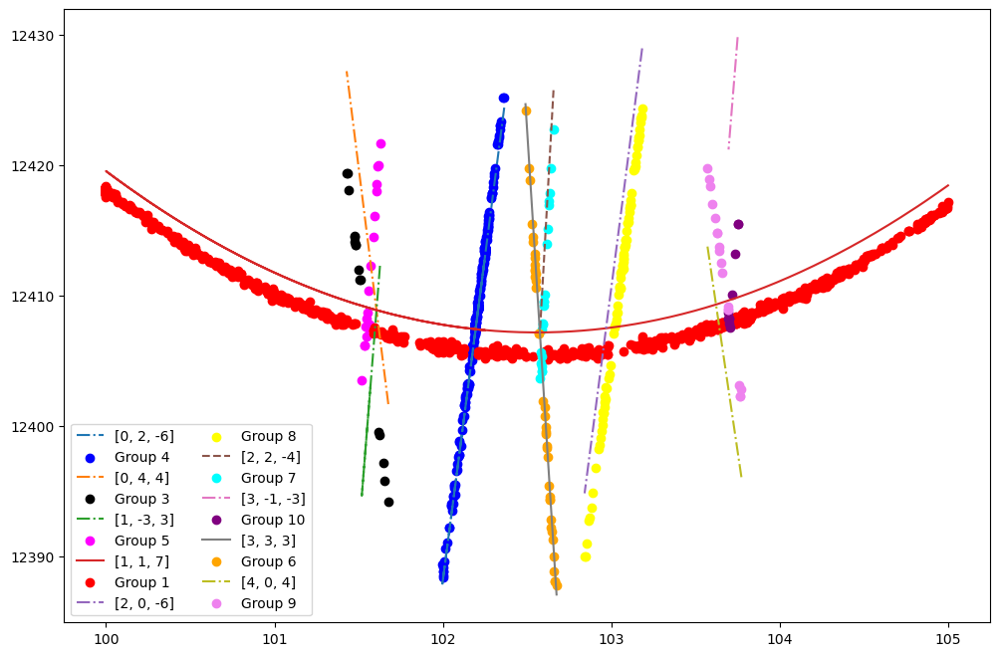

In [116]:
HtoMeas = [3,2,4,0,None,7,6,9,None,5,None,8]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

### try to fit

In [ ]:

#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = np.array(pitches_H[lidx])
            #if peval.size>0 :
            EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
            EBraggs = np.array(EBraggs) +Ecorr
            cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        #plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitches_H[lidx]
                # if peval.size>0:
                EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBragg = np.array(EBragg) +Ecorr

                #print(peval_sub.min(),peval_sub.max())
                plt.scatter(peval,E_H[lidx],marker='x')
                plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dPguess, dRguess, dYguess, dRPguess, Ecorrguess])
# x0 = np.array([0, -2, 0, 0, Ecorrguess])
bounds = ([-2,2],[-3,3],[-3,3],[-2,2],[-10,10])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

## scan #16 (same crossing as #14, but at roll = 0.4°)

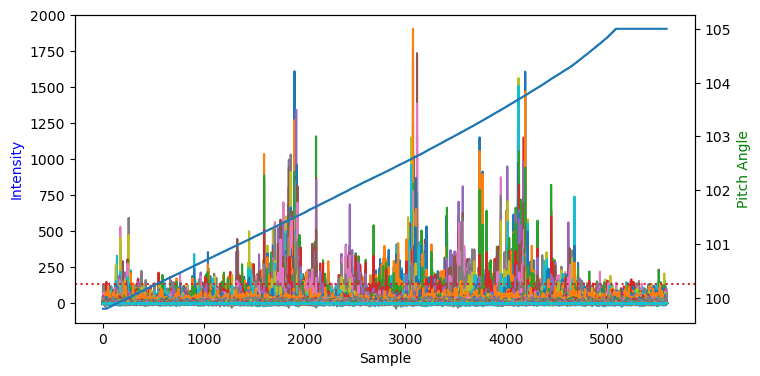

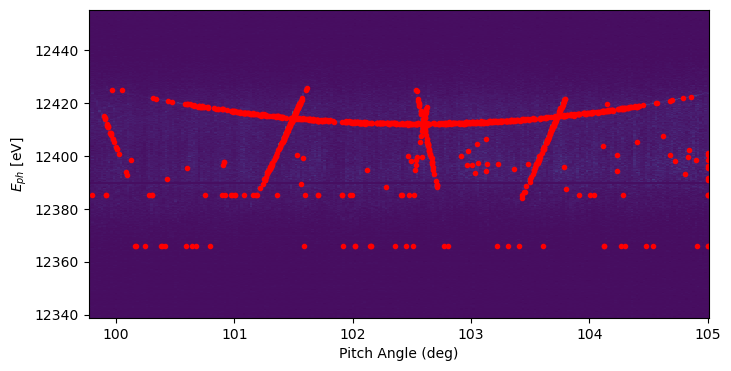

In [8]:
fidx = 16
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/14

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral))

x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


In [9]:
#fidx = 12
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
try:
    roll = roll_dict[str(fidx)]
    Hquery = Hquery_dict[str(fidx)]
except:
    roll = roll_in_database(datafiles[fidx-1])
    _, _, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll,np_phen,np_doocs)
#bmir.cryst.yaw = np.deg2rad(dY)
#Pitch = np.deg2rad(pitches)
#Hquery_acc += Hquery
print(Hquery)

Monochromator 2 image found; 
Machine status file found: roll angle=0.4 deg 

['[0, 2, -6]', '[0, 4, 4]', '[1, -3, 3]', '[1, 1, 7]', '[1, 3, 1]', '[2, 0, -6]', '[2, 2, -4]', '[3, -1, -5]', '[3, -1, -3]', '[3, 1, -3]', '[3, 1, 1]', '[3, 3, 3]', '[4, 0, 4]']


In [36]:
%matplotlib widget

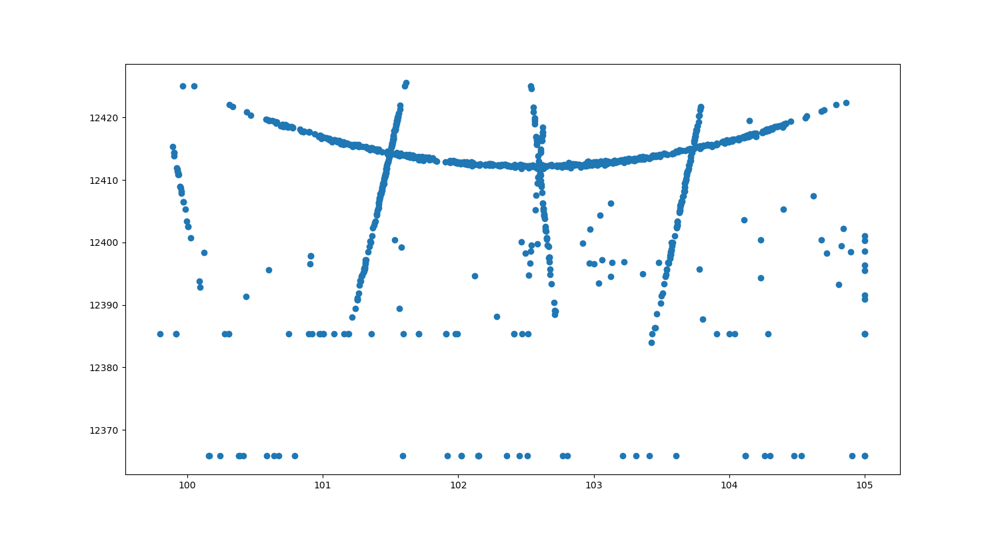

Selected points for Group 1: [ 36  37  42  43  44  46  48  49  50  52  53  54  56  57  58  59  60  61
  62  63  64  65  66  67  68  70  71  72  74  75  76  77  78  79  81  82
  87  88  90  91  92  94  95  96  97  98 101 102 103 104 105 106 107 108
 109 110 111 112 114 115 116 117 118 119 120 121 122 123 124 125 126 127
 128 129 131 132 133 136 137 139 140 141 142 143 144 146 147 148 149 154
 155 157 158 165 178 179 180 184 185 188 191 192 193 195 198 200 201 202
 206 207 209 211]
Selected points for Group 1: []
Selected points for Group 1: [296 301 310 314 317 318 319 323 325 327 328 329 330 331 332 333 334 335
 336 337 338 339 340 341 343 344 345 346 347 348 349 350 351 352 353 354
 355 356 357 358 362 363 364 365 366 367 368 369 370 371 372 373 374 375
 376 377 378 379 383 384 385 386 387 388 389 390 391 392 394 395 396 398
 399 400 401 402 403 404 405 406 409 410 411 412 413 414 415 416 417 418
 419 420 421 422 423 424 425 426 427 428 429 430 431 432 433 434 435 436
 438 439 443 444

In [37]:
fig, ax = plt.subplots(figsize=(15,8))
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'black', 'blue', 'magenta','orange','cyan','yellow','violet','purple','gold','beige','aquamarine','wheat']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7','Group 8','Group 9','Group 10','Group 11','Group 12','Group 13','Group 14']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)

plt.show()

In [39]:
for key, points in selected_points_by_group.items():
    print(f"selected_points_by_group['{key}'] = {points}")

Group 1: [36, 42, 44, 48, 50, 52, 53, 56, 58, 60, 62, 64, 66, 68, 71, 74, 76, 78, 79, 82, 88, 91, 94, 96, 98, 102, 103, 105, 107, 108, 109, 110, 111, 112, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 131, 132, 133, 136, 137, 139, 140, 141, 142, 143, 144, 146, 147, 148, 149, 154, 155, 157, 158, 165, 178, 179, 180, 184, 185, 188, 191, 192, 193, 195, 198, 200, 201, 202, 206, 207, 209, 211, 195, 198, 200, 201, 202, 206, 207, 209, 211, 227, 296, 301, 310, 314, 317, 318, 319, 323, 325, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 398, 399, 400, 401, 402, 403, 404, 405, 406, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 

0 : [36, 42, 44, 48, 50, 52, 53, 56, 58, 60, 62, 64, 66, 68, 71, 74, 76, 78, 79, 82, 88, 91, 94, 96, 98, 102, 103, 105, 107, 108, 109, 110, 111, 112, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 131, 132, 133, 136, 137, 139, 140, 141, 142, 143, 144, 146, 147, 148, 149, 154, 155, 157, 158, 165, 178, 179, 180, 184, 185, 188, 191, 192, 193, 195, 198, 200, 201, 202, 206, 207, 209, 211, 227, 296, 301, 310, 314, 317, 318, 319, 323, 325, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 398, 399, 400, 401, 402, 403, 404, 405, 406, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 438, 439, 443, 444, 445, 

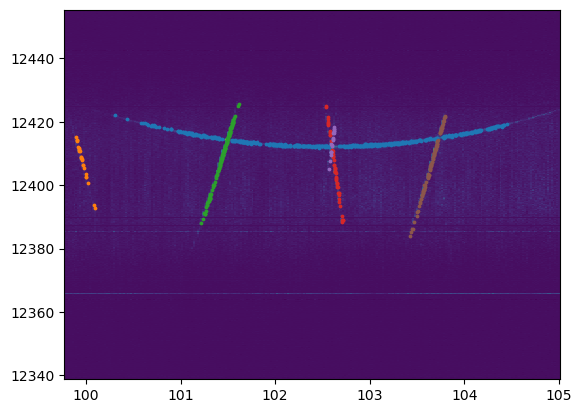

In [10]:
group_colors = ['red', 'green', 'black', 'blue', 'magenta','orange','cyan','yellow','violet','purple','gold','beige','aquamarine','wheat']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7','Group 8','Group 9','Group 10','Group 11','Group 12','Group 13','Group 14']
selected_points_by_group = {label: [] for label in group_labels}
selected_points_by_group["Group 1"] = np.unique([36, 42, 44, 48, 50, 52, 53, 56, 58, 60, 62, 64, 66, 68, 71, 74, 76, 78, 79, 82, 88, 91, 94, 96, 98, 102, 103, 105, 107, 108, 109, 110, 111, 112, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 131, 132, 133, 136, 137, 139, 140, 141, 142, 143, 144, 146, 147, 148, 149, 154, 155, 157, 158, 165, 178, 179, 180, 184, 185, 188, 191, 192, 193, 195, 198, 200, 201, 202, 206, 207, 209, 211, 195, 198, 200, 201, 202, 206, 207, 209, 211, 227, 296, 301, 310, 314, 317, 318, 319, 323, 325, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 398, 399, 400, 401, 402, 403, 404, 405, 406, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 438, 439, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 482, 483, 484, 485, 486, 489, 490, 491, 492, 493, 494, 496, 497, 499, 500, 503, 504, 505, 506, 508, 510, 512, 514, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 493, 494, 496, 497, 499, 500, 501, 503, 504, 505, 506, 508, 510, 512, 503, 504, 505, 506, 508, 510, 512, 514, 515, 517, 522, 523, 524, 525, 526, 527, 510, 512, 514, 515, 517, 522, 523, 524, 525, 526, 527, 535, 536, 543, 605, 608, 610, 616, 617, 618, 619, 620, 621, 622, 623, 625, 626, 627, 628, 629, 630, 631, 632, 633, 635, 636, 637, 638, 640, 641, 642, 643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 655, 656, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 673, 675, 676, 677, 678, 679, 681, 682, 683, 684, 685, 686, 687, 688, 689, 691, 692, 693, 695, 696, 697, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 718, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 738, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 774, 775, 776, 777, 778, 780, 781, 783, 784, 786, 787, 788, 789, 792, 793, 795, 797, 798, 800, 803, 804, 806, 808, 812, 826, 828, 830, 831, 834, 843, 844, 845, 848, 857, 866, 843, 844, 845, 848, 857, 866, 844, 845, 848, 857, 866, 877, 848, 857, 866, 877, 857, 866, 877, 881, 882, 911, 912, 913, 917, 918, 920, 921, 924, 926, 927, 928, 929, 930, 931, 932, 933, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 941, 942, 943, 944, 945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 953, 954, 955, 956, 957, 959, 960, 961, 962, 963, 964, 965, 966, 968, 966, 968, 969, 970, 971, 972, 973, 974, 975, 977, 978, 979, 972, 973, 974, 975, 977, 978, 979, 982, 983, 984, 985, 986, 987, 989, 990, 974, 975, 977, 978, 979, 982, 983, 984, 985, 986, 987, 989, 990, 991, 992, 993, 1002, 1003, 1004, 1005, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1015, 1016, 1017, 1019, 1020, 1021, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1028, 1034, 1035, 1036, 1034, 1035, 1036, 1037, 1027, 1028, 1029, 1030, 1031, 1033]).tolist()
selected_points_by_group["Group 2"] = np.unique([1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28]).tolist()
selected_points_by_group["Group 3"] = np.unique([138, 145, 150, 151, 152, 153, 156, 159, 160, 161, 162, 163, 164, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 181, 182, 183, 186, 187, 190, 194, 196, 197, 199, 203, 204, 205, 208, 210, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 254, 257, 258, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 283, 284, 285, 286, 287, 288, 289, 291, 292, 293, 294, 295, 297, 298, 299, 300, 302, 303, 304, 305, 306, 307, 308, 309, 311, 312, 315, 316, 324, 326, 246, 248, 249, 250, 251, 254, 257, 258, 259, 251, 254, 257, 258, 259, 260, 261, 262, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268]).tolist()
selected_points_by_group["Group 4"] = np.unique([518, 520, 528, 529, 530, 531, 532, 533, 537, 538, 540, 612, 613, 614, 615, 611, 609, 606, 607, 600, 602, 603, 604, 596, 597, 598, 599, 601, 590, 591, 592, 593, 582, 583, 584, 585, 586, 575, 577, 578, 580, 581, 575, 577, 569, 561, 563, 564, 566, 540, 541, 542, 546, 555, 556, 558]).tolist()
selected_points_by_group["Group 5"] = np.unique([571, 572, 573, 572, 573, 574, 567, 568, 567, 568, 570, 571, 572, 573, 559, 560, 562, 539, 534, 544, 547, 548, 550, 552, 553, 547, 548, 549]).tolist()
selected_points_by_group["Group 6"] = np.unique([858, 859, 860, 861, 794, 782, 785, 790, 791, 794, 799, 801, 802, 805, 807, 809, 810, 811, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 827, 829, 832, 835, 836, 837, 838, 839, 840, 841, 842, 846, 847, 849, 850, 851, 852, 853, 854, 855, 856, 858, 859, 860, 861, 862, 863, 864, 865, 867, 868, 869, 870, 871, 872, 873, 874, 875, 876, 878, 879, 880, 883, 884, 813, 814, 815, 816, 818, 919, 922, 923, 914, 915, 919, 922, 910, 914, 915, 905, 906, 907, 908, 909, 910, 896, 898, 899, 900, 901, 902, 904, 905, 906, 907, 879, 880, 883, 884, 885, 883, 884, 885, 886, 885, 886, 887, 891]).tolist()


pitches_H = []
E_H = []
plt.figure()
plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')

for lidx, points in enumerate(selected_points_by_group.values()):
    
    pitches_H.append(pitches[points].squeeze())
    E_H.append(Eph_seed[points].squeeze())
    print(lidx,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx],s=3)
plt.show()

(12200.0, 12500.0)

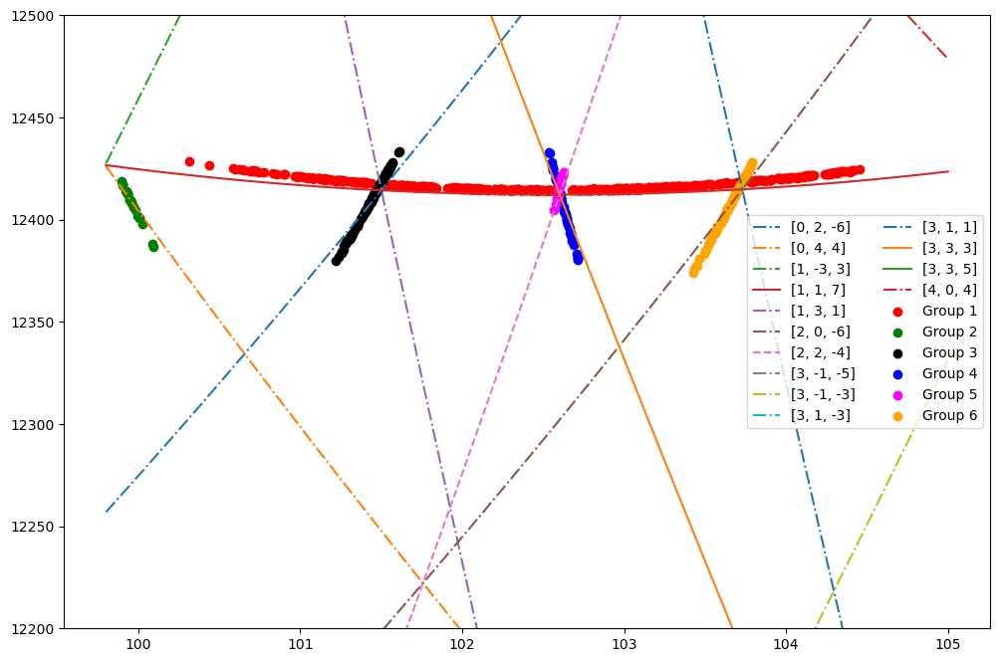

In [245]:
# compare with simulated lines and assign
#dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [ 1.14473852e+00,  1.10991002e+00, -1.01729259e+00,  1.07575895e-02, -5.83095293e+00]
dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [1.14877815, 1.36011027, -1.15388943, 0.00854174, -7.62291886]
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery[:]):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPguess,dRguess,dYguess,dRPguess)
    EBragg = np.array(EBragg) + Ecorrguess
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)
plt.ylim(12200,12500)


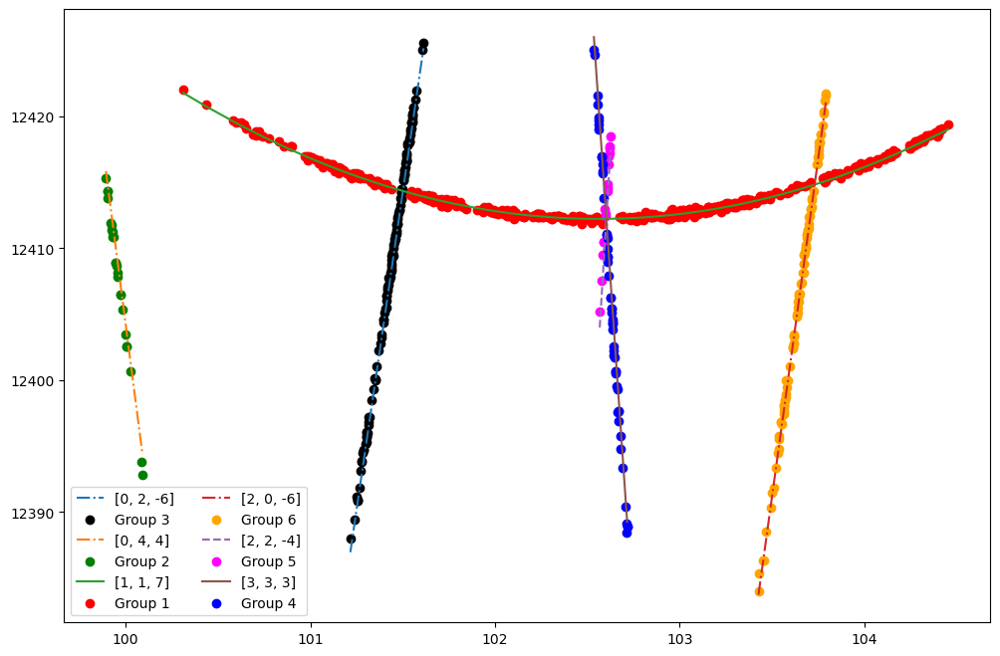

In [19]:
HtoMeas = [2,1,None,0,None,5,4,None,None,None,None,3,None,None]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

## scan #18 (around 80°)

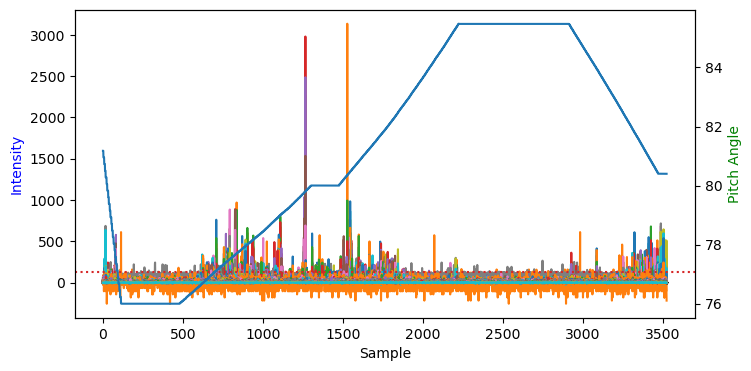

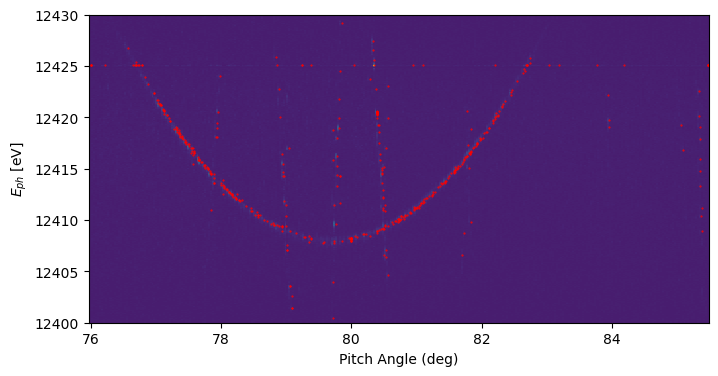

In [43]:
fidx = 18
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/25

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral))

x = dEdP*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.scatter(pitch, seeding_energy,s=1, color='r',marker='.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.ylim(bottom=12400,top=12430)
plt.show()



(12400.0, 12430.0)

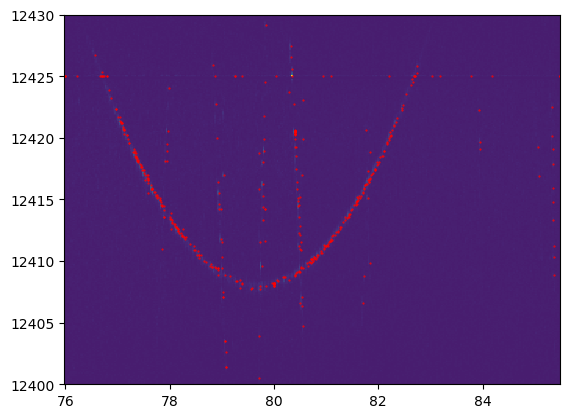

In [17]:
plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.scatter(pitch, seeding_energy,s=1, color='r',marker='.')
plt.ylim(bottom=12400,top=12430)


In [18]:
#fidx = 12
pitches = pitch_dict[str(fidx)]#pitch#
Eoffset_pre = 0#20
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict[str(fidx)])+Eoffset_pre
try:
    roll = roll_dict[str(fidx)]
    Hquery = Hquery_dict[str(fidx)]
except:
    roll = roll_in_database(datafiles[fidx-1])
    _, _, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll,np_phen,np_doocs)
#bmir.cryst.yaw = np.deg2rad(dY)
#Pitch = np.deg2rad(pitches)
#Hquery_acc += Hquery
print(Hquery)

Monochromator 2 image found; 
Machine status file found: roll angle=0.4 deg 

['[0, 2, 6]', '[0, 4, -4]', '[1, -3, -5]', '[1, -3, -3]', '[1, -3, 5]', '[1, -1, -7]', '[1, 1, -7]', '[1, 3, -1]', '[1, 3, 3]', '[2, 0, 6]', '[2, 2, 4]', '[3, -1, 3]', '[3, 1, -1]', '[3, 1, 3]', '[3, 3, -5]', '[3, 3, -3]', '[4, 0, -4]']


In [19]:
%matplotlib widget

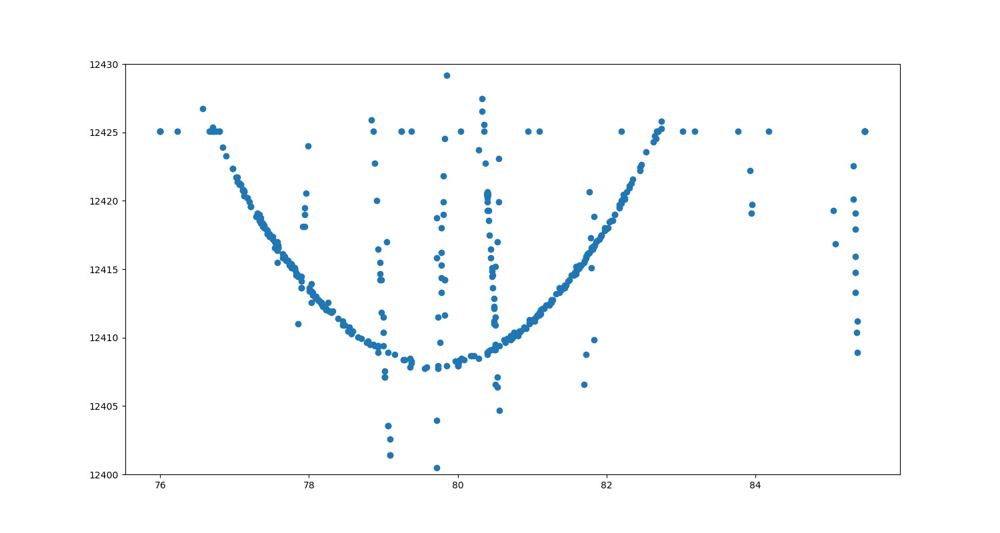

Selected points for Group 1: [  0   1   3   6   7  11  13  14  15  19  24  26  67  68  71  72  73  74
  75  76  77  78  79  80  81  82  83  84  85  86  87  88  90  91  92  95
  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 112 113
 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131
 132 133 134 136 137 138 140 141 142 143 145 146 147 148 149 150 152 153
 154 157 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 194 195 196 197 198 199 201
 202 203 204 207 209 210 211 212 214 217 220 229 242 245 246 248 249 250
 253 254 262 263 274 277 279 284 286 287 288 289 293 294 295 297 298 300
 301 303 304 306 308 309 312 313 314 315 328 334 335 339 340 345 346 347
 348 350 351 352 353 354 355 357 358 359 360 361 362 363 364 365 366 367
 368 369 370 371 372 374 375 376 378 379 380 381 382 384 385 387 388 391
 392 393 395 397 398 399 400 401 402 403 404 405 406 407 409 410 411 412
 414 415 416 417 418 4

In [21]:
fig, ax = plt.subplots(figsize=(15,8))
scatter = ax.scatter(pitches, Eph_seed,picker=True)

# Interactive point selection
#cursor = mplcursors.cursor(sc, hover=True)
group_colors = ['red', 'green', 'black', 'blue', 'magenta','orange','cyan','yellow','violet','purple','gold','beige','aquamarine','wheat']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7','Group 8','Group 9','Group 10','Group 11','Group 12','Group 13','Group 14']
selected_points_by_group = {label: [] for label in group_labels}

current_group_idx = 0
deselect_mode = False

# Function to change the color of the selected points based on the current group
def update_point_colors(selected, colors):
    scatter.set_facecolor(['gray'] * len(pitches))  # Reset all points to default color
    for idx, (group, points) in enumerate(selected_points_by_group.items()):
        if points:
            color = group_colors[idx]
            selected_points = np.array(points)
            scatter._facecolors[selected_points[:].astype(int)]=np.repeat([mcolors.to_rgba(color)],selected_points.shape[0],axis=0)
            # scatter._facecolors[selected_points[:, 0].astype(int)] = mcolors.to_rgb(color)
    fig.canvas.draw()

# Function to handle point selection with lasso
def onselect_lasso(verts):
    global current_group_idx
    path = Path(verts)
    selected = path.contains_points(np.column_stack((pitches, Eph_seed)))
    selected_indices = np.where(selected)[0]

    for i in selected_indices:
        if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
            del selected_points_by_group[group_labels[current_group_idx]][i]
        elif not deselect_mode:  # Select point if 'd' is not pressed
            selected_points_by_group[group_labels[current_group_idx]].append(i)

    print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
    update_point_colors(selected_indices, group_colors)

def on_pick(event):
    if event.mouseevent.button == 1:
        selected_indices = event.ind
        for i in selected_indices:
            if i in selected_points_by_group[group_labels[current_group_idx]] and deselect_mode:  # Deselect point if 'd' is pressed
                loc_idx = np.where(selected_points_by_group[group_labels[current_group_idx]]==i)
                print(loc_idx[0][0])
                del selected_points_by_group[group_labels[current_group_idx]][loc_idx[0][0]]
            elif not deselect_mode:  # Select point if 'd' is not pressed
                selected_points_by_group[group_labels[current_group_idx]].append(i)
        #print(f"Selected points for {group_labels[current_group_idx]}: {selected_indices}")
        update_point_colors(selected_indices, group_colors)
    # xdata = x[ind[0]]
    # ydata = y[ind[0]]

    
    #xdata, ydata = line.get_data()
    #ind = event.ind
    
    #print(f'on pick line: {xdata[ind]}, {ydata[ind]}')

cid = fig.canvas.mpl_connect('pick_event', on_pick)

# Lasso and Rectangle selectors
lasso = LassoSelector(ax, onselect_lasso)


# Function to handle key press events (switch groups with 'n' or 'p')
def on_key(event):
    global current_group_idx, deselect_mode
    if event.key == 'n':  # Switch to the next group on pressing 'n'
        current_group_idx = (current_group_idx + 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'm' and current_group_idx>1:  # Switch to the previous group on pressing 'p'
        current_group_idx = (current_group_idx - 1) % len(group_labels)
        print(f"Switched to {group_labels[current_group_idx]}")
    if event.key == 'd':  # Switch deselect mode
        if deselect_mode:
            deselect_mode = False
            print("Switched off deselect mode")
        else:
            deselect_mode = True
            print("Switched on deselect mode")

    

# Connect the key press event
fig.canvas.mpl_connect('key_press_event', on_key)
plt.ylim(12400,12430)
plt.show()

In [23]:
for key, points in selected_points_by_group.items():
    print(f"selected_points_by_group['{key}'] = {points}")

selected_points_by_group['Group 1'] = [0, 1, 3, 6, 7, 11, 13, 14, 15, 19, 24, 26, 67, 68, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 136, 137, 138, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 152, 153, 154, 157, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 194, 195, 196, 197, 198, 199, 201, 202, 203, 204, 207, 209, 210, 211, 212, 214, 217, 220, 229, 242, 245, 246, 248, 249, 250, 253, 254, 262, 263, 274, 277, 279, 284, 286, 287, 288, 289, 293, 294, 295, 297, 298, 300, 301, 303, 304, 306, 308, 309, 312, 313, 314, 315, 328, 334, 335, 339, 340, 345, 346, 347, 348, 350, 351, 352, 353, 354, 355, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 3

In [ ]:
%matplotlib inline
plt.figure()

0 : [0, 1, 3, 6, 7, 11, 13, 14, 15, 19, 24, 26, 67, 68, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 136, 137, 138, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 152, 153, 154, 157, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 194, 195, 196, 197, 198, 199, 201, 202, 203, 204, 207, 209, 210, 211, 212, 214, 217, 220, 229, 242, 245, 246, 248, 249, 250, 253, 254, 262, 263, 274, 277, 279, 284, 286, 287, 288, 289, 293, 294, 295, 297, 298, 300, 301, 303, 304, 306, 308, 309, 312, 313, 314, 315, 328, 334, 335, 339, 340, 345, 346, 347, 348, 350, 351, 352, 353, 354, 355, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 374, 375, 376, 378, 379, 

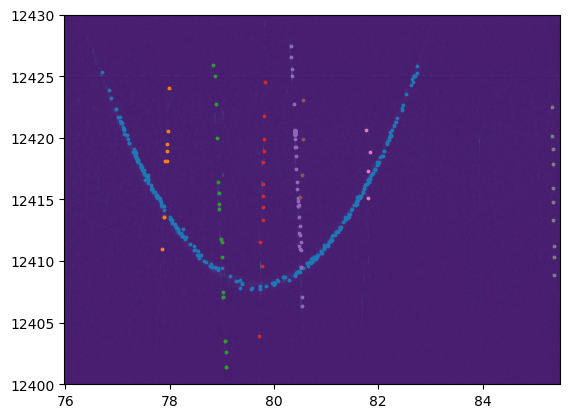

In [36]:
selected_points_by_group['Group 1'] = [0, 1, 3, 6, 7, 11, 13, 14, 15, 19, 24, 26, 67, 68, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 136, 137, 138, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 152, 153, 154, 157, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 194, 195, 196, 197, 198, 199, 201, 202, 203, 204, 207, 209, 210, 211, 212, 214, 217, 220, 229, 242, 245, 246, 248, 249, 250, 253, 254, 262, 263, 274, 277, 279, 284, 286, 287, 288, 289, 293, 294, 295, 297, 298, 300, 301, 303, 304, 306, 308, 309, 312, 313, 314, 315, 328, 334, 335, 339, 340, 345, 346, 347, 348, 350, 351, 352, 353, 354, 355, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 374, 375, 376, 378, 379, 380, 381, 382, 384, 385, 387, 388, 391, 392, 393, 395, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 409, 410, 411, 412, 414, 415, 416, 417, 418, 419, 420, 422, 423, 424, 425, 426, 427, 515, 516, 517, 518, 519, 521, 522, 523, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 536, 537, 538, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 559, 560, 561, 562, 563, 565, 567, 569, 570, 571, 572, 573, 576, 577, 579, 580, 581, 582, 585, 593, 597, 615, 627, 57]
selected_points_by_group['Group 2'] = [158, 159, 160, 161, 162, 163, 151, 155, 156]
selected_points_by_group['Group 3'] = [213, 215, 216, 218, 221, 222, 223, 224, 226, 227, 228, 230, 231, 232, 237, 238, 239, 240, 241]
selected_points_by_group['Group 4'] = [273, 272, 271, 270, 269, 268, 267, 266, 265, 261, 264, 260]
selected_points_by_group['Group 5'] = [318, 317, 320, 319, 321, 324, 325, 596, 598, 602, 604, 606, 607, 609, 610, 611, 618, 621, 628, 599, 600, 601, 603, 605, 612, 613, 614, 616, 617, 619, 620, 622, 623, 624, 625, 626, 629, 630, 326, 595, 327, 594, 329, 330, 333, 333, 592, 331, 332, 591, 590, 336, 589, 341, 337, 338, 588, 342, 340, 586]
selected_points_by_group['Group 6'] = [343, 344, 587, 4]
selected_points_by_group['Group 7'] = [389, 390, 535, 394]
selected_points_by_group['Group 8'] = [448, 449, 450, 451, 452, 453, 490, 491, 492, 493]
pitches_H = []
E_H = []
plt.figure()
plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')

for lidx, points in enumerate(selected_points_by_group.values()):
    
    pitches_H.append(pitches[points].squeeze())
    E_H.append(Eph_seed[points].squeeze())
    print(lidx,':',points)
    # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
    plt.scatter(pitches_H[lidx],E_H[lidx],s=3)
plt.ylim(12400,12430)
plt.show()

(12400.0, 12430.0)

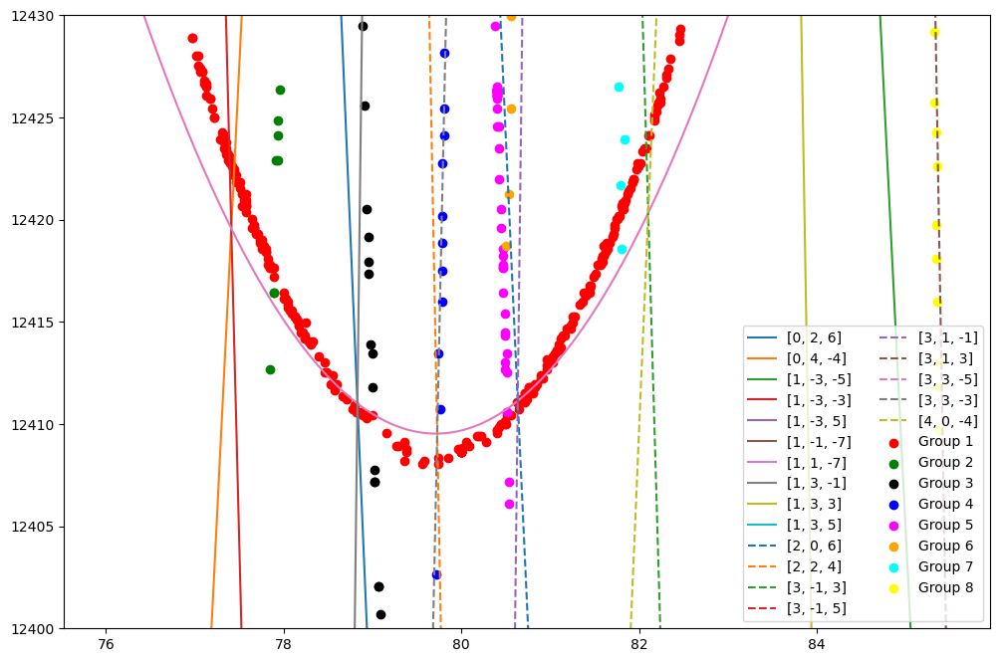

In [73]:
# compare with simulated lines and assign
#dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [ 1.14473852e+00,  1.10991002e+00, -1.01729259e+00,  1.07575895e-02, -5.83095293e+00]
dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [1.14877815, 1.36011027, -1.15388943, 0.00854174, -7.62291886]
pitch_list = np.linspace(min(pitches),max(pitches),1000) 
#RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery[:]):
    EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll],dPguess,dRguess,dYguess,dRPguess)
    EBragg = np.array(EBragg) + Ecorrguess
    linestyle = '-'
    if Hidx>=10:
         linestyle = 'dashed'
    plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
for lidx,pitchi in enumerate(pitches_H):
        if pitchi.size>0:
            ax.scatter(pitchi,E_H[lidx],color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)
plt.ylim(12400,12430)


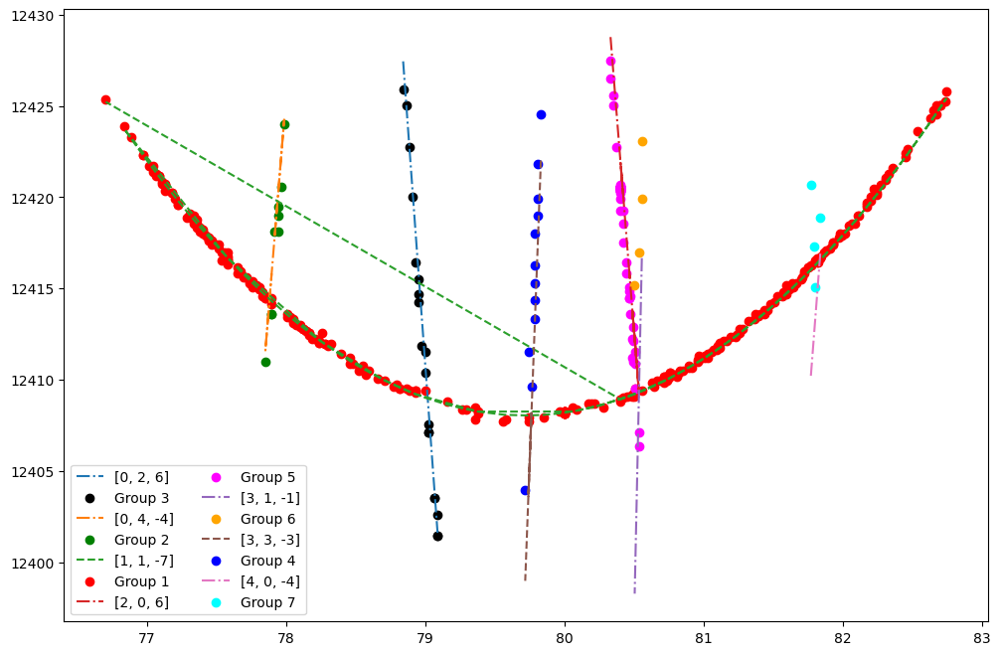

In [44]:
#HtoMeas = [2,1,None,None,None,None,0,None,None,4,None,None,5,7,None,3,6]
HtoMeas = [2,1,None,None,None,None,0,None,None,None,4,None,None,None,None,7,None,None,None]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

### try to fit

In [ ]:

#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery):
        lidx = HtoMeas[Hidx]
        if lidx is not None:
            peval = np.array(pitches_H[lidx])
            #if peval.size>0 :
            EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
            EBraggs = np.array(EBraggs) +Ecorr
            cost += np.sum((EBraggs-E_H[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        #plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery):
            lidx = HtoMeas[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitches_H[lidx]
                # if peval.size>0:
                EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll],dP,dR,dY,dPR)
                EBragg = np.array(EBragg) +Ecorr

                #print(peval_sub.min(),peval_sub.max())
                plt.scatter(peval,E_H[lidx],marker='x')
                plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dPguess, dRguess, dYguess, dRPguess, Ecorrguess])
# x0 = np.array([0, -2, 0, 0, Ecorrguess])
bounds = ([-2,2],[-3,3],[-3,3],[-2,2],[-10,10])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

# multiple sets of lines together (scans number 2)

In [30]:
# #start with current fix=3
pitch_acc = []
E_H_acc = []
roll_acc = []#roll for idx in range(len(pitch_acc))]
Hquery_acc = []#Hquery
HtoMeas_acc = []
dEdP_orig = 0.15
Ecentral_orig = 12407
# dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [ 1.14473852e+00,  1.10991002e+00, -1.01729259e+00,  1.07575895e-02, -5.83095293e+00]
dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [1.15497246, 0.61820617, -0.82300946,  0.01643269, -7.39200109]
# dPguess,dRguess,dYguess,dRPguess,Ecorrguess = [ 1.14473852e+00,  1.10991002e+00, -1.01729259e+00,  1.07575895e-02, 1]
#[ 1.07751213e+00,  2.10995426e+00 ,-2.26427577e+00, -2.55980253e-03, -1.50456395e+01]

### scan #2

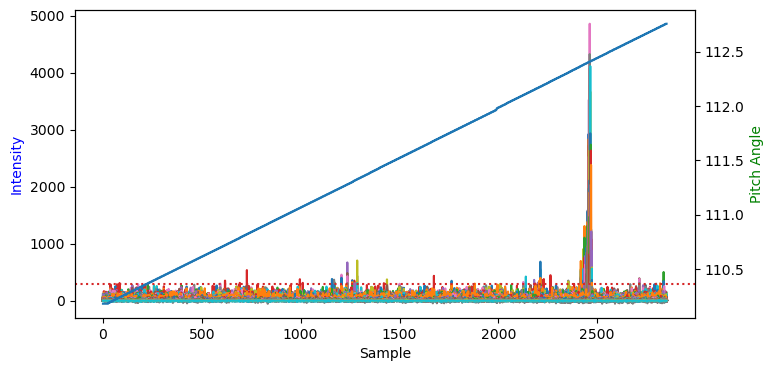

Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 

['[1, -3, -1]', '[1, 1, -1]', '[1, 1, 7]', '[2, 4, 2]', '[3, 3, 5]', '[4, 2, 2]']


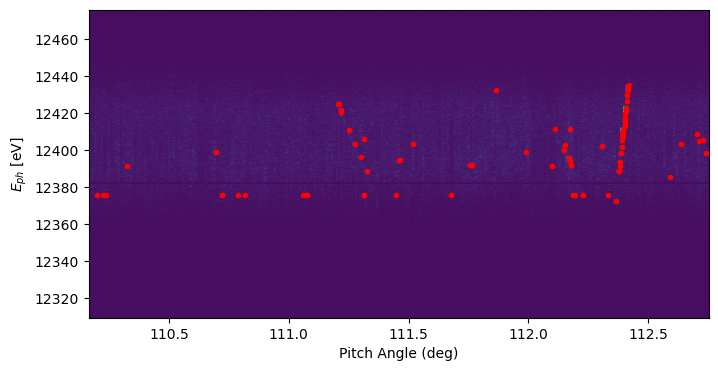

In [31]:
fidx = 2
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/17

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral_orig))

x = dEdP_orig*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral_orig
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
pitches = pitch
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict
try:
    roll = roll_dict[str(fidx)]
    Hquery = Hquery_dict[str(fidx)]
    
except:
    roll = roll_in_database(datafiles[fidx-1])
    _, _, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll,np_phen,np_doocs)
print(Hquery)
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


0 : [13, 14, 15, 16, 17, 18, 19, 20, 21, 25]
1 : [44, 45, 43, 40, 41, 38, 37]
2 : [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]


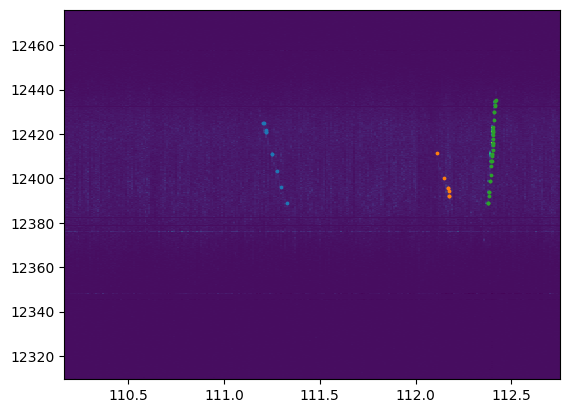

In [32]:
group_colors = ['red', 'green', 'blue', 'yellow','purple','magenta','orange']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
selected_points_by_group = {label: [] for label in group_labels}

selected_points_by_group['Group 1'] = [13, 14, 15, 16, 17, 18, 19, 20, 21, 25]
selected_points_by_group['Group 2'] = [44, 45, 43, 40, 41, 38, 37]
selected_points_by_group['Group 3'] = [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86]


pitches_H = []
E_H = []
plt.figure()
plt.pcolormesh(np_doocs,tt['phen_scale'] ,tt['corr2d'].T,shading='auto')

for lidx, points in enumerate(selected_points_by_group.values()):
    if(len(points)>0):
        pitches_H.append(pitches[points].squeeze())
        E_H.append(Eph_seed[points].squeeze())
        print(lidx,':',points)
        # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
        plt.scatter(pitches_H[lidx],E_H[lidx],s=3)
plt.show()

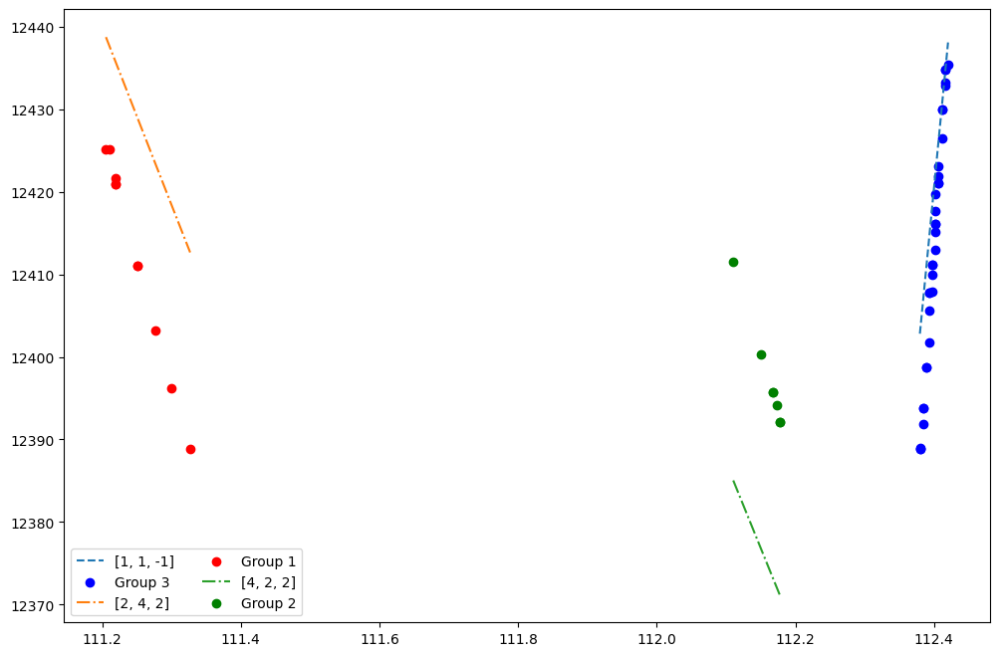

In [33]:
HtoMeas = [None,2,None,0,None,1]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

In [34]:
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
ncur = len(HtoMeas_acc)
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]


In [35]:
HtoMeas_acc

[2, 0, 1]

### scan #9

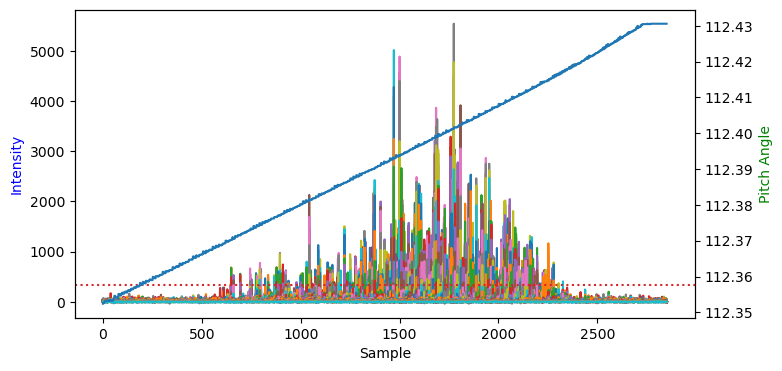

Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 

['[1, 1, -1]', '[1, 1, 7]', '[2, 4, 2]', '[4, 2, 2]']


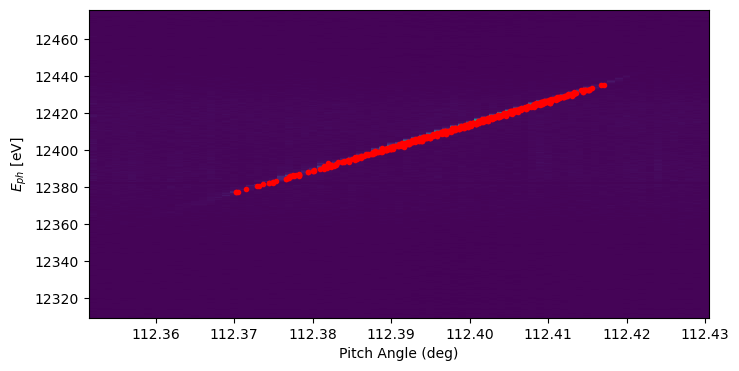

In [36]:
fidx = 9
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/17

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral_orig))

x = dEdP_orig*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral_orig
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
pitches = pitch
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict
try:
    roll = roll_dict[str(fidx)]
    Hquery = Hquery_dict[str(fidx)]
    
except:
    roll = roll_in_database(datafiles[fidx-1])
    _, _, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll,np_phen,np_doocs)
print(Hquery)
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


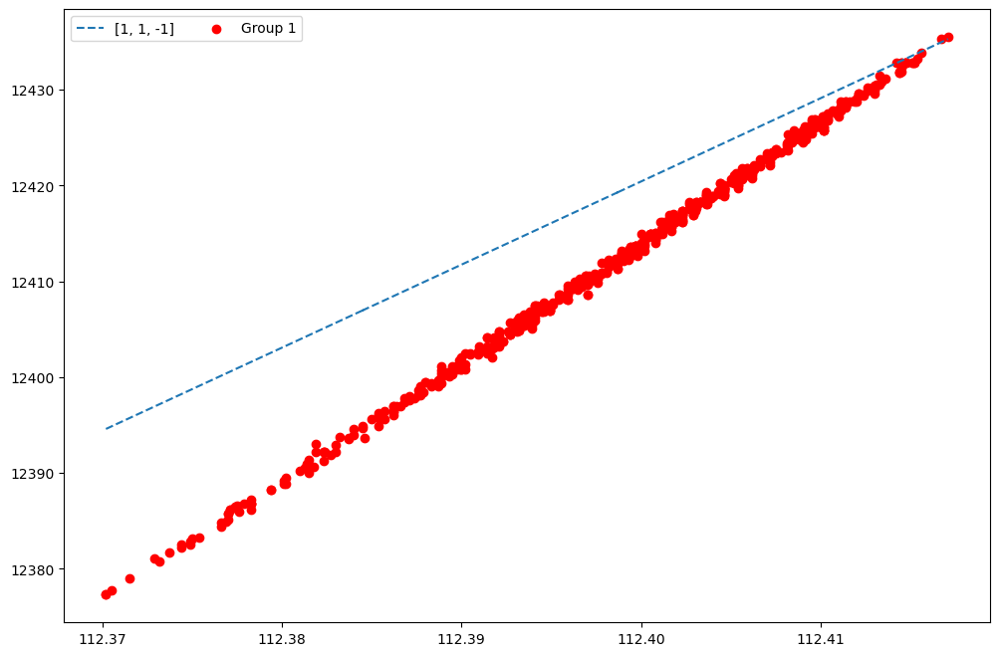

In [37]:
pitches_H = [pitches]#pitch#
Eoffset_pre = 0#20
E_H = [Eph_seed]#np.array
HtoMeas = [0,None,None,None]
#HtoMeas = [None,2,None,0,None,1]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

In [38]:
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
ncur = len(HtoMeas_acc)
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]


In [39]:
HtoMeas_acc

[2, 0, 1, 3]

### scan #14

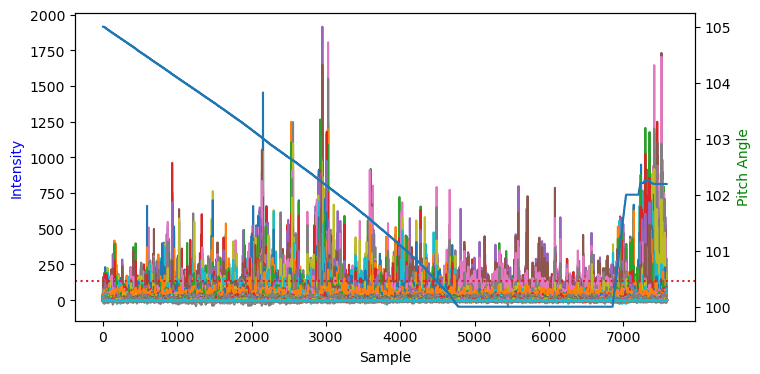

Monochromator 2 image found; 
Machine status file found: roll angle=1.7 deg 

['[0, 2, -6]', '[0, 4, 4]', '[1, -3, 3]', '[1, 1, 7]', '[1, 3, 1]', '[2, 0, -6]', '[2, 2, -4]', '[3, -1, -3]', '[3, 1, 1]', '[3, 3, 3]', '[3, 3, 5]', '[4, 0, 4]']


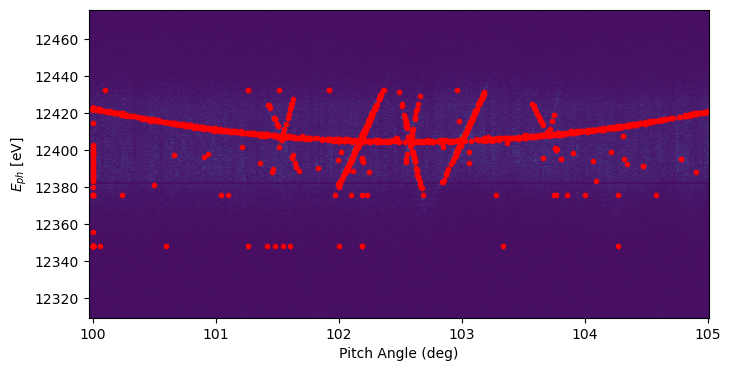

In [40]:
fidx = 14
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/14

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral_orig))

x = dEdP_orig*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral_orig
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
pitches = pitch
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict
try:
    roll = roll_dict[str(fidx)]
    Hquery = Hquery_dict[str(fidx)]
    
except:
    roll = roll_in_database(datafiles[fidx-1])
    _, _, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll,np_phen,np_doocs)
print(Hquery)
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


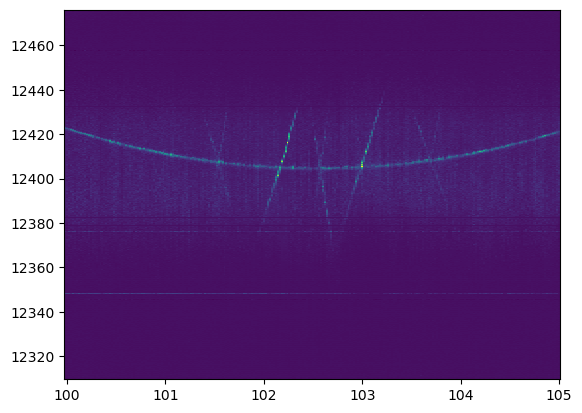

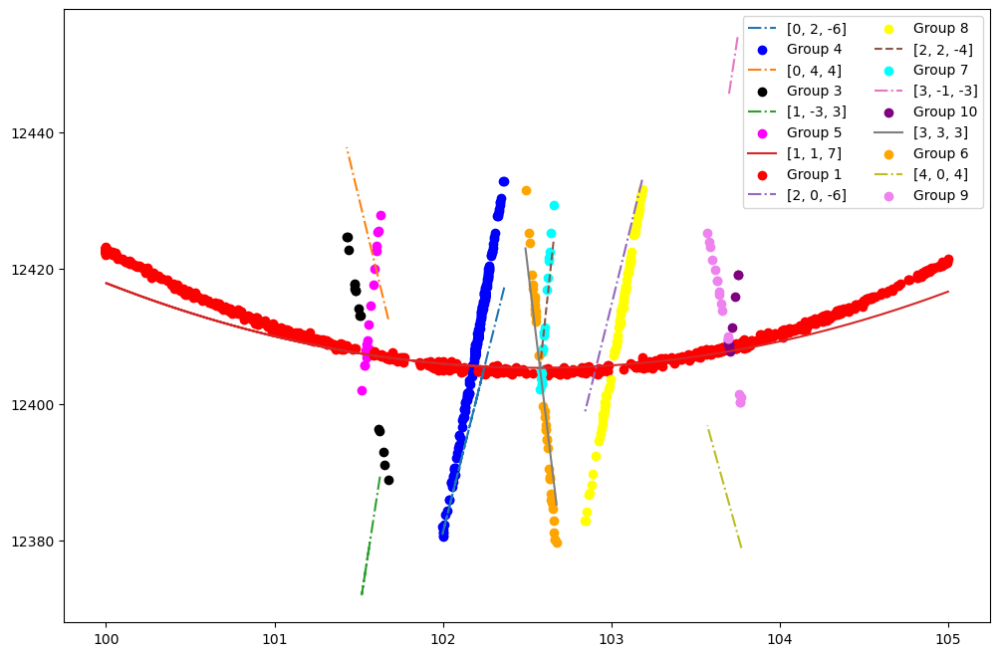

In [41]:
group_colors = ['red', 'green', 'black', 'blue', 'magenta','orange','cyan','yellow','violet','purple','gold','beige','aquamarine','wheat']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7','Group 8','Group 9','Group 10','Group 11','Group 12','Group 13','Group 14']
selected_points_by_group = {label: [] for label in group_labels}
selected_points_by_group["Group 1"] = np.unique([ [939, 940, 941, 942, 943, 944, 945, 946, 947, 948, 952, 953, 954, 955, 956, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 974, 975, 976, 977, 978, 979, 980, 981, 982, 984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1049, 1050, 1052, 1053, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1062, 1063, 1064, 1065, 1066, 1067, 1068, 1069, 1070, 1071, 1072, 1074, 1075, 1076, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1124, 1125, 1126, 1127, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1136, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1146, 1148, 1149, 1150, 1151, 1152, 1153, 1154, 1155, 1157, 1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1170, 1172, 1173, 1174, 1176, 1177, 1178, 1180, 1182, 1183, 1184, 1185, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1204, 1205, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1227, 1228, 1229, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1290, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1301, 1303, 1304, 1305, 1307, 1308, 1309, 1310, 1311, 1312, 1313, 1315, 1316, 1318, 1319, 1320, 1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1340, 1341, 1342, 1343, 1347, 1349, 1351, 1352, 1354, 1355, 1356, 1357, 1358, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1374, 1375, 1376, 1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1389, 1390, 1391, 1393, 1395, 1397, 1398, 1399, 1400, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424, 1425, 1426, 1427, 1429, 1430, 1431, 1432, 1433, 1434, 1435, 1436, 1437, 1438, 1439, 1440, 1441, 1442, 1443, 1444, 1445, 1446, 1447, 1448, 1449, 1450, 1451, 1452, 1453, 1454, 1455, 1456, 1457, 1458, 1459, 1460, 1461, 1462, 1463, 1464, 1465, 1466, 1467, 1468, 1470, 1471, 1472, 1473, 1474, 1475, 1476, 1477, 1478, 1059, 1060, 1062, 1460, 1461, 925, 927, 928, 929, 930, 931, 932, 934, 935, 936, 937, 1479, 1480, 1481, 915, 916, 921, 923, 924, 925, 926, 927, 928, 929, 1481, 1482, 911, 915, 916, 921, 923, 1482, 1483, 855, 856, 858, 860, 861, 862, 865, 866, 874, 875, 877, 878, 879, 1488, 851, 852, 854, 855, 856, 858, 860, 861, 862, 865, 866, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 1489, 839, 840, 841, 842, 843, 844, 845, 846, 834, 835, 1490, 819, 822, 823, 824, 825, 826, 827, 828, 831, 832, 833, 796, 797, 801, 802, 805, 806, 811, 812, 814, 816, 817, 1491, 1492, 1494, 1495, 1496, 1498, 1500, 1501, 1502, 1503, 1505, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1515, 1516, 1517, 1518, 1520, 1522, 784, 788, 792, 796, 797, 801, 802, 805, 806, 1522, 792, 796, 797, 801, 802, 805, 806, 811, 812, 814, 816, 1491, 1492, 1494, 1495, 1496, 1498, 1500, 1501, 1502, 1503, 1505, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1515, 1516, 1517, 1518, 1520, 1522, 802, 805, 806, 811, 812, 814, 816, 817, 818, 820, 1491, 1492, 1494, 1495, 1496, 1498, 1500, 1501, 1502, 1503, 1505, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1515, 1516, 1517, 1518, 1520, 772, 776, 777, 779, 784, 788, 792, 1522, 1527, 649, 651, 653, 654, 656, 657, 658, 661, 663, 665, 666, 673, 693, 1573, 1584, 1598, 1607, 673, 693, 701, 707, 708, 723, 1573, 1584, 1598, 1607, 693, 701, 707, 708, 723, 1547, 1551, 1555, 1573, 1584, 1598, 1607, 1611, 639, 649, 651, 652, 653, 654, 656, 657, 658, 661, 663, 665, 673, 627, 628, 629, 630, 631, 632, 633, 634, 637, 639, 633, 634, 637, 639, 649, 650, 651, 652, 653, 654, 656, 657, 620, 623, 624, 625, 626, 627, 628, 629, 613, 618, 619, 620, 531, 532, 533, 534, 536, 538, 539, 543, 548, 532, 533, 534, 536, 538, 539, 543, 548, 559, 560, 562, 563, 538, 539, 543, 548, 559, 560, 562, 563, 568, 572, 573, 575, 578, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 505, 507, 511, 512, 513, 514, 515, 516, 517, 518, 519, 493, 494, 495, 496, 501, 502, 504, 505, 507, 508, 511, 484, 485, 489, 490, 491, 493, 494, 495, 496, 462, 465, 466, 467, 468, 470, 473, 484, 485, 489, 490, 491, 493, 398, 420, 377, 381, 385, 389, 390, 396, 398, 363, 364, 365, 366, 367, 369, 370, 371, 372, 377, 381, 351, 354, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 348, 349, 350, 351, 352, 353, 354, 356, 357, 358, 359, 360, 361, 362, 334, 335, 336, 337, 338, 339, 340, 341, 342, 335, 336, 337, 338, 339, 340, 341, 342, 344, 345, 346, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 317, 318, 319, 320, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 297, 298, 299, 300, 302, 304, 305, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 273, 274, 275, 276, 279, 280, 282, 283, 286, 287, 288, 291, 293, 294, 295, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 252, 256, 257, 258, 259, 260, 214, 217, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 229, 230, 231, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 236, 196, 197, 198, 199, 200, 201, 202, 203, 205, 196, 197, 198, 199, 200, 201, 202, 203, 205, 206, 207, 208, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 211, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 211, 212, 213, 189, 190, 191, 192, 193, 194, 196, 197, 198, 176, 177, 178, 180, 181, 182, 183, 185, 186, 187, 188, 189, 155, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 173, 174, 149, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 173, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 115, 116, 117, 118, 122, 123, 124, 125, 126, 127, 129, 133, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 38, 39, 40, 41, 42, 43, 47, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 115, 116, 117, 50, 51, 52, 37, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 4, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17]]).tolist()
selected_points_by_group["Group 2"] = np.unique([1147, 1158, 1168, 1169, 1175, 1179, 1181, 1203, 1206, 1226, 1230, 1289, 1291, 1317, 1329, 1353, 1359, 1360, 1371, 1377, 1394, 1396, 1145, 1306, 1346, 1372, 1388, 1428]).tolist()
selected_points_by_group["Group 3"] = np.unique([918, 919, 920, 908, 909, 910, 912, 913, 903, 905, 906, 857, 859, 853, 867, 868]).tolist()
selected_points_by_group["Group 4"] = np.unique([635, 636, 638, 640, 641, 642, 643, 655, 659, 660, 664, 667, 668, 669, 670, 671, 672, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 694, 695, 696, 697, 698, 699, 700, 702, 703, 704, 705, 706, 709, 710, 711, 712, 713, 714, 716, 717, 718, 719, 720, 721, 722, 724, 725, 726, 727, 729, 730, 731, 733, 736, 739, 740, 741, 742, 743, 744, 745, 746, 749, 750, 751, 752, 753, 754, 756, 757, 758, 759, 760, 761, 762, 764, 765, 766, 767, 768, 769, 770, 771, 773, 775, 780, 781, 782, 783, 785, 786, 787, 789, 790, 791, 793, 794, 795, 798, 799, 800, 803, 804, 807, 809, 810, 813, 1497, 1499, 1504, 1514, 1519, 1521, 1523, 1524, 1525, 1526, 1528, 1529, 1530, 1531, 1534, 1535, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1543, 1544, 1545, 1546, 1548, 1549, 1550, 1552, 1553, 1554, 1556, 1557, 1558, 1559, 1560, 1561, 1562, 1563, 1564, 1565, 1566, 1567, 1568, 1569, 1570, 1571, 1572, 1574, 1575, 1576, 1577, 1578, 1579, 1580, 1581, 1582, 1583, 1585, 1586, 1587, 1588, 1589, 1590, 1591, 1593, 1594, 1595, 1596, 1597, 1599, 1600, 1601, 1602, 1603, 1604, 1605, 1606, 1608, 1609, 1610, 1612, 1614, 1615, 1616, 1617, 1618, 1619, 1620, 1621, 1622, 1623, 1624, 1625, 1626, 1627, 1629, 1635, 1637, 1638, 1651, 1657, 1659, 1669, 1672, 1684, 1695, 1699, 1706, 1707, 1709, 1712, 1722, 642, 643, 644, 645, 646, 647, 648, 728, 730, 731, 732, 733, 736, 737, 739, 1532, 1623, 1624, 1625, 1626, 1627, 1628, 1629, 1630, 1631, 1632, 1633, 1635, 1636, 1637, 1638, 1639, 1640, 1641, 1642, 1644, 1645, 1646, 1647, 1648, 1649, 1650, 1651, 1652, 1653, 1654, 1655, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1666, 1667, 1668, 1669, 1670, 1671, 1672, 1673, 1675, 1676, 1678, 1679, 1680, 1682, 1683, 1684, 1685, 1686, 1687, 1688, 1689, 1691, 1692, 1695, 1696, 1697, 1698, 1699, 1700, 1701, 1702, 1703, 1704, 1705, 1706, 1707, 1709, 1710, 1712, 1713, 1714, 1715, 1716, 1717, 1718, 1719, 1720, 1721, 1722, 1723, 1724]).tolist()
selected_points_by_group["Group 5"] = np.unique([869, 870, 871, 872, 876, 880, 887, 1487, 863, 891, 901, 893, 896, 897, 885, 889, 891, 895, 1485, 863]).tolist()
selected_points_by_group["Group 6"] = np.unique([617, 615, 616, 612, 614, 609, 610, 611, 601, 602, 603, 604, 605, 606, 600, 601, 602, 603, 604, 605, 537, 540, 541, 542, 542, 544, 544, 546, 547, 549, 551, 552, 553, 555, 553, 558, 564, 567, 566, 567, 569, 570, 571, 574, 582, 571, 574, 576, 597, 598]).tolist()
selected_points_by_group["Group 7"] = np.unique([545, 550, 554, 556, 556, 557, 557, 561, 561, 565, 577, 579, 580, 581, 583, 584, 585, 588, 589, 590, 596, 588, 589, 590, 591, 592, 593]).tolist()
selected_points_by_group["Group 8"] = np.unique([373, 374, 375, 376, 378, 379, 380, 382, 383, 384, 386, 387, 388, 391, 392, 393, 394, 395, 397, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 421, 422, 423, 424, 425, 426, 427, 428, 429, 431, 432, 434, 435, 436, 437, 438, 439, 440, 441, 442, 461, 463, 469, 472, 475, 476, 478, 479, 480, 481, 482, 483, 486, 487, 488, 492, 497, 498, 499, 500, 503, 509, 510, 463, 469, 471, 472, 477, 460, 461, 463, 441, 442, 443, 444, 446, 447, 448, 443, 444, 446, 447, 448, 449]).tolist()
selected_points_by_group["Group 9"] = np.unique([301, 303, 306, 296, 289, 290, 292, 281, 284, 285, 277, 281, 270, 271, 272, 247, 249, 250, 251]).tolist()
selected_points_by_group["Group 10"] = np.unique([253, 254, 261, 262, 264, 265, 266, 267, 268, 269]).tolist()

pitches_H = []
E_H = []
plt.figure()
plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
for lidx, points in enumerate(selected_points_by_group.values()):
    if(len(points)>0):
        pitches_H.append(pitches[points].squeeze())
        E_H.append(Eph_seed[points].squeeze())

HtoMeas = [3,2,4,0,None,7,6,9,None,5,None,8]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)



In [42]:
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
ncur = len(HtoMeas_acc)
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]


In [43]:
HtoMeas_acc


[2, 0, 1, 3, 7, 6, 8, 4, 11, 10, 13, 9, 12]

## scan #16

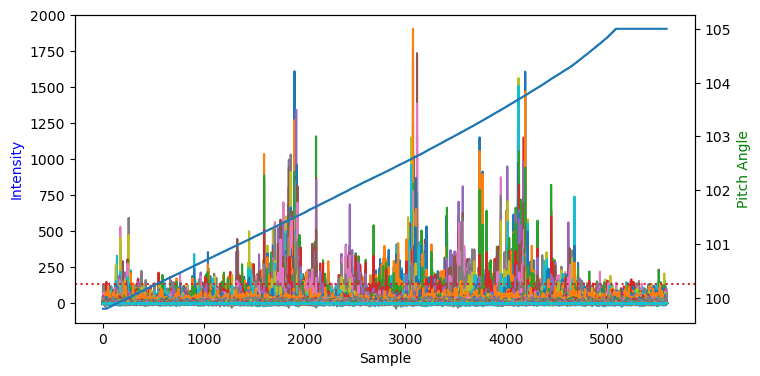

Monochromator 2 image found; 
Machine status file found: roll angle=0.4 deg 

['[0, 2, -6]', '[0, 4, 4]', '[1, -3, 3]', '[1, 1, 7]', '[1, 3, 1]', '[2, 0, -6]', '[2, 2, -4]', '[3, -1, -5]', '[3, -1, -3]', '[3, 1, -3]', '[3, 1, 1]', '[3, 3, 3]', '[3, 3, 5]', '[4, 0, 4]']


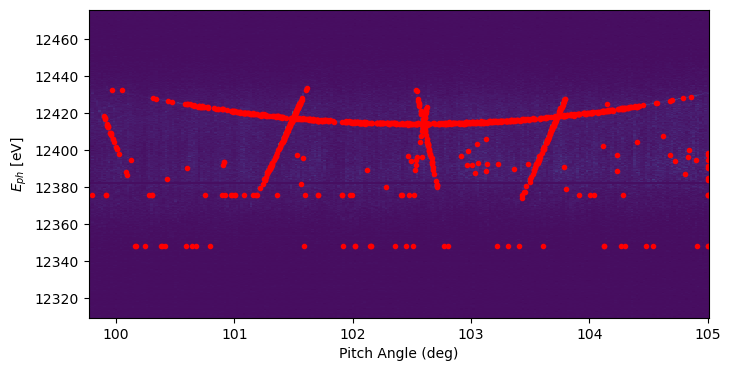

In [44]:
fidx = 16
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/14

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral_orig))

x = dEdP_orig*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral_orig
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
pitches = pitch
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict
try:
    roll = roll_dict[str(fidx)]
    Hquery = Hquery_dict[str(fidx)]
    
except:
    roll = roll_in_database(datafiles[fidx-1])
    _, _, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll,np_phen,np_doocs)
print(Hquery)
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


0 : [36, 42, 44, 48, 50, 52, 53, 56, 58, 60, 62, 64, 66, 68, 71, 74, 76, 78, 79, 82, 88, 91, 94, 96, 98, 102, 103, 105, 107, 108, 109, 110, 111, 112, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 131, 132, 133, 136, 137, 139, 140, 141, 142, 143, 144, 146, 147, 148, 149, 154, 155, 157, 158, 165, 178, 179, 180, 184, 185, 188, 191, 192, 193, 195, 198, 200, 201, 202, 206, 207, 209, 211, 227, 296, 301, 310, 314, 317, 318, 319, 323, 325, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 398, 399, 400, 401, 402, 403, 404, 405, 406, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 438, 439, 443, 444, 445, 

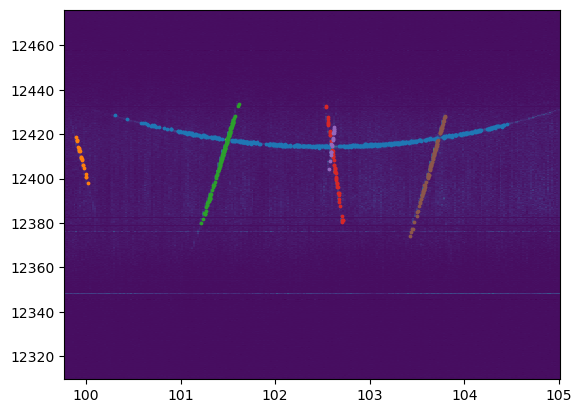

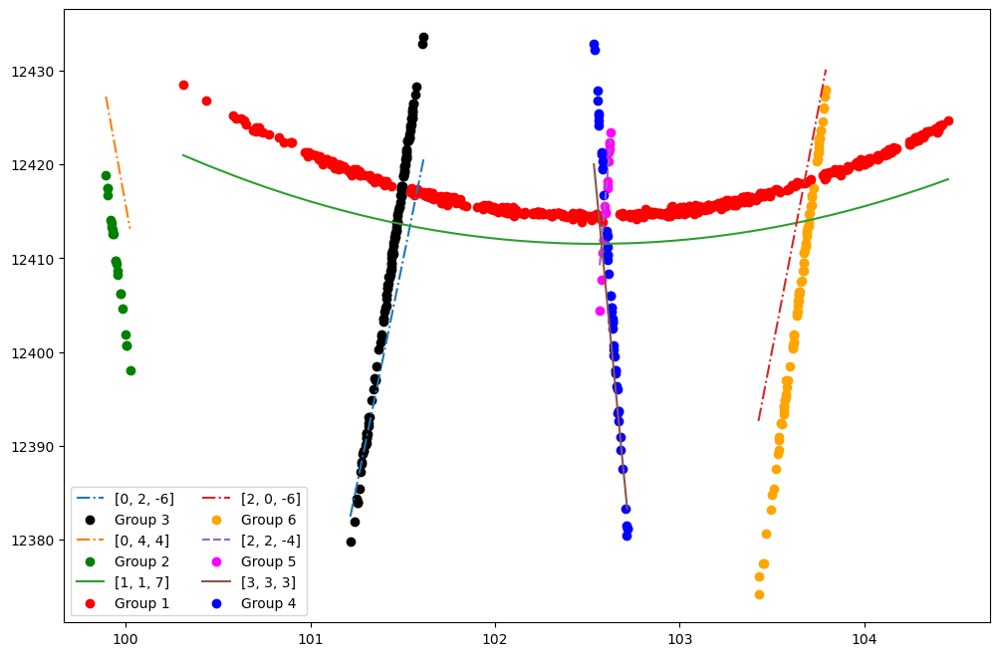

In [45]:
group_colors = ['red', 'green', 'black', 'blue', 'magenta','orange','cyan','yellow','violet','purple','gold','beige','aquamarine','wheat']  # Different colors for different groups
group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7','Group 8','Group 9','Group 10','Group 11','Group 12','Group 13','Group 14']
selected_points_by_group = {label: [] for label in group_labels}
selected_points_by_group["Group 1"] = np.unique([36, 42, 44, 48, 50, 52, 53, 56, 58, 60, 62, 64, 66, 68, 71, 74, 76, 78, 79, 82, 88, 91, 94, 96, 98, 102, 103, 105, 107, 108, 109, 110, 111, 112, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 131, 132, 133, 136, 137, 139, 140, 141, 142, 143, 144, 146, 147, 148, 149, 154, 155, 157, 158, 165, 178, 179, 180, 184, 185, 188, 191, 192, 193, 195, 198, 200, 201, 202, 206, 207, 209, 211, 195, 198, 200, 201, 202, 206, 207, 209, 211, 227, 296, 301, 310, 314, 317, 318, 319, 323, 325, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 394, 395, 396, 398, 399, 400, 401, 402, 403, 404, 405, 406, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 438, 439, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 482, 483, 484, 485, 486, 489, 490, 491, 492, 493, 494, 496, 497, 499, 500, 503, 504, 505, 506, 508, 510, 512, 514, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 493, 494, 496, 497, 499, 500, 501, 503, 504, 505, 506, 508, 510, 512, 503, 504, 505, 506, 508, 510, 512, 514, 515, 517, 522, 523, 524, 525, 526, 527, 510, 512, 514, 515, 517, 522, 523, 524, 525, 526, 527, 535, 536, 543, 605, 608, 610, 616, 617, 618, 619, 620, 621, 622, 623, 625, 626, 627, 628, 629, 630, 631, 632, 633, 635, 636, 637, 638, 640, 641, 642, 643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 655, 656, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 673, 675, 676, 677, 678, 679, 681, 682, 683, 684, 685, 686, 687, 688, 689, 691, 692, 693, 695, 696, 697, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 718, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 738, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 774, 775, 776, 777, 778, 780, 781, 783, 784, 786, 787, 788, 789, 792, 793, 795, 797, 798, 800, 803, 804, 806, 808, 812, 826, 828, 830, 831, 834, 843, 844, 845, 848, 857, 866, 843, 844, 845, 848, 857, 866, 844, 845, 848, 857, 866, 877, 848, 857, 866, 877, 857, 866, 877, 881, 882, 911, 912, 913, 917, 918, 920, 921, 924, 926, 927, 928, 929, 930, 931, 932, 933, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 941, 942, 943, 944, 945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 953, 954, 955, 956, 957, 959, 960, 961, 962, 963, 964, 965, 966, 968, 966, 968, 969, 970, 971, 972, 973, 974, 975, 977, 978, 979, 972, 973, 974, 975, 977, 978, 979, 982, 983, 984, 985, 986, 987, 989, 990, 974, 975, 977, 978, 979, 982, 983, 984, 985, 986, 987, 989, 990, 991, 992, 993, 1002, 1003, 1004, 1005, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1015, 1016, 1017, 1019, 1020, 1021, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1028, 1034, 1035, 1036, 1034, 1035, 1036, 1037, 1027, 1028, 1029, 1030, 1031, 1033]).tolist()
selected_points_by_group["Group 2"] = np.unique([1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25]).tolist()
selected_points_by_group["Group 3"] = np.unique([138, 145, 150, 151, 152, 153, 156, 159, 160, 161, 162, 163, 164, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 181, 182, 183, 186, 187, 190, 194, 196, 197, 199, 203, 204, 205, 208, 210, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 254, 257, 258, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 283, 284, 285, 286, 287, 288, 289, 291, 292, 293, 294, 295, 297, 298, 299, 300, 302, 303, 304, 305, 306, 307, 308, 309, 311, 312, 315, 316, 324, 326, 246, 248, 249, 250, 251, 254, 257, 258, 259, 251, 254, 257, 258, 259, 260, 261, 262, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268]).tolist()
selected_points_by_group["Group 4"] = np.unique([518, 520, 528, 529, 530, 531, 532, 533, 537, 538, 540, 612, 613, 614, 615, 611, 609, 606, 607, 600, 602, 603, 604, 596, 597, 598, 599, 601, 590, 591, 592, 593, 582, 583, 584, 585, 586, 575, 577, 578, 580, 581, 575, 577, 569, 561, 563, 564, 566, 540, 541, 542, 546, 555, 556, 558]).tolist()
selected_points_by_group["Group 5"] = np.unique([571, 572, 573, 572, 573, 574, 567, 568, 567, 568, 570, 571, 572, 573, 559, 560, 562, 539, 534, 544, 547, 548, 550, 552, 553, 547, 548, 549]).tolist()
selected_points_by_group["Group 6"] = np.unique([858, 859, 860, 861, 794, 782, 785, 790, 791, 794, 799, 801, 802, 805, 807, 809, 810, 811, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 827, 829, 832, 835, 836, 837, 838, 839, 840, 841, 842, 846, 847, 849, 850, 851, 852, 853, 854, 855, 856, 858, 859, 860, 861, 862, 863, 864, 865, 867, 868, 869, 870, 871, 872, 873, 874, 875, 876, 878, 879, 880, 883, 884, 813, 814, 815, 816, 818, 919, 922, 923, 914, 915, 919, 922, 910, 914, 915, 905, 906, 907, 908, 909, 910, 896, 898, 899, 900, 901, 902, 904, 905, 906, 907, 879, 880, 883, 884, 885, 883, 884, 885, 886, 885, 886, 887, 891]).tolist()


pitches_H = []
E_H = []
plt.figure()
plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')

for lidx, points in enumerate(selected_points_by_group.values()):
    if len(points)>0:
        pitches_H.append(pitches[points].squeeze())
        E_H.append(Eph_seed[points].squeeze())
        print(lidx,':',points)
        # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
        plt.scatter(pitches_H[lidx],E_H[lidx],s=3)
plt.show()

HtoMeas = [2,1,None,0,None,5,4,None,None,None,None,3,None,None]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

In [46]:
HtoMeas = [2,1,None,0,None,5,4,None,None,None,None,3,None]


In [47]:
len(E_H)



6

In [48]:
ncur = len(pitch_acc)
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]


## scan #18 (80°)

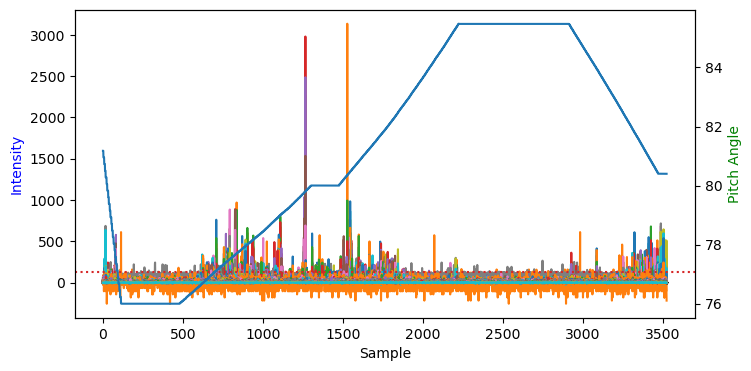

Monochromator 2 image found; 
Machine status file found: roll angle=0.4 deg 

['[0, 2, 6]', '[0, 4, -4]', '[1, -3, -5]', '[1, -3, -3]', '[1, -3, 5]', '[1, -1, -7]', '[1, 1, -7]', '[1, 3, -1]', '[1, 3, 3]', '[1, 3, 5]', '[2, 0, 6]', '[2, 2, 4]', '[3, -1, 3]', '[3, -1, 5]', '[3, 1, -1]', '[3, 1, 3]', '[3, 3, -5]', '[3, 3, -3]', '[4, 0, -4]']


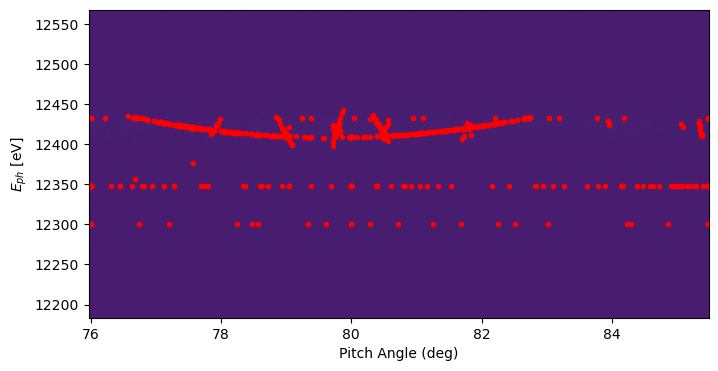

In [71]:
fidx = 18
tt = np.load(datafiles[fidx-1], allow_pickle=True)


fig, ax1 = plt.subplots(figsize=(8,4))
ax2 = ax1.twinx()


thresh = tt['spec_hist'].max()/25

doocs_scale = tt['doocs_scale']
if len(doocs_scale) != len(orig_image):
    np_doocs=doocs_scale[:-1]
else:
    np_doocs=doocs_scale
#thresh = tt['spec_hist'].max()/6
ax1.plot(tt['spec_hist'])
ax1.axhline(thresh,ls=":",color='tab:red')
ax2.plot(tt['doocs_vals_hist'])

ax1.set_xlabel('Sample')
ax2.set_ylabel('Pitch Angle', color='g')
ax1.set_ylabel('Intensity', color='b')
#plt.xlim(16300, 16700)
plt.show()
filter_arr = []
seeding_energy = []
en = 0

x = tt['phen_scale']

pcentral = np.argmin(np.abs(x-Ecentral_orig))

x = dEdP_orig*np.arange(-pcentral,-pcentral+tt['phen_scale'].size) + Ecentral_orig
np_phen = x
for spectrum in tt['spec_hist']:

    if np.max(spectrum) > thresh: ## Adjust this number to adjust threshold 
        filter_arr.append(True)
        seeding_energy.append(x[np.argmax(spectrum)]+en)
    else:
        filter_arr.append(False)


pitch = tt['doocs_vals_hist'][filter_arr]
seeding_energy_dict[str(fidx)] = seeding_energy
pitch_dict[str(fidx)] = pitch
pitches = pitch
Eph_seed = np.array(seeding_energy_dict[str(fidx)])#np.array(seeding_energy_dict
try:
    roll = roll_dict[str(fidx)]
    Hquery = Hquery_dict[str(fidx)]
    
except:
    roll = roll_in_database(datafiles[fidx-1])
    _, _, Hquery = getlocal_Hplanes(hmax, kmax, lmax, dthp, dthy, dthr, alpha, roll,np_phen,np_doocs)
print(Hquery)
# Plot extracted lines
# seeding_energy = seeding_energy_dict[str(fidx)]
# pitch = pitch_dict[str(fidx)]
fig, ax = plt.subplots(figsize=(8,4))

plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')
plt.plot(pitch, seeding_energy, 'r.')
ax.set_xlabel('Pitch Angle (deg)')
ax.set_ylabel(r'$E_{ph}$ [eV]')
plt.show()


0 : [0, 1, 3, 6, 7, 11, 13, 14, 15, 19, 24, 26, 67, 68, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 136, 137, 138, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 152, 153, 154, 157, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 194, 195, 196, 197, 198, 199, 201, 202, 203, 204, 207, 209, 210, 211, 212, 214, 217, 220, 229, 242, 245, 246, 248, 249, 250, 253, 254, 262, 263, 274, 277, 279, 284, 286, 287, 288, 289, 293, 294, 295, 297, 298, 300, 301, 303, 304, 306, 308, 309, 312, 313, 314, 315, 328, 334, 335, 339, 340, 345, 346, 347, 348, 350, 351, 352, 353, 354, 355, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 374, 375, 376, 378, 379, 

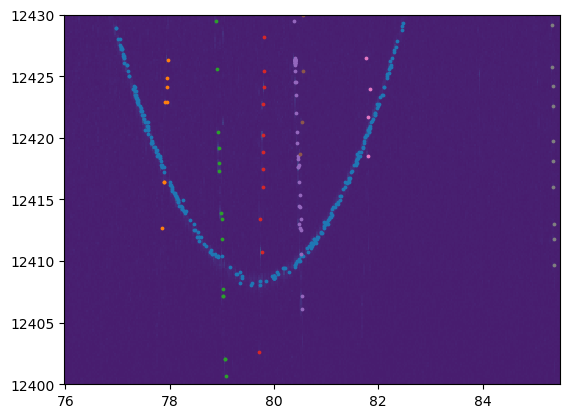

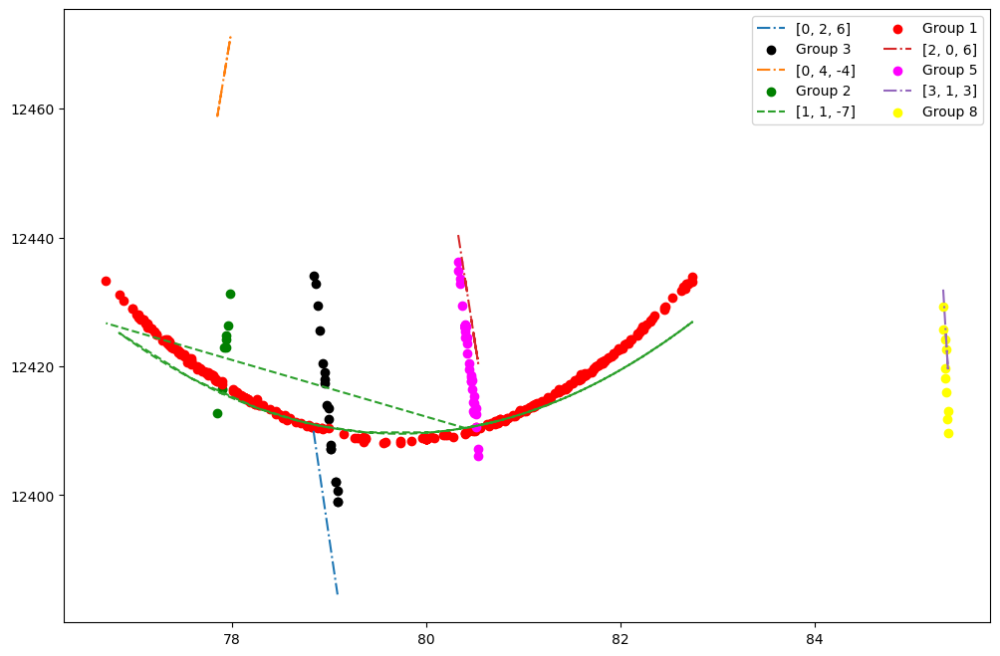

In [74]:
selected_points_by_group['Group 1'] = [0, 1, 3, 6, 7, 11, 13, 14, 15, 19, 24, 26, 67, 68, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 136, 137, 138, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 152, 153, 154, 157, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 194, 195, 196, 197, 198, 199, 201, 202, 203, 204, 207, 209, 210, 211, 212, 214, 217, 220, 229, 242, 245, 246, 248, 249, 250, 253, 254, 262, 263, 274, 277, 279, 284, 286, 287, 288, 289, 293, 294, 295, 297, 298, 300, 301, 303, 304, 306, 308, 309, 312, 313, 314, 315, 328, 334, 335, 339, 340, 345, 346, 347, 348, 350, 351, 352, 353, 354, 355, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 374, 375, 376, 378, 379, 380, 381, 382, 384, 385, 387, 388, 391, 392, 393, 395, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 409, 410, 411, 412, 414, 415, 416, 417, 418, 419, 420, 422, 423, 424, 425, 426, 427, 515, 516, 517, 518, 519, 521, 522, 523, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 536, 537, 538, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 559, 560, 561, 562, 563, 565, 567, 569, 570, 571, 572, 573, 576, 577, 579, 580, 581, 582, 585, 593, 597, 615, 627, 57]
selected_points_by_group['Group 2'] = [158, 159, 160, 161, 162, 163, 151, 155, 156]
selected_points_by_group['Group 3'] = [213, 215, 216, 218, 221, 222, 223, 224, 226, 227, 228, 230, 231, 232, 237, 238, 239, 240, 241]
selected_points_by_group['Group 4'] = [273, 272, 271, 270, 269, 268, 267, 266, 265, 261, 264, 260]
selected_points_by_group['Group 5'] = [318, 317, 320, 319, 321, 324, 325, 596, 598, 602, 604, 606, 607, 609, 610, 611, 618, 621, 628, 599, 600, 601, 603, 605, 612, 613, 614, 616, 617, 619, 620, 622, 623, 624, 625, 626, 629, 630, 326, 595, 327, 594, 329, 330, 333, 333, 592, 331, 332, 591, 590, 336, 589, 341, 337, 338, 588, 342, 340, 586]
selected_points_by_group['Group 6'] = [343, 344, 587, 4]
selected_points_by_group['Group 7'] = [389, 390, 535, 394]
selected_points_by_group['Group 8'] = [448, 449, 450, 451, 452, 453, 490, 491, 492, 493]
pitches_H = []
E_H = []
plt.figure()
plt.pcolormesh(np_doocs,np_phen ,tt['corr2d'].T,shading='auto')

for lidx, points in enumerate(selected_points_by_group.values()):
    if len(points)>0:
        pitches_H.append(pitches[points].squeeze())
        E_H.append(Eph_seed[points].squeeze())
        print(lidx,':',points)
        # print(lidx,':',pitches_H[lidx],'\n',E_H[lidx])
        plt.scatter(pitches_H[lidx],E_H[lidx],s=3)
plt.ylim(12400,12430)
plt.show()
#HtoMeas = [2,1,None,None,None,None,0,None,None,4,None,None,5,7,None,3,6]
#HtoMeas = [2,1,None,None,None,None,0,None,None,4,None,None,5,None,None,3,6]
HtoMeas = [2,1,None,None,None,None,0,None,None,None,4,None,None,None,None,7,None,None,None]
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery):
    lidx = HtoMeas[Hidx]
    if lidx is not None:
        pitchi = pitches_H[lidx]
        E_Hi = E_H[lidx]
     
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitchi,[roll],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess

        plt.plot(pitchi,EBragg,linestyle=linestyle,label=H)
        if pitchi.size>0:
            ax.scatter(pitchi,E_Hi,color=group_colors[lidx],label=group_labels[lidx])
#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)

In [80]:
ncur = len(pitch_acc)
pitch_acc += pitches_H
roll_acc += [roll]*len(pitches_H)
E_H_acc += E_H
Hquery_acc += [H for H,l in zip(Hquery,HtoMeas) if l is not None]
HtoMeas_acc += [Htol + ncur for Htol in HtoMeas if Htol is not None]
print(Hquery_acc)

['[1, 1, -1]', '[2, 4, 2]', '[4, 2, 2]', '[1, 1, -1]', '[0, 2, -6]', '[0, 4, 4]', '[1, -3, 3]', '[1, 1, 7]', '[2, 0, -6]', '[2, 2, -4]', '[3, -1, -3]', '[3, 3, 3]', '[4, 0, 4]', '[0, 2, -6]', '[0, 4, 4]', '[1, 1, 7]', '[2, 0, -6]', '[2, 2, -4]', '[3, 3, 3]', '[0, 2, 6]', '[0, 4, -4]', '[1, 1, -7]', '[2, 0, 6]', '[3, 1, 3]']


In [81]:
print(Hquery_acc)
print(HtoMeas_acc)

['[1, 1, -1]', '[2, 4, 2]', '[4, 2, 2]', '[1, 1, -1]', '[0, 2, -6]', '[0, 4, 4]', '[1, -3, 3]', '[1, 1, 7]', '[2, 0, -6]', '[2, 2, -4]', '[3, -1, -3]', '[3, 3, 3]', '[4, 0, 4]', '[0, 2, -6]', '[0, 4, 4]', '[1, 1, 7]', '[2, 0, -6]', '[2, 2, -4]', '[3, 3, 3]', '[0, 2, 6]', '[0, 4, -4]', '[1, 1, -7]', '[2, 0, 6]', '[3, 1, 3]']
[2, 0, 1, 3, 7, 6, 8, 4, 11, 10, 13, 9, 12, 16, 15, 14, 19, 18, 17, 22, 21, 20, 24, 27]


In [ ]:
print(Hquery_acc)

In [84]:
HtoMeas_acc = [2, 0, 1, 3, 7, 6, 8, 4, 11, 10, 13, 9, 12, 16, 15, 14, 19, 18, 17]#, 22, 21, 20, 24, 27]
Hquery_acc =['[1, 1, -1]', '[2, 4, 2]', '[4, 2, 2]', '[1, 1, -1]', '[0, 2, -6]', '[0, 4, 4]', '[1, -3, 3]', '[1, 1, 7]', '[2, 0, -6]', '[2, 2, -4]', '[3, -1, -3]', '[3, 3, 3]', '[4, 0, 4]', '[0, 2, -6]', '[0, 4, 4]', '[1, 1, 7]', '[2, 0, -6]', '[2, 2, -4]', '[3, 3, 3]']#, '[0, 2, 6]', '[0, 4, -4]', '[1, 1, -7]', '[2, 0, 6]', '[3, 1, 3]']
#,
#  '[0, 2, 6]',
#  '[0, 4, -4]',
#  '[1, 1, -7]',
#  '[2, 0, 6]',
#  '[3, 3, -3]',]

## plot lines together

(12115.546, 12675.71775)

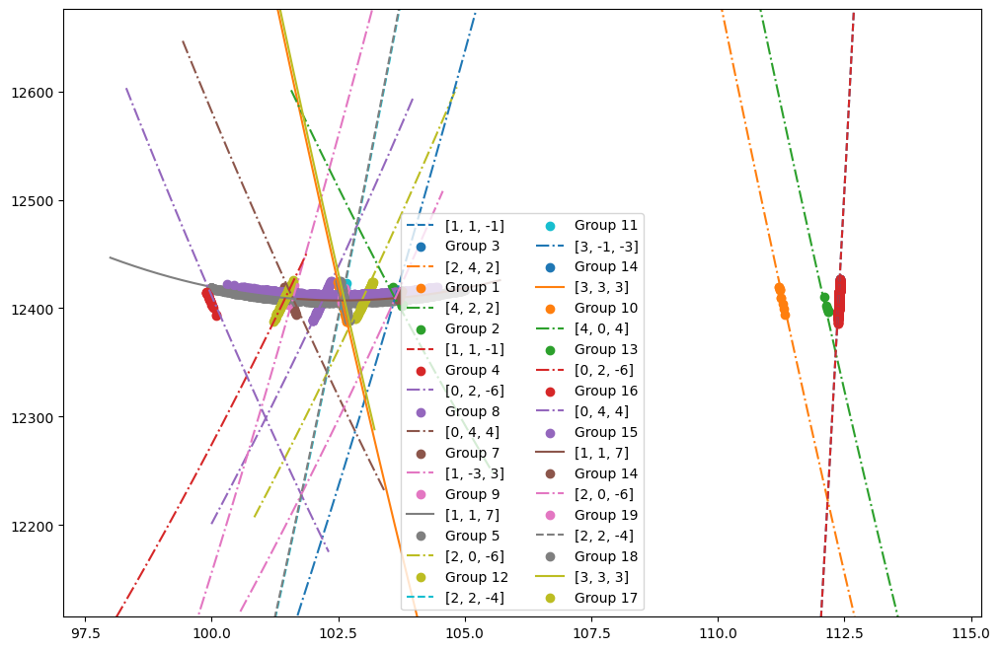

In [71]:
# dPconv, dRconv, dYconv, dRPconv, Ecorrconv =  [2.41322609e+00, -5.00000000e+00, -9.33453740e+00, -9.44353028e-03,  4.65311758e+01]
# dPconv, dRconv, dYconv, dRPconv, Ecorrconv = [1.15235012e+00,  6.04787206e-02,  9.34291663e-01, -1.39320701e-02, -1.63462257e+01]
#dP,dR,dY,Ecorr = res.x

# dPconv, dRconv, dYconv, dRPconv, Ecorrconv=[0.55665728, -1.54318923, -2.18807843,  0.02009495,  1.04564738]
#[ 1.4,  -2.3 ,0.2, 0, -1.63462257e+01]
#pitch_list = np.linspace(min(pitches),max(pitches),1000) 
#RollQuery = np.deg2rad(np.linspace(-3,3,9))
# phen_list, p_angle_list, gid_list, linestyle_list, color_list = Bragg_plotter_limit(5, 5, 5, dPconv, dRconv, dYconv, dRPconv, roll, pitch_list)
fig, ax = plt.subplots(figsize=(12,8))
#ax.scatter(pitches,seeding_energy,color='red')

for Hidx, H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    pitchi = pitch_acc[lidx]
    if pitchi.size>0:
        pitch_list = np.linspace(min(pitchi),min(pitchi),1000) 
        EBragg,linestyle = HXRSS_singleLine(json.loads(H),pitch_list,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
        EBragg = np.array(EBragg) + Ecorrguess
        plt.plot(pitch_list,EBragg,linestyle=linestyle,label=H)
        ax.scatter(pitchi,E_H_acc[lidx],label=f'Group {lidx+1}')


#plt.scatter(pitches,Eph_seed,color='red',s=1)
plt.legend(ncols=2)
plt.ylim(min(Eph_seed)-250,max(Eph_seed)+250)





In [140]:
HtoMeas_acc

[2, 0, 1, 3, 7, 6, 8, 4, 11, 10, 13, 9, 12, 15, 14, 13, 18, 17, 16]

In [139]:
for Hidx, H in enumerate(Hquery_acc):
        lidx = HtoMeas_acc[Hidx]
        if lidx is not None:
            peval = np.array(pitch_acc[lidx])
            print(Hidx,lidx)
            #print()

0 2
1 0
2 1
3 3
4 7
5 6
6 8
7 4
8 11
9 10
10 13
11 9
12 12
13 15
14 14
15 13
16 18
17 17
18 16


## do the fit

In [ ]:

#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0

    for Hidx, H in enumerate(Hquery_acc):
        lidx = HtoMeas_acc[Hidx]
        if lidx is not None:
            peval = np.array(pitch_acc[lidx])
            #if peval.size>0 :
            EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dP,dR,dY,dPR)
            EBraggs = np.array(EBraggs) +Ecorr
            cost += np.sum((EBraggs-E_H_acc[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        #plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr = intermediate_result.x
        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery_acc):
            lidx = HtoMeas_acc[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitch_acc[lidx]
                # if peval.size>0:
                EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dP,dR,dY,dPR)
                EBragg = np.array(EBragg) +Ecorr

                #print(peval_sub.min(),peval_sub.max())
                plt.scatter(peval,E_H_acc[lidx],marker='x')
                plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
x0 = np.array([dPguess, dRguess, dYguess, dRPguess, Ecorrguess])
# x0 = np.array([0, -2, 0, 0, Ecorrguess])
bounds = ([-2,2],[-3,3],[-3,3],[-2,2],[-10,10])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRP_conv,Ecorr_conv = res.x

# plot individual lines
nlines = len(pitch_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(4)))
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(H)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg) +Ecorrconv
            EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
            EBragg_guess = np.array(EBragg_guess) +Ecorrguess

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_acc[lidx],marker='x')
            ax.plot(peval,EBragg)
            #ax.plot(peval,EBragg_guess)

In [189]:
dPconv,dRconv,dYconv,dRPconv,Ecorrconv = [ 1.15494184,  0.62137606, -0.82495297,  0.01639762, -7.38734911]


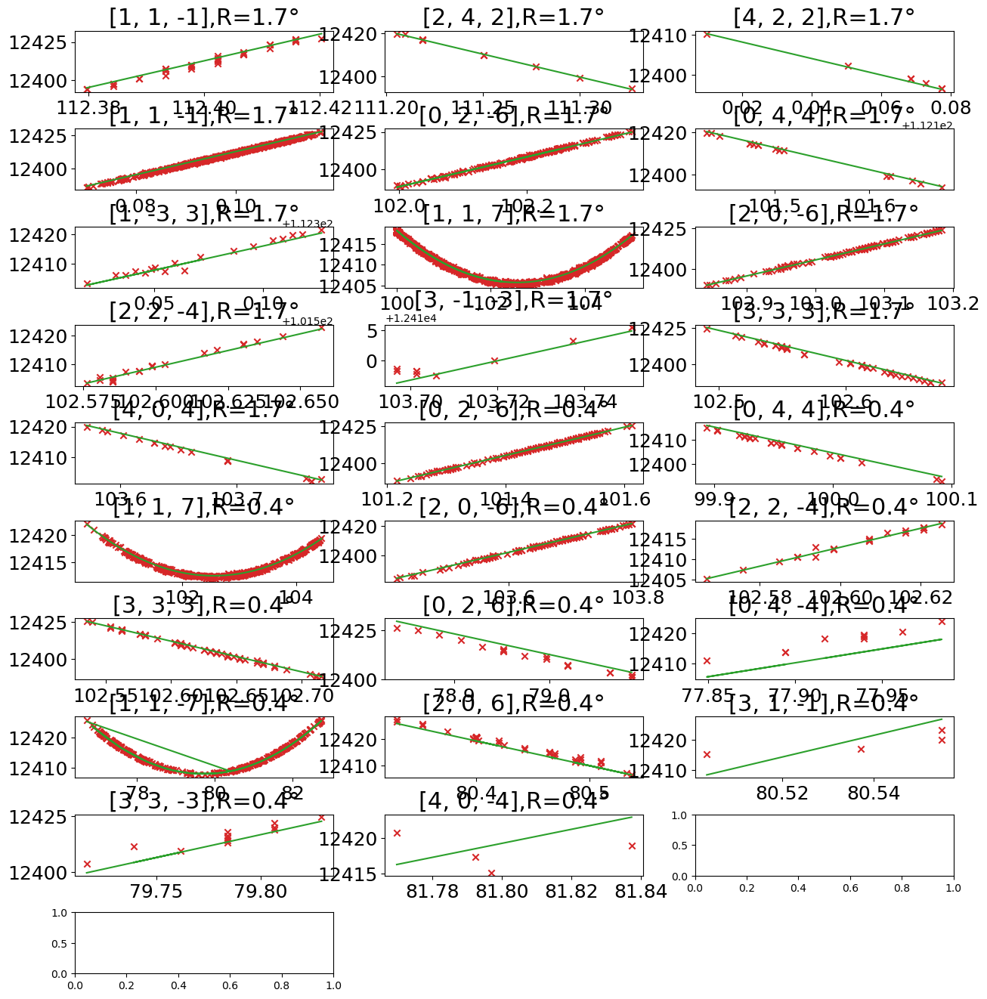

In [195]:
nlines = len(pitch_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

withGuess = False
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(5)+(ncols-1)*0.6),gridspec_kw={'hspace':0.6})

for i in range(nlines,axs.size):
    axs.flatten()[i].set_visible(False)
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(f"{H},R={roll_acc[lidx]:.1f}°",fontsize=22)
    ax.tick_params(labelsize=18)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg) +Ecorrconv
            

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_acc[lidx],marker='x',color='tab:red')
            ax.plot(peval,EBragg,color='tab:green')
            if withGuess:
                EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
                EBragg_guess = np.array(EBragg_guess) +Ecorrguess
                ax.plot(peval,EBragg_guess)

In [17]:
HtoMeas_acc

[]

## do the fit including the HIREX dispersion as free parameter

1
[ 1.16608634 -0.30329348 -0.04451585  0.02686069 -7.44802075  0.105     ] 1.0960820304212162


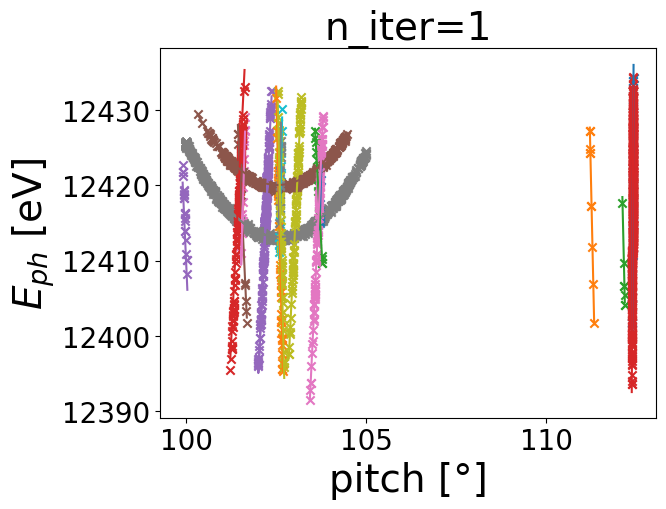

51
[ 1.16527493 -0.30451916 -0.04422105  0.02687411 -7.43866802  0.10490376] 1.0650041056819832


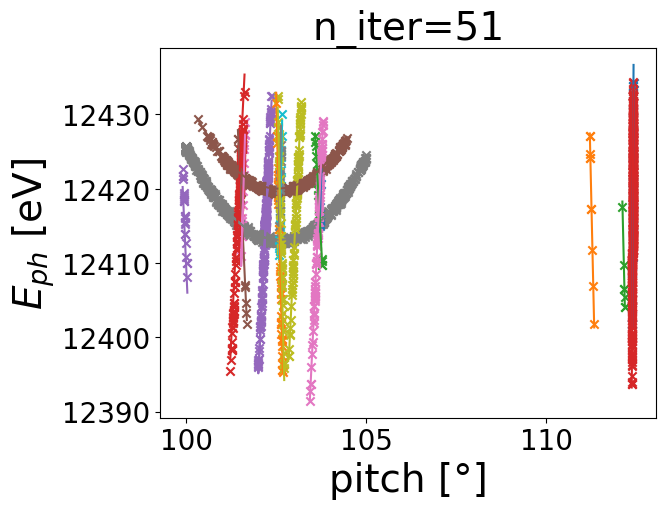

101
[ 1.16322275 -0.24078401 -0.14578092  0.02625352 -7.41634667  0.10436246] 0.9630088063731808


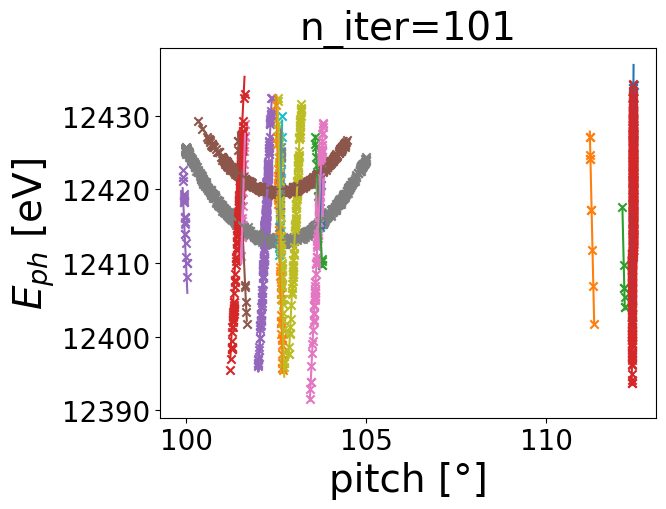

151
[ 1.16245557 -0.20789468 -0.19589259  0.0259464  -7.32180524  0.10574653] 0.9182831119671472


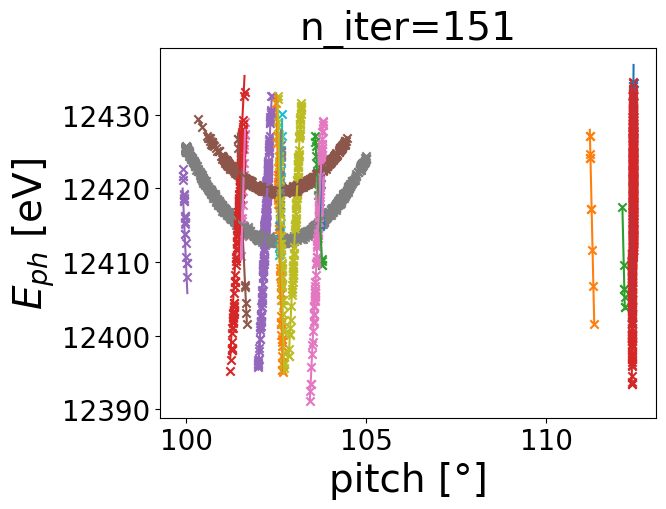

201
[ 1.16274658 -0.22814478 -0.18417709  0.02614012 -7.40095055  0.10499625] 0.8956549815027975


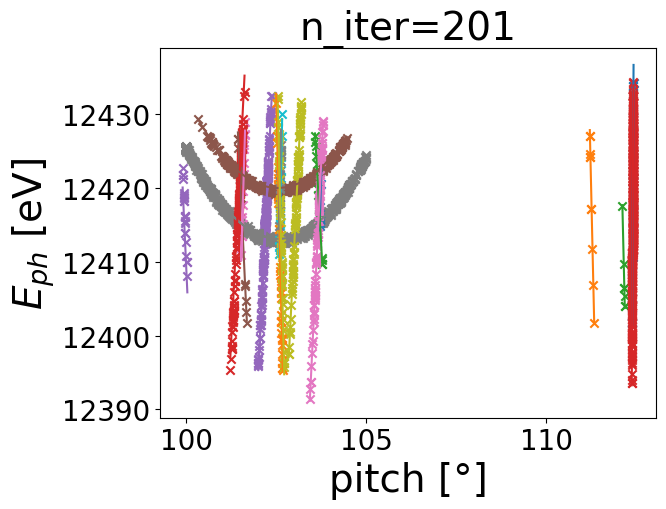

251
[ 1.15674595 -0.28361678 -0.51014772  0.02668817 -7.31643239  0.10449159] 0.49192110614207796


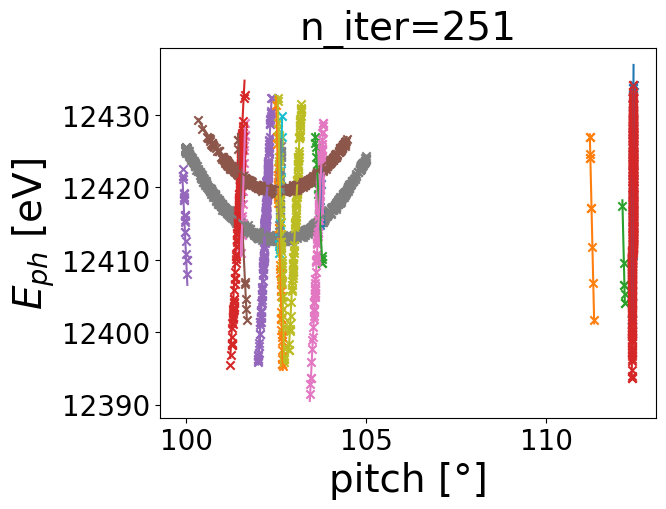

301
[ 1.1533809  -0.29015405 -0.68942653  0.02674405 -7.38244167  0.10577578] 0.4249109028052024


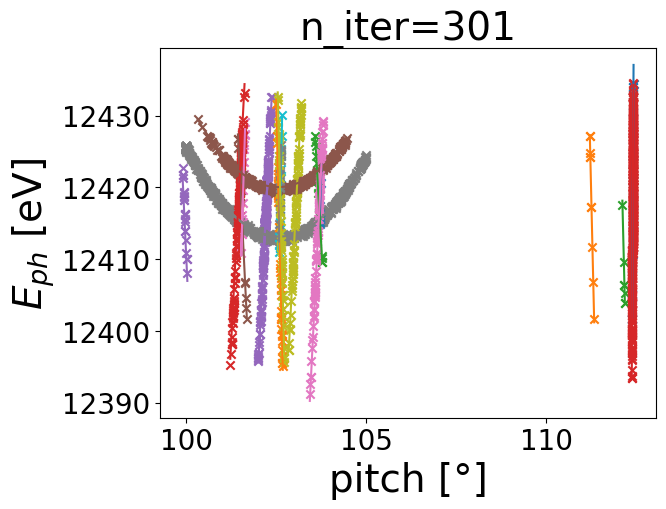

351
[ 1.15350113 -0.30365499 -0.68690275  0.02687237 -7.40024549  0.1043986 ] 0.41458580426888775


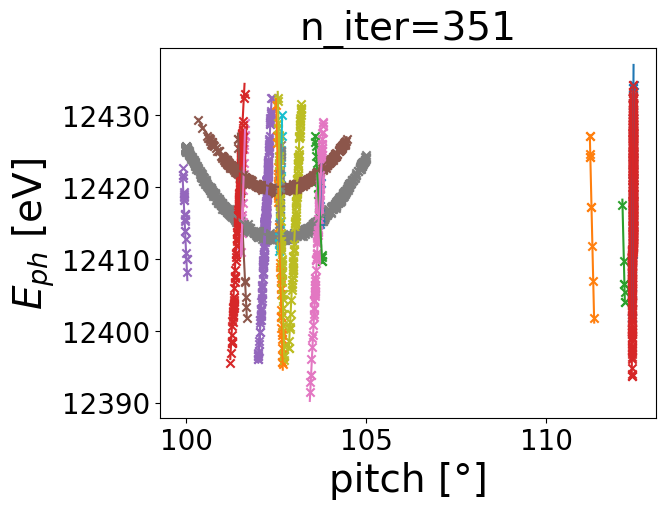

401
[ 1.15320302 -0.30458307 -0.70065102  0.02688281 -7.43056882  0.10392043] 0.41265224961871033


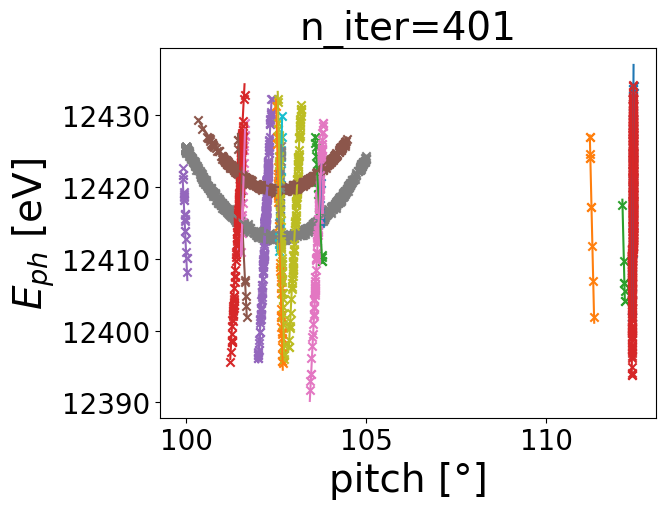

451
[ 1.15319197 -0.30491329 -0.70169225  0.02688589 -7.43057957  0.10388734] 0.412642829818404


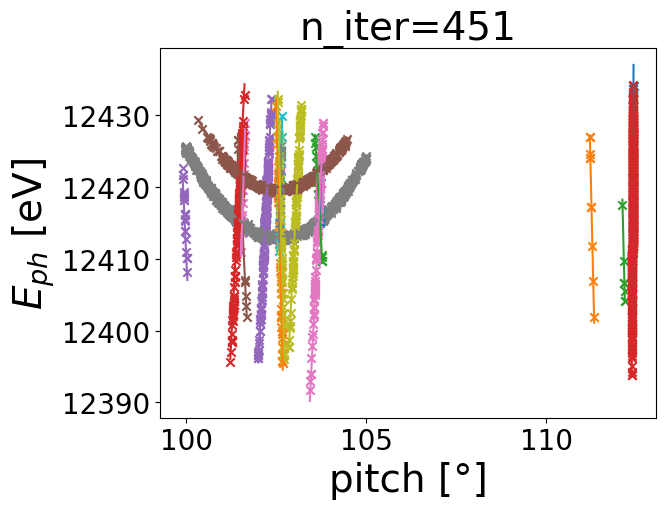

501
[ 1.15319181 -0.3049172  -0.70169132  0.02688593 -7.43057324  0.10388784] 0.41264282741337827


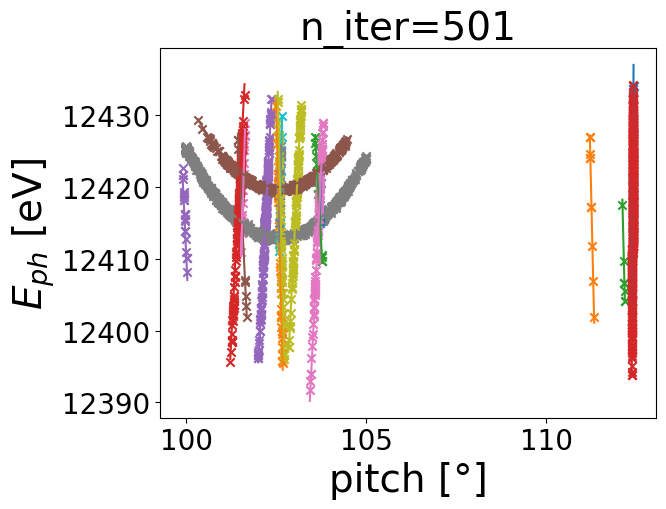

551
[ 1.15319176 -0.30491719 -0.7016933   0.02688593 -7.43057114  0.10388786] 0.4126428273979003


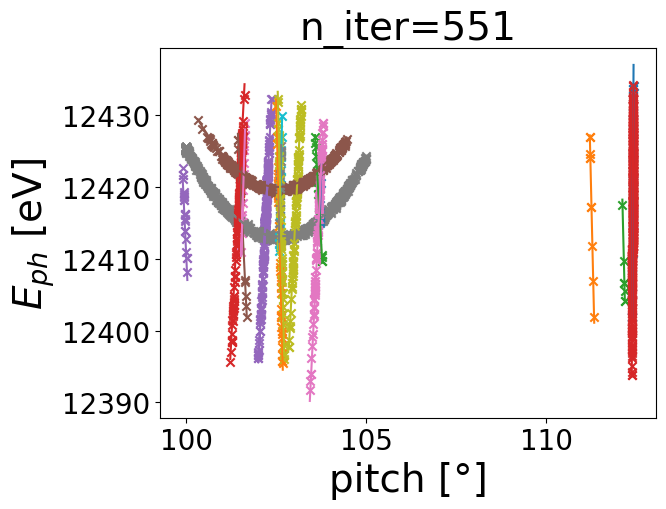

601
[ 1.15319177 -0.30491716 -0.70169314  0.02688593 -7.43057114  0.10388786] 0.41264282739770697


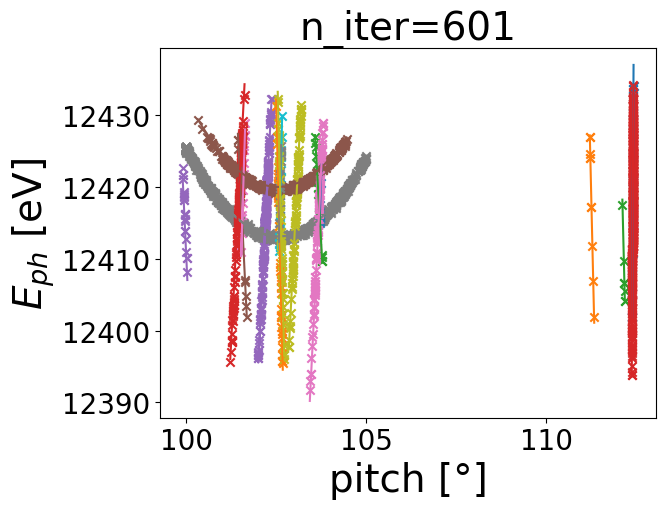

Optimization terminated successfully.
         Current function value: 0.412643
         Iterations: 647
         Function evaluations: 1195
648
[ 1.15319177 -0.30491716 -0.70169314  0.02688593 -7.43057114  0.10388786] 0.4126428273975601


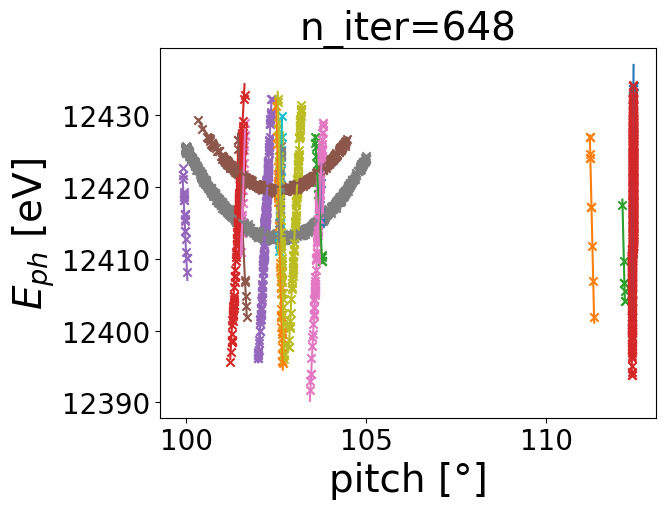

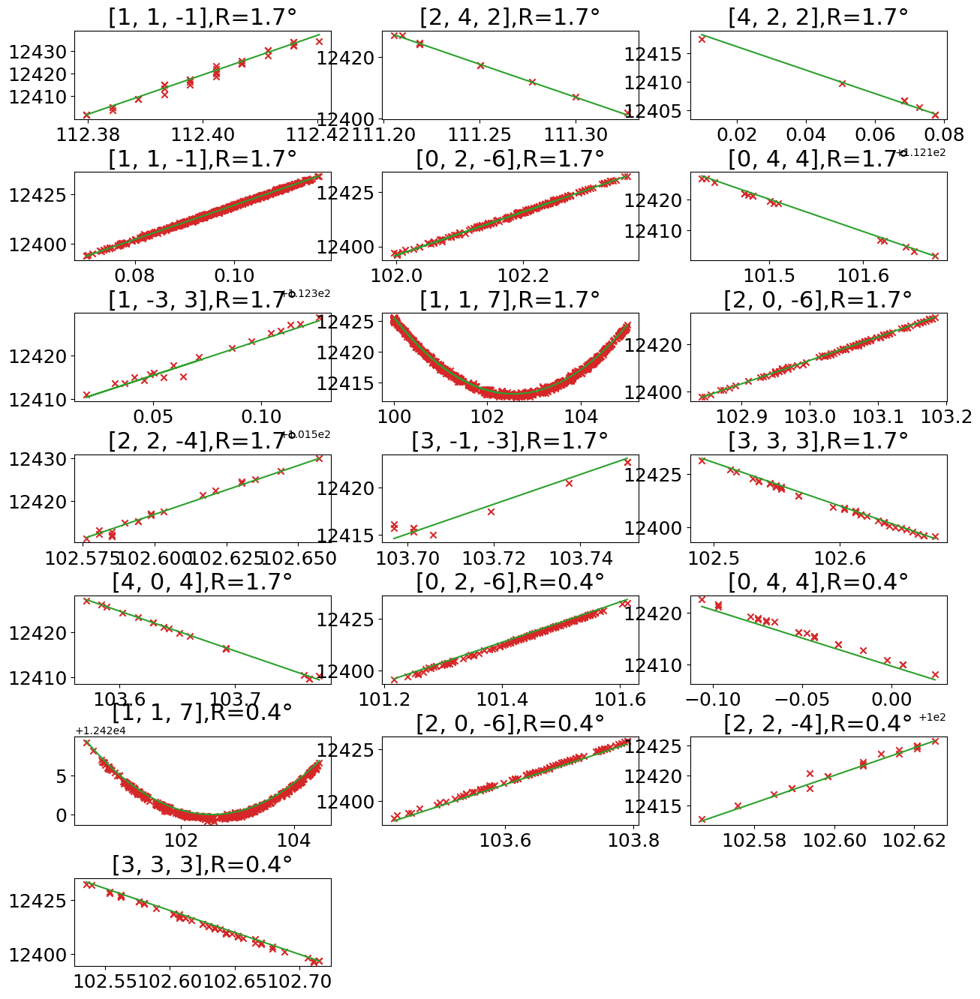

In [85]:
Ecentral_orig = 12407
dEdP_orig = 0.15
#do the actual fit
def optFuncp_wdPR(dP,dR,dY,dPR,Ecorr,disp_HIREX):
    #peval = np.linspace(pitches.min(),pitches.max(),3001)
    cost = 0
    E_loc =  [(E_H-Ecentral_orig)*disp_HIREX/dEdP_orig + Ecentral_orig-Ecorr for E_H in E_H_acc]
    for Hidx, H in enumerate(Hquery_acc):
        lidx = HtoMeas_acc[Hidx]
        if lidx is not None:
            peval = np.array(pitch_acc[lidx])
            #if peval.size>0 :
            EBraggs,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dP,dR,dY,dPR)
            EBraggs = np.array(EBraggs)
            cost += np.sum((EBraggs-E_loc[lidx])**2)/peval.size**2
    return 1/cost
  
def optFunc_minimizer(x):
    #return 1/optFuncp(x[0],x[1],x[2],0)
    return 1/optFuncp_wdPR(x[0],x[1],x[2],x[3],x[4],x[5])
def display_Func(intermediate_result):
    global forcePlot
    global niter
    niter += 1
    if(niter%50 == 1 or forcePlot):
        print(niter)
        print(intermediate_result.x,intermediate_result.fun)
        plt.title("n_iter="+str(niter),fontsize=28)
        #plt.scatter(pitches,Eph_seed,color='red',s=1)
        plt.ylabel("$E_{ph}$ [eV]",fontsize=28)
        plt.xlabel("pitch [°]", fontsize=28)
        plt.tick_params(labelsize=20)
        dP,dR,dY,dPR,Ecorr,disp_HIREX = intermediate_result.x
        E_loc =  [(E_H-Ecentral_orig)*disp_HIREX/dEdP_orig + Ecentral_orig - Ecorr for E_H in E_H_acc]

        #dP,dR,dY = intermediate_result.x
        for Hidx, H in enumerate(Hquery_acc):
            lidx = HtoMeas_acc[Hidx]
            #print(lidx)
            #P0 = P0s[lidx]
            if lidx is not None:
                peval = pitch_acc[lidx]
                # if peval.size>0:
                EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dP,dR,dY,dPR)
                EBragg = np.array(EBragg)

                #print(peval_sub.min(),peval_sub.max())
                plt.scatter(peval,E_loc[lidx],marker='x')
                plt.plot(peval,EBragg)
            #plt.ylim(Eph_seed.min(),Eph_seed.max())
        plt.show()

niter = 0
forcePlot = False
# x0 = [1.15497246, 0.61820617, -0.82300946,  0.01643269, -7.39200109, 0.10563662]
#x0 = np.array([dPguess, dRguess, dYguess, dRPguess, Ecorrguess,0.15])
x0 = np.array([ 1.15497246, 0, 0,  0, -5.83095293e+00,0.10563662])
x0 = np.array([1.16608634, -0.30329348, -0.04239605,  0.02686069, -7.44802075,  0.105])
bounds = ([-2,2],[-3,3],[-3,3],[-2,2],[-20,20],[0.103,0.106])
res = opt.minimize(optFunc_minimizer, x0, method='Nelder-Mead',
               options={'xatol': 1e-14,'fatol': 1e-14, 'disp': True,'maxiter':1000},bounds=bounds,callback=display_Func)
forcePlot=True
display_Func(res)
dPconv,dRconv,dYconv,dRPconv,Ecorrconv,disp_HIREX_conv = res.x

nlines = len(Hquery_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

withGuess = False
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(5)+(ncols-1)*0.6),gridspec_kw={'hspace':0.6})

E_H_corr = [(E_H-Ecentral_orig)*disp_HIREX_conv/dEdP_orig + Ecentral_orig - Ecorrconv for E_H in E_H_acc]

for i in range(nlines,axs.size):
    axs.flatten()[i].set_visible(False)
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(f"{H},R={roll_acc[lidx]:.1f}°",fontsize=22)
    ax.tick_params(labelsize=18)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg)
            

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_corr[lidx],marker='x',color='tab:red')
            ax.plot(peval,EBragg,color='tab:green')
            if withGuess:
                EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
                EBragg_guess = np.array(EBragg_guess) +Ecorrguess-Ecorrconv
                ax.plot(peval,EBragg_guess)

### mechanics model changing the order of rotation to: first roll, then yaw and then pitch

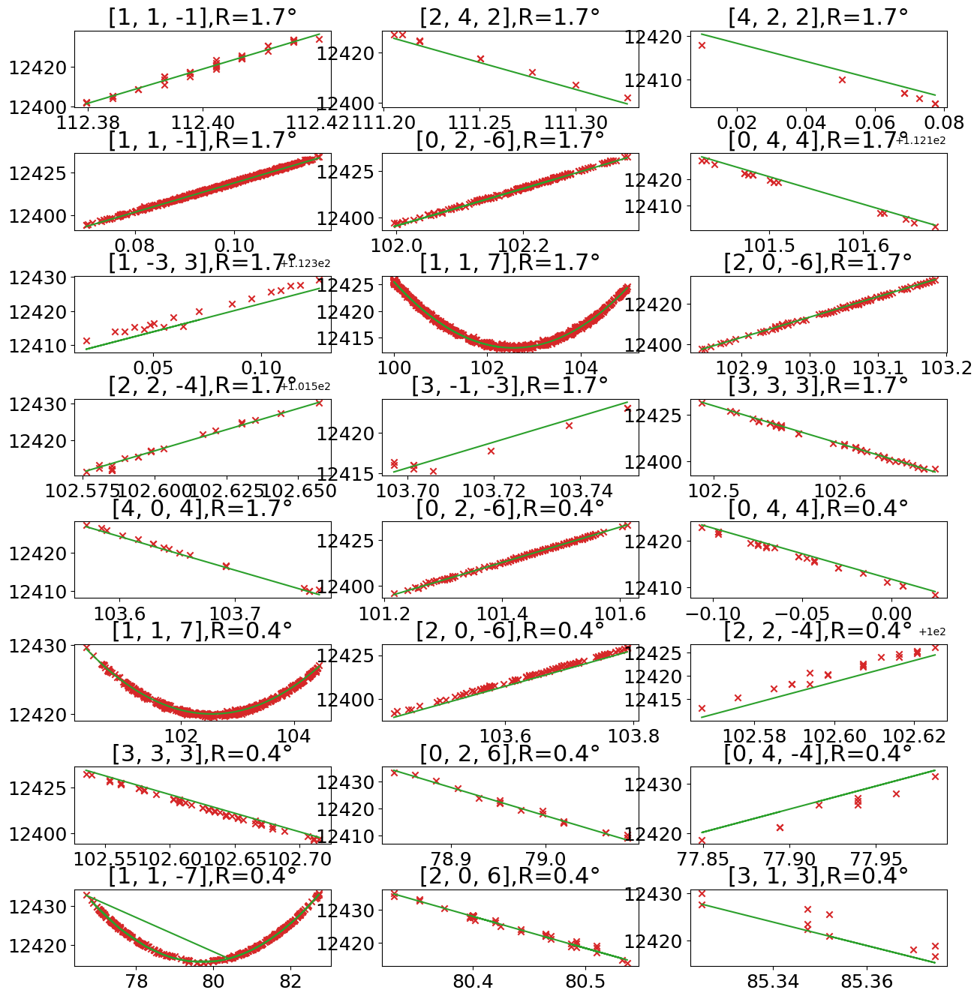

In [83]:
dPguess,dRguess,dYguess,dRPguess,Ecorrguess, disp_HIREX_conv = [1.15319177, -0.3049173, -0.70169413,  0.02688593, -7.4305, 0.10388786]

nlines = len(Hquery_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

withGuess = False
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(5)+(ncols-1)*0.6),gridspec_kw={'hspace':0.6})

E_H_corr = [(E_H-Ecentral_orig)*disp_HIREX_conv/dEdP_orig + Ecentral_orig - Ecorrconv for E_H in E_H_acc]

for i in range(nlines,axs.size):
    axs.flatten()[i].set_visible(False)
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(f"{H},R={roll_acc[lidx]:.1f}°",fontsize=22)
    ax.tick_params(labelsize=18)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg)
            

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_corr[lidx],marker='x',color='tab:red')
            ax.plot(peval,EBragg,color='tab:green')
            if withGuess:
                EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
                EBragg_guess = np.array(EBragg_guess) +Ecorrguess-Ecorrconv
                ax.plot(peval,EBragg_guess)

### mechanics model keeping the axis of rotation

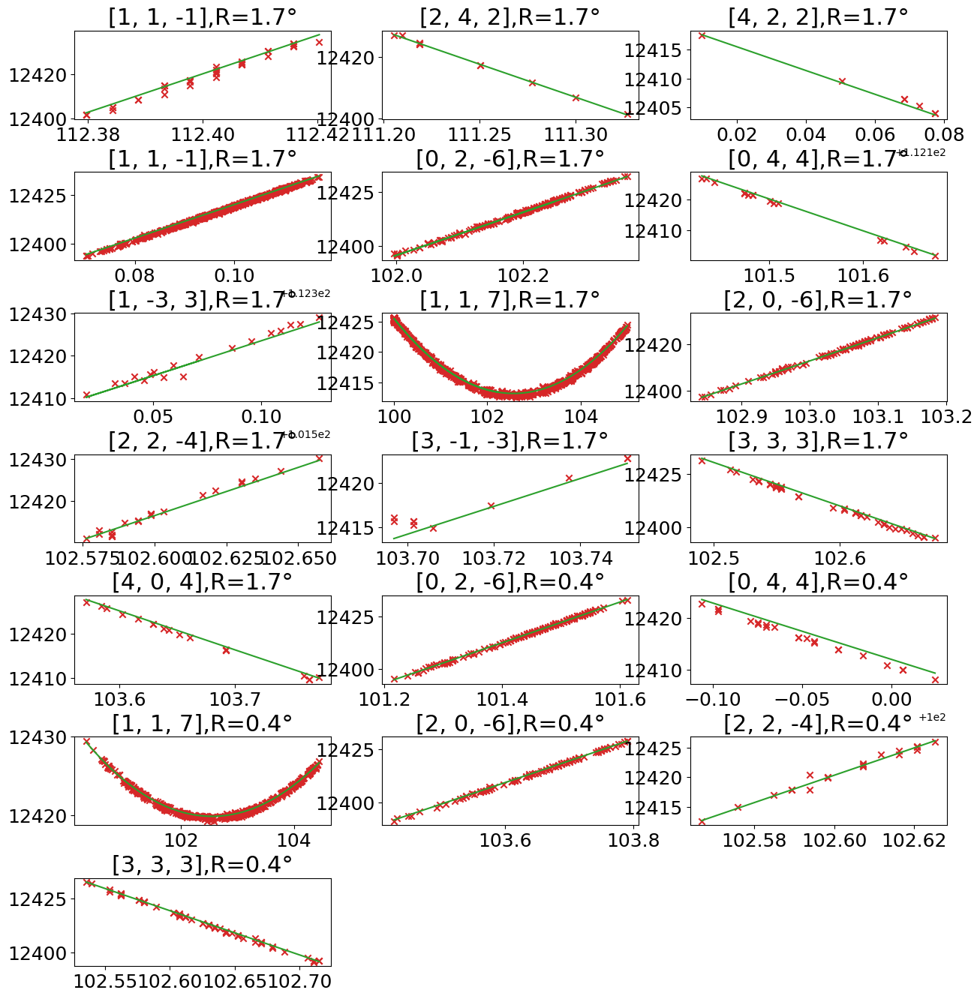

In [89]:
dPconv,dRconv,dYconv,dRPconv,Ecorrconv, disp_HIREX_conv = [1.15497246, 0.61820617, -0.82300946,  0.01643269, -7.39200109, 0.10563662]
nlines = len(Hquery_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

withGuess = False
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(5)+(ncols-1)*0.6),gridspec_kw={'hspace':0.6})

E_H_corr = [(E_H-Ecentral_orig)*disp_HIREX_conv/dEdP_orig + Ecentral_orig - Ecorrconv for E_H in E_H_acc]

for i in range(nlines,axs.size):
    axs.flatten()[i].set_visible(False)
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(f"{H},R={roll_acc[lidx]:.1f}°",fontsize=22)
    ax.tick_params(labelsize=18)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg)
            

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_corr[lidx],marker='x',color='tab:red')
            ax.plot(peval,EBragg,color='tab:green')
            if withGuess:
                EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
                EBragg_guess = np.array(EBragg_guess) +Ecorrguess-Ecorrconv
                ax.plot(peval,EBragg_guess)

### mechanics model with turning the axis of rotation (best fit)

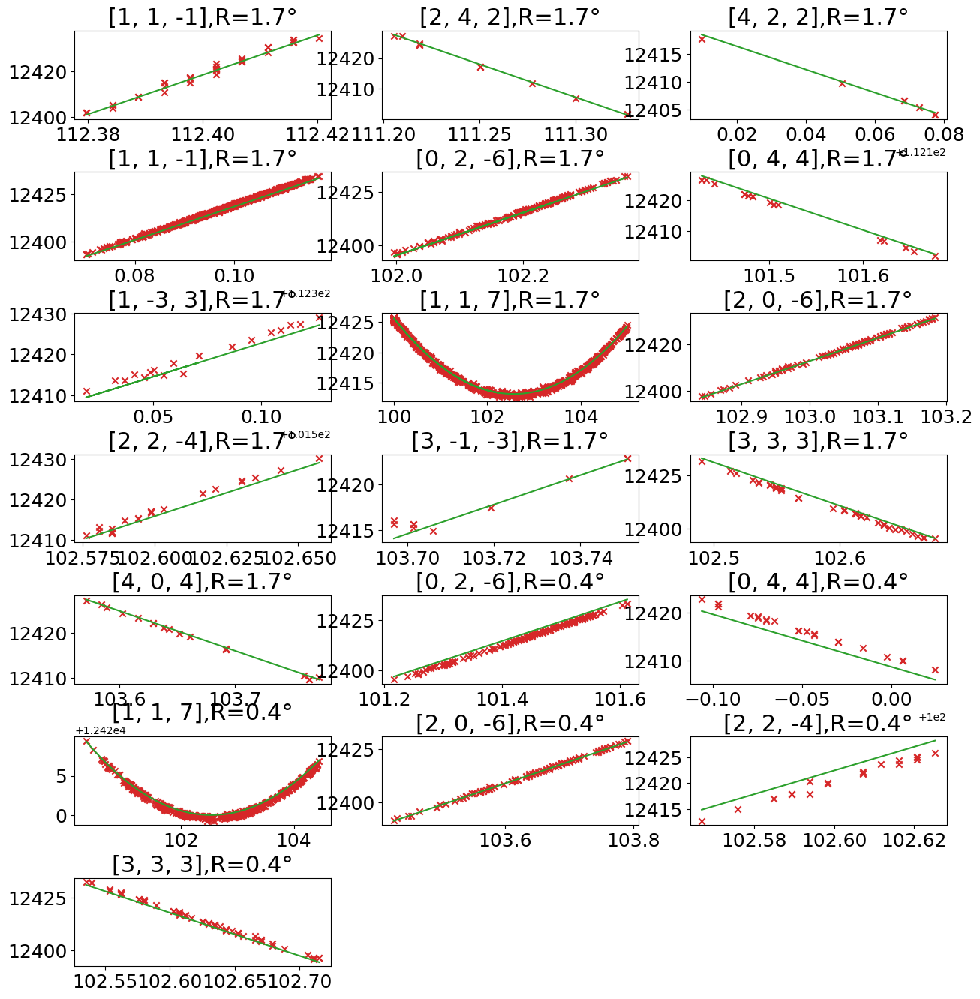

In [78]:
### mechanics model with turning the axis of rotation
dPconv,dRconv,dYconv,dRPconv,Ecorr_conv,disp_HIREX_conv = [1.16608634, -0.30329348, -0.04239605,  0.02686069, -7.44802075,  0.105     ]
nlines = len(Hquery_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

withGuess = False
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(5)+(ncols-1)*0.6),gridspec_kw={'hspace':0.6})

E_H_corr = [(E_H-Ecentral_orig)*disp_HIREX_conv/dEdP_orig + Ecentral_orig - Ecorrconv for E_H in E_H_acc]

for i in range(nlines,axs.size):
    axs.flatten()[i].set_visible(False)
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(f"{H},R={roll_acc[lidx]:.1f}°",fontsize=22)
    ax.tick_params(labelsize=18)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg)
            

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_corr[lidx],marker='x',color='tab:red')
            ax.plot(peval,EBragg,color='tab:green')
            if withGuess:
                EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
                EBragg_guess = np.array(EBragg_guess) +Ecorrguess-Ecorrconv
                ax.plot(peval,EBragg_guess)

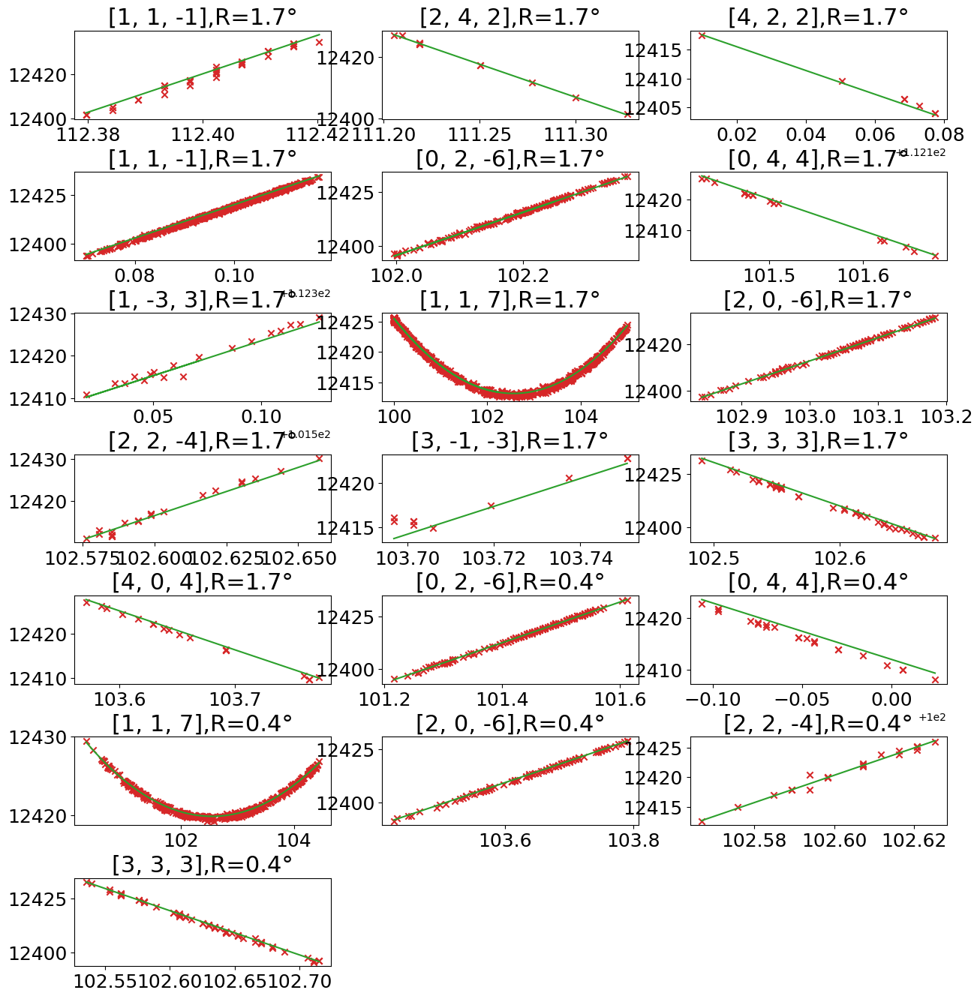

In [251]:
dPconv,dRconv,dYconv,dRPconv,Ecorr_conv,disp_HIREX_conv = [1.15497246, 0.61820617, -0.82300946,  0.01643269, -7.39200109, 0.10563662]#[ 1.15493998,  0.62175888, -0.82672809,  0.0163903,  -7.42058131,  0.10534615]


nlines = len(Hquery_acc)
ncols = min(3,nlines)
nrows = -(nlines // -3)

withGuess = False
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,figsize=(15,ncols*(5)+(ncols-1)*0.6),gridspec_kw={'hspace':0.6})

E_H_corr = [(E_H-Ecentral_orig)*disp_HIREX_conv/dEdP_orig + Ecentral_orig - Ecorr_conv for E_H in E_H_acc]

for i in range(nlines,axs.size):
    axs.flatten()[i].set_visible(False)
for Hidx,H in enumerate(Hquery_acc):
    lidx = HtoMeas_acc[Hidx]
    ax = axs.flatten()[Hidx]
    ax.set_title(f"{H},R={roll_acc[lidx]:.1f}°",fontsize=22)
    ax.tick_params(labelsize=18)
    if lidx is not None:
        peval = pitch_acc[lidx]
        if peval.size>0:
            EBragg,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPconv,dRconv,dYconv,dRPconv)
            EBragg = np.array(EBragg)
            

    #print(peval_sub.min(),peval_sub.max())
            ax.scatter(peval,E_H_corr[lidx],marker='x',color='tab:red')
            ax.plot(peval,EBragg,color='tab:green')
            if withGuess:
                EBragg_guess,_ = HXRSS_singleLine(json.loads(H),peval,[roll_acc[lidx]],dPguess,dRguess,dYguess,dRPguess)
                EBragg_guess = np.array(EBragg_guess) +Ecorrguess-Ecorrconv
                ax.plot(peval,EBragg_guess)

## more crossing